In [1]:
# standard packages for scientific computing and plotting
import numpy as np
import matplotlib.pyplot as plt

# for optimization
from scipy.optimize import minimize, root_scalar

# for just-in-time compilation and parallelization, to speed up code execution
from numba import jit
import multiprocess as mp


# to seed the random number generator
seed = 0   
np.random.seed(seed)
seed_offset = np.random.randint(2**32) # this will be an offset to added to all subsequent random seeding

# Problem specification

Here, the problem type \{DW (double-well), Rouse (Rouse polymer), WLC (worm-like-chain)\} is specified, along with problem-specific parameters. 

Also specified here is the protocol time $t_f$, timestep $dt$, maximum legendre number $m_\mathrm{max}$, and a random initial seed for initialization. 

Uncomment the relevant block. 

In [2]:
# parameters for DW are: E0 energy scale
# E0 = 16.0
# problemtype, problemparams = "DW", (E0,)
# lambda_i, lambda_f = -1.0, 1.0
# tf, dt = 0.1, 1e-3
# m_max = 4   # number of legendre basis functions




# parameters for Rouse are: number of beads, interbead spring constant,
n_beads, k = 20, 1.0
problemtype, problemparams = "Rouse", (n_beads, k)
lambda_i, lambda_f = 0.0, 20.0
tf, dt = 20.0, 1e-3  
m_max = 4   # number of legendre basis functions
print("t_f =", tf / (n_beads**2 / np.pi**2), "tau_Rouse")



# parameters for WLC are: number of beads, interbead spring constant, 
#                          (for first-last bead LJ interaction) sigma_LJ, epsilon_LJ, 
#                           pulling spring constant
# n_beads, k, sig_LJ, eps_LJ, k_ext = 15, 6.0, 4.0, 8.0, 100.0
# problemtype, problemparams = "WLC", (n_beads, k, sig_LJ, eps_LJ, k_ext)
# lambda_i, lambda_f = sig_LJ*(2**(1./6)), 0.9*n_beads
# tf, dt = 20.0, 1e-4 # 5.0, 1e-4
# m_max = 4   # number of legendre basis functions



N        = int(np.floor(tf / dt))
n_basis  = 3*(m_max+1) # 3 (one for each theta_{A,B,C}) x (m_max + 1)

t_f = 0.4934802200544679 tau_Rouse


# Dynamics

Here, for each problem type we implement $U_A(x), U_B(x), U_C(x)$ as well as $\nabla U_A(x), \nabla U_B(x), \nabla U_C(x)$, which are

## 1.

For the double well, $x \in \mathbb{R}$,
$$
U_A(x) = E_0 \bigg( \frac{(x^2 - 1)^2}{4} - \lambda_i x\bigg), \\
U_B(x) = E_0 \bigg( \frac{(x^2 - 1)^2}{4} - \lambda_f x\bigg), \\ 
U_C(x) = 0,
$$

where we set $U_C(x) = 0$ because $U_B(x) - U_A(x)$ is already linear in $x$;

## 2.

For the Rouse Polymer, $\vec{x} \in \mathbb{R}^{N - 1}$,
$$
U_A(x_1, x_2, ..., x_{N-1}) = \bigg\{ k \sum_{n=0}^{N - 1} \frac{(x_{n+1} - x)^2}{2} \ \bigg| \ x_0 = 0, x_N = \lambda_i \bigg\}, \\ 
U_B(x_1, x_2, ..., x_{N-1}) = \bigg\{ k \sum_{n=0}^{N - 1} \frac{(x_{n+1} - x)^2}{2} \ \bigg| \ x_0 = 0, x_N = \lambda_f \bigg\}, \\
U_C(x_1, x_2, ..., x_{N-1}) = - \sum_{n=1}^{N - 1} \frac{c_n x_{n}}{t_f},
$$

with 

$$
c_n = \langle x_n \rangle_B - \langle x_n \rangle_A = (\lambda_f - \lambda_i) \frac{n}{N};
$$

## 3. 

For the WLC，$\vec{\phi} \in \mathbb{R}^N$ 
$$
U_A(\vec{\phi}) = U_\mathrm{free}(\vec{\phi}) + k_\mathrm{ext} \frac{[R_x(\vec{\phi}) - \lambda_i]^2 + R_y(\vec{\phi})^2}{2}, \\
U_B(\vec{\phi}) = U_\mathrm{free}(\vec{\phi}) + k_\mathrm{ext} \frac{[R_x(\vec{\phi}) - \lambda_f]^2 + R_y(\vec{\phi})^2}{2}, \\
U_C(\vec{\phi}) = - \sum_{n=1}^N \frac{c_n \sum_{m = 1}^n \cos(\phi_m)}{t_f},
$$

where 

$$
U_\mathrm{free}(\vec{\phi}) = \bigg( k \sum_{n = 1}^{N-1} (1 - \cos(\phi_{n+1} - \phi_n)) \bigg) + 4\epsilon \bigg( \frac{\sigma^{12}}{R(\vec{\phi})^{12}} -  \frac{\sigma^{6}}{R(\vec{\phi})^6}  \bigg)
$$

is the free potential of the WLC-polymer with end-bead LJ interaction, with 

$$
R_x(\vec{\phi}) = \sum_{n=1}^N \cos(\phi_n), \quad R_y(\vec{\phi}) = \sum_{n=1}^N \sin(\phi_n), \quad R(\vec{\phi}) = \sqrt{R_x(\vec{\phi})^2 + R_y(\vec{\phi})^2}
$$

and

$$
c_n = \bigg\langle \sum_{m=1}^n \cos (\phi_m) \bigg\rangle_B - \bigg\langle \sum_{m=1}^n \cos (\phi_m) \bigg\rangle_A 
$$

is the quasi-counterdiabatic coefficient given by the displacement in equilibrium values of the positions of each bead, purely in the $x$ direction (due to $y \rightarrow -y$ symmetry of the system) -- this can only be calculated after having equilibrium samples.

In [3]:
if problemtype == "DW":     
    E0, = problemparams
    
    @jit(nopython=True)
    def U_A(x):
        return E0*((x**2 - 1)**2 / 4 - lambda_i*x)
    
    @jit(nopython=True)
    def U_B(x):
        return E0*((x**2 - 1)**2 / 4 - lambda_f*x)
    
    # because U_B(x) - U_A(x) = 2*E0*x, we don't need U_C(x), so it's set to zero 
    @jit(nopython=True)
    def U_C(x):
        return 0.0
    
    # in principle, grad_{A,B,C} may be obtained through automatic differentiation of U_{A,B,C}
    @jit(nopython=True)
    def gradU_A(x):
        return E0*(x**3 - x - lambda_i)

    @jit(nopython=True)
    def gradU_B(x):
        return E0*(x**3 - x - lambda_f)
    
    @jit(nopython=True)
    def gradU_C(x):
        return 0.0*x


if problemtype == "Rouse":
    n_beads, k = problemparams
    c_cd = (lambda_f - lambda_i)*np.arange(1, n_beads) / n_beads
                                  
    @jit(nopython=True)
    def U_A(x): # bead 0 tethered ot origin, bead N to lambda_i
        x_padded       = np.zeros(n_beads + 1) 
        x_padded[1:-1] = x
        x_padded[-1]   = lambda_i
        return 0.5*k*sum((x_padded[1:] - x_padded[:-1])**2)
    
    @jit(nopython=True)
    def U_B(x): # bead 0 tethered ot origin, bead N to lambda_f
        x_padded       = np.zeros(n_beads + 1) 
        x_padded[1:-1] = x
        x_padded[-1]   = lambda_f
        return 0.5*k*sum((x_padded[1:] - x_padded[:-1])**2)

    @jit(nopython=True)
    def U_C(x):
        return -np.dot(c_cd, x) / tf
    
    # in principle, grad_{A,B,C} may be obtained through automatic differentiation of U_{A,B,C}
    @jit(nopython=True)
    def gradU_A(x):
        x_padded       = np.zeros(n_beads + 1) 
        x_padded[1:-1] = x
        x_padded[-1]   = lambda_i
        return k*(2*x_padded[1:-1] - (x_padded[:-2] + x_padded[2:]))
    
    @jit(nopython=True)
    def gradU_B(x):  
        x_padded       = np.zeros(n_beads + 1) 
        x_padded[1:-1] = x
        x_padded[-1]   = lambda_f
        return k*(2*x_padded[1:-1] - (x_padded[:-2] + x_padded[2:]))
        
    @jit(nopython=True)
    def gradU_C(x):
        return -(c_cd / tf)


if problemtype == "WLC":
    n_beads, k, sig_LJ, eps_LJ, k_ext = problemparams 
    # the calculation of c_cd is deferred until initial conditions are drawn

    # U_free is potential of Rouse polymer without introduced pulling springs
    @jit(nopython=True)
    def U_LJ(x):
        x_N, y_N = np.sum(np.cos(x)), np.sum(np.sin(x))
        R2 = x_N**2 + y_N**2
        U_eval = 4*eps_LJ*(sig_LJ**12 / R2**6 - sig_LJ**6 / R2**3)
        return U_eval
    
    @jit(nopython=True)
    def U_phi(x):
        return k*np.sum(1 - np.cos(x[1:] - x[:-1]))
    
    @jit(nopython=True)
    def gradU_LJ(x):
        x_N, y_N = np.sum(np.cos(x)), np.sum(np.sin(x))
        R2 = x_N**2 + y_N**2
        gradU_eval = 4*eps_LJ*(-6*sig_LJ**12 / R2**7 + 3*sig_LJ**6 / R2**4)*(2*x_N*(-np.sin(x)) + 2*y_N*np.cos(x))
        return gradU_eval
    
    @jit(nopython=True)
    def gradU_phi(x):
        gradU_eval = np.zeros(len(x))
        gradU_eval[1:]  += k*np.sin(x[1:] - x[:-1])
        gradU_eval[:-1] += k*np.sin(x[:-1] - x[1:])
        return gradU_eval
    
    @jit(nopython=True)
    def U_A(x): # x is array of angles
        x_N, y_N = np.sum(np.cos(x)), np.sum(np.sin(x))
        R = np.sqrt(x_N**2 + y_N**2)
        return U_LJ(x) + U_phi(x) + (k_ext/2)*(R - lambda_i)**2
    
    @jit(nopython=True)
    def U_B(x): 
        x_N, y_N = np.sum(np.cos(x)), np.sum(np.sin(x))
        R = np.sqrt(x_N**2 + y_N**2)
        return U_LJ(x) + U_phi(x) + (k_ext/2)*(R - lambda_f)**2
    
    # not needed
    @jit(nopython=True)
    def U_C(x): 
        return -np.dot(c_cd, np.cumsum(np.cos(x))) * (1./tf)
    
    
    # in principle, grad_{A,B,C} and laplace_{A,B,C} may be obtained 
    #   through automatic differentiation on U_{A,B,C}
    @jit(nopython=True)
    def gradU_A(x):
        x_N, y_N = np.sum(np.cos(x)), np.sum(np.sin(x))
        R = np.sqrt(x_N**2 + y_N**2)
        return gradU_LJ(x) + gradU_phi(x) + k_ext*(R - lambda_i)*(-(x_N / R)*np.sin(x) + (y_N / R)*np.cos(x))
    
    @jit(nopython=True)
    def gradU_B(x):  
        x_N, y_N = np.sum(np.cos(x)), np.sum(np.sin(x))
        R = np.sqrt(x_N**2 + y_N**2)
        return gradU_LJ(x) + gradU_phi(x) + k_ext*(R - lambda_f)*(-(x_N / R)*np.sin(x) + (y_N / R)*np.cos(x))
    
    
    @jit(nopython=True)
    def gradU_C(x):
        x_ns, y_ns = np.cumsum(np.cos(x)), np.cumsum(np.sin(x))
        r_ns = np.sqrt(x_ns**2 + y_ns**2)
        
        gradU_eval = np.zeros(n_beads)
        for i in range(n_beads):
            gradU_eval[i] = -np.sum((c_cd*(-(x_ns / r_ns)*np.sin(x[i]) + (y_ns / r_ns)*np.cos(x[i])))[i:])
        return gradU_eval
    

# Sampling initial conditions

Here, initial conditions are sampled. 

## 1.

For the DW problem we can do this directly, as it is a 1d system. $\rho_A(x)$ and $\rho_B(x)$ are explicitly calculated for a fine 1d grid, which is input to np.random.choice to draw equilibrium samples.

## 2. 

For the Rouse polymer, random samples may be drawn by exploiting a normal-modes decomposition. We can write 

$$
U_{A,B}(x_1, x_2, ..., x_{N-1}) = \bar{U} \bigg(x_1 - \frac{\lambda_{i,f}}{N} , x_2 - \frac{2 \lambda_{i,f}}{N}, ..., x_{N-1} - \frac{(N - 1)\lambda_{i,f}}{N} \bigg) + \frac{k \lambda_{i,f}^2}{2N}
$$

where

$$
\bar{U}(\vec{y}) = \frac{\vec{y}^T K \vec{y}}{2} \quad\quad
K = 
 \begin{pmatrix} 
    2k & -k & & & &  \\
    -k & 2k &  -k & & \huge{0} &\\
       & -k & & \ddots & & \\
       &    &  \ddots & & -k &  \\ 
       &  \huge{0}  &   & -k & 2k & -k \\
       & &  & & -k & 2k
    \end{pmatrix}.
$$

Then, we can do an eigenmode decomposition of $K$, writing

$$
\bar{U}(\vec{y}) = \hat{U}(\vec{z}) = \sum_{n=1}^{N-1} \frac{\kappa_n z_n^2}{2}
$$

where 

$$
\kappa_n = 2\bigg[ 1 - \cos\bigg( \frac{\pi n }{N }\bigg) \bigg], z_n = \frac{1}{\pi}  \sum_{m=1}^{N-1} \sin\bigg( \frac{2 \pi n}{N} \bigg) y_n.
$$ 

Finally, for an individual initial condition, we draw $z_n \sim \mathcal{N}(0, (\beta \kappa_n)^{-1})$, as $\hat{\rho}(\vec{z}) \propto \prod \exp (-\beta \kappa_n z_n^2 / 2)$; then convert to $\vec{y}$ coordinates, before finally adding $x_n = y_n + n \lambda_{i,f} /N$ to get our initial condition. 

Incidentally, the $k \lambda_{i,f}^2 / 2N$ in the expression comparing $U_{A,B}(\vec{x})$ to $U(\vec{y})$ is, up to an addative constant, the free energy $F_{A,B}$.

# 3. 

We must resort to sampling initial conditions, which we do with a Metropolis-adjusted Langevin algorithm.

Displayed are some of the generated initial conditions


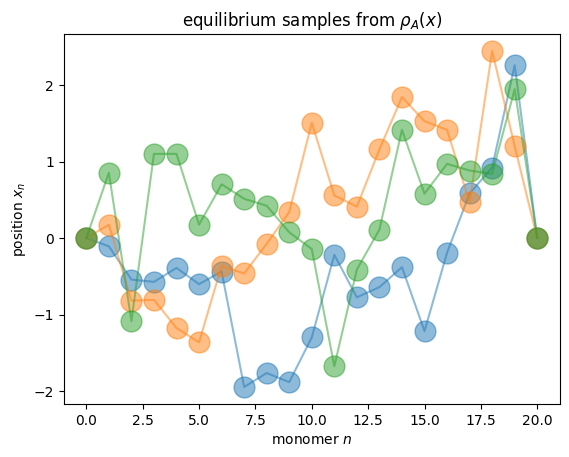

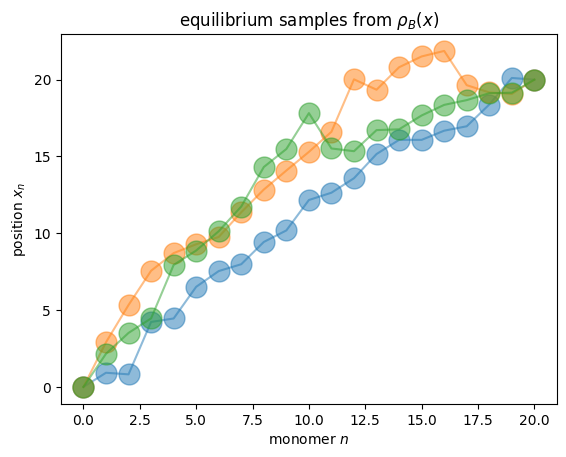

In [4]:
np.random.seed(seed_offset)

num_init_samples = 10000

if problemtype == "DW":
    # here, we will draw samples directly the 1d equilibrium distribution
    x_grid = np.linspace(-4, 4, 10000)
    U_A_grid, U_B_grid = np.zeros(len(x_grid)), np.zeros(len(x_grid))
    
    for i in range(len(x_grid)):
        U_A_grid[i] = U_A(x_grid[i])
        U_B_grid[i] = U_B(x_grid[i])

    # rho_A and rho_B are equilibrium distributions for U_A and U_B 
    rho_A_grid, rho_B_grid = np.exp(-np.array(U_A_grid)), np.exp(-np.array(U_B_grid))
    rho_A_grid, rho_B_grid = rho_A_grid / sum(rho_A_grid), rho_B_grid / sum(rho_B_grid)
    
    x0s_A = np.random.choice(x_grid, size=num_init_samples, replace=True, p=rho_A_grid)
    x0s_B = np.random.choice(x_grid, size=num_init_samples, replace=True, p=rho_B_grid)
    x0s_A, x0s_B = np.array((x0s_A,)).T, np.array((x0s_B,)).T
    
    print("We display equilibrium distributions and a histogram of the initial samples")
    plt.plot(x_grid, rho_A_grid / np.diff(x_grid)[0], color = 'b', label = r"$\rho_A(x)$", alpha = 0.5)
    plt.hist(x0s_A[:], density = True, bins = 200, label = "samples A")

    plt.plot(x_grid, rho_B_grid / np.diff(x_grid)[0],color = 'r', label = r"$\rho_B(x)$", alpha = 0.5)
    plt.hist(x0s_B[:], density = True, bins = 200, label = "samples B")

    plt.legend()
    plt.title(r"equilibrium samples from $\rho_A(x), \rho_B(x)$")
    plt.show()


if problemtype == "Rouse":
    
    x0s_A = np.zeros((num_init_samples, n_beads - 1))
    x0s_B = np.zeros((num_init_samples, n_beads - 1)) 
    
    # construct K matrix used for normal modes
    K = np.zeros((n_beads - 1, n_beads - 1))
    for n in range(n_beads - 1):
        K[n,n] = 2*k
        if n > 0:
            K[n, n-1] = -k
        if n < n_beads - 2:
            K[n, n+1] = -k
            
    kappas, normal_modes = np.linalg.eigh(K)

    for i in range(num_init_samples):
        z = 1/np.sqrt(kappas)*np.random.randn(n_beads - 1) # random normal mode amplitudes    
        y = np.dot(normal_modes, z) # back to position space
        # this gives the proper displacement to compensate for the last bead tethered to lambda_i
        x = y + lambda_i*(np.arange(n_beads - 1)+1) / n_beads
        x0s_A[i] = x

    for i in range(num_init_samples):
        z = 1/np.sqrt(kappas)*np.random.randn(n_beads - 1) # random normal mode amplitudes    
        y = np.dot(normal_modes, z) # back to position space
        # this gives the proper displacement to compensate for the last bead tethered to lambda_i
        x = y + lambda_f*(np.arange(n_beads - 1)+1) / n_beads
        x0s_B[i] = x

    print("Displayed are some of the generated initial conditions")

    plt.title(r"equilibrium samples from $\rho_A(x)$")
    for i in range(3):
        x_padded = (0,) + tuple(x0s_A[i]) + (lambda_i,)
        plt.plot(x_padded, '.-', ms = 30.0, alpha = 0.5)

    plt.xlabel("monomer $n$")
    plt.ylabel("position $x_n$")
    plt.show()




    plt.title(r"equilibrium samples from $\rho_B(x)$")
    for i in range(3):
        x_padded = (0,) + tuple(x0s_B[i]) + (lambda_f,)
        plt.plot(x_padded, '.-', ms = 30.0, alpha = 0.5)

    plt.xlabel("monomer $n$")
    plt.ylabel("position $x_n$")
    plt.show()       
        

if problemtype == "WLC":
    try:
        x0s_A = np.load("_".join(map(str, (problemtype,) + problemparams + (lambda_i, lambda_f))) + "_x0s_A.npy")
        x0s_B = np.load("_".join(map(str, (problemtype,) + problemparams + (lambda_i, lambda_f))) + "_x0s_B.npy")
    except:
        print("Error! You need to run generate-init-conditions-WLC.ipynb to get samples from U_A and U_B!")
    
    
    # shuffles data! 
    np.random.shuffle(x0s_A)
    np.random.shuffle(x0s_B)


    # here c_cd is calculated 
    average_r_A = np.mean(np.sqrt( 
        np.cumsum(np.cos(x0s_A), axis = 1)**2 + np.cumsum(np.sin(x0s_A), axis = 1)**2
    ), axis = 0)
    
    average_r_B = np.mean(np.sqrt( 
        np.cumsum(np.cos(x0s_B), axis = 1)**2 + np.cumsum(np.sin(x0s_B), axis = 1)**2
    ), axis = 0)
    
    c_cd = (average_r_B - average_r_A) / tf
    
    # plotting initial conditions 
    print("Displayed are some of the generated initial conditions")

    plt.title(r"equilibrium samples from $\rho_A(x)$")
    for i in range(5):
        x = x0s_A[i]
        r_x, r_y = np.zeros(n_beads + 1), np.zeros(n_beads+1)
        r_x[1:] = np.cumsum(np.cos(x))
        r_y[1:] = np.cumsum(np.sin(x))

        plt.plot(r_x, r_y, '.-')
        
        plt.scatter(0,0,color='red')
        plt.scatter(r_x[-1],r_y[-1],color='green')

        plt.xlim([-len(r_x), len(r_x)])
        plt.ylim([-len(r_x), len(r_y)])
        
    plt.show()

    plt.title(r"equilibrium samples from $\rho_B(x)$")
    for i in range(5):
        x = x0s_B[i]
        r_x, r_y = np.zeros(n_beads + 1), np.zeros(n_beads+1)
        r_x[1:] = np.cumsum(np.cos(x))
        r_y[1:] = np.cumsum(np.sin(x))

        plt.plot(r_x, r_y, '.-')
        
        plt.scatter(0,0,color='red')
        plt.scatter(r_x[-1],r_y[-1],color='green')

        plt.xlim([-len(r_x), len(r_x)])
        plt.ylim([-len(r_x), len(r_y)])
        
    plt.show()


# Traj(x)

This function computes a trajectory, and returns $(\mathsf{W}, \mathsf{a}_{\mu \nu}, \mathsf{b}_\mu, \mathsf{c},  \mathsf{\tilde{a}}_{\mu \nu}, \mathsf{\tilde{b}}_\mu, \mathsf{\tilde{c}}, \theta)$, as is explained in the SM. 

NOTE here, we implement one function, not two $\texttt{TrajF}$ and  $\texttt{TrajR}$ in the SM. For the reverse trajectory, we still output $(\mathsf{\tilde{W}}, \mathsf{\tilde{a}}_{\mu \nu}, \mathsf{\tilde{b}}_\mu, \mathsf{\tilde{c}}, \mathsf{a}_{\mu \nu}, \mathsf{b}_\mu, \mathsf{c}, \theta)$, but we have swapped the variable names (e.g. the variable $\texttt{a}$ refers to $\mathsf{\tilde{a}}_{\mu \nu}$, the variable $\texttt{a}$_ refers to $\mathsf{a}_{\mu \nu}$, ..., $\texttt{W}$ refers to $\tilde{W}$. In other words, the underscore here refers to "the opposite direction".)

Explicitly, this is to say the function outputs $(\mathsf{W}, \mathsf{a}_{\mu \nu}, \mathsf{b}_\mu, \mathsf{c}, \mathsf{\tilde{a}}_{\mu \nu}, \mathsf{\tilde{b}}_\mu, \mathsf{\tilde{c}}, \theta) = (\texttt{W, a, b, c, a_, b_, c_, theta})$ for the Forward ensemble, i.e. if $\texttt{forward == True}$; and $(\mathsf{\tilde{W}}, \mathsf{\tilde{a}}_{\mu \nu}, \mathsf{\tilde{b}}_\mu, \mathsf{\tilde{c}}, \mathsf{a}_{\mu \nu}, \mathsf{b}_\mu, \mathsf{c},  \theta)  = (\texttt{W, a, b, c, a_, b_, c_, theta})$ for the reverse ensemble, i.e. if $\texttt{forward == False}$.

In [5]:
@jit(nopython=True)
def traj(x0, dt, N, theta, legendre_vandermonde, forward, seed):
    """
    simulates a trajectory, returns scalar W, matrix a, vector b, scalar c, matrix a_, vector b_, scalar c, theta
    inputs:
      x0                      initial position -- assumed already to be drawn from rho_A or rho_B
      dt                      timestep
      N                       number of timesteps
      theta                   (theta_A, theta_B, theta_C)_{0,1} used to construct U_F / U_R
      legendre_vandermonde    vandermonde matrix
      forward                 boolean, whether trajectory is forward or reverse
    outputs:
      w, a, b, c, a_, b_, c_, theta 
    NOTE: 
      Here we implement one single function, not two. 
      For the reverse trajectory, (W, a, b, c, a_, b_, c_, theta) refer to 
        $(\tilde{W}, \tilde{a}_{\mu \nu}, \tilde{b}_\mu, \tilde{c}, a_{\mu\nu}, b_\mu, c, \theta)$. 
      In other words, the underscore signifies "in the opposite direction", not necessarily "reverse ensemble". 
    """
    
    # seeds random number generator
    np.random.seed((seed + seed_offset) % (2**32))
    
    # splits theta to theta_F and theta_R
    theta_F, theta_R = theta[:n_basis], theta[n_basis:]
    
    # initializes variables
    x, a, b, a_, b_ = (
        x0.copy(),
        np.zeros((n_basis, n_basis)), np.zeros(n_basis), 
        np.zeros((n_basis, n_basis)), np.zeros(n_basis), 
    )

    if forward:
        theta_traj = theta_F 
        
    else: 
        theta_traj = theta_R
    
    # evaluate for x0
    gradU_A_eval, gradU_B_eval, gradU_C_eval = gradU_A(x), gradU_B(x), gradU_C(x)
    
    # loop to produce trajectories
    for n in range(N): # timesteps
        # update legendre_vec
        if forward:
            legendre_vec = legendre_vandermonde[n]
        else: # for a trajectory in the reverse ensemble, substitute n -> (N - 1) - n
            legendre_vec = legendre_vandermonde[(N - 1) - n] 
        
        # this gets the evaluated U_\mu values
        gradU_partial = np.concatenate((np.outer(legendre_vec, gradU_A_eval), 
                                        np.outer(legendre_vec, gradU_B_eval),
                                        np.outer(legendre_vec, gradU_C_eval)))
        
        gradU_eval = np.dot(theta_traj, gradU_partial)
        dB = np.sqrt(dt)*np.random.randn(len(x))
        dx = -gradU_eval*dt + np.sqrt(2)*dB
        
        gradU_A_eval_, gradU_B_eval_, gradU_C_eval_ = gradU_A(x + dx), gradU_B(x + dx), gradU_C(x + dx)
        
        gradU_partial_ = np.concatenate((np.outer(legendre_vec, gradU_A_eval_), 
                                         np.outer(legendre_vec, gradU_B_eval_),
                                         np.outer(legendre_vec, gradU_C_eval_)))
        
        a  = a  + np.dot(gradU_partial, gradU_partial.T)*dt/4
        b  = b  + np.dot(gradU_partial, dx)/2
        a_ = a_ + np.dot(gradU_partial_, gradU_partial_.T)*dt/4
        b_ = b_ - np.dot(gradU_partial_, dx)/2
        x  = x  + dx
        
        gradU_A_eval, gradU_B_eval, gradU_C_eval = gradU_A_eval_, gradU_B_eval_, gradU_C_eval_
        
        
    # last increment for c   
    if forward:
        c, c_ = U_A(x0), U_B(x)
        # print(x, x0)
        w = (-(np.dot(theta_F, np.dot(a , theta_F)) + np.dot(theta_F, b ) + c ) + 
              (np.dot(theta_R, np.dot(a_, theta_R)) + np.dot(theta_R, b_) + c_))
        
    else:
        c, c_ = U_B(x0), U_A(x) 
        w = (-(np.dot(theta_R, np.dot(a , theta_R)) + np.dot(theta_R, b ) + c ) + 
              (np.dot(theta_F, np.dot(a_, theta_F)) + np.dot(theta_F, b_) + c_))
    
    return w, a, b, c, a_, b_, c_, theta
        


# BAR estimator 

Here we have code that returns the BAR estimator for $\Delta F$ for arrays of forward and reverse work measurements $\{\mathsf{W}_F\}$ and $\{\mathsf{W}_R \}$ ; as well as an estimate for the estimator variance (cf Eq. (10) of Shirts et al. 2003).

In [6]:
# scripts responsible for calculating BAR estimator (and estimating variance)

@jit(nopython=True)
def BAR_constraint(dF, W_Fs, W_Rs):
    M = np.log(len(W_Fs) / len(W_Rs))
    return sum(1 / (1 + np.exp(W_Fs + M - dF))) - sum(1 / (1 + np.exp(W_Rs - (M - dF))))


@jit(nopython=True)
def BAR_variance(dF, W_Fs, W_Rs):
    n_tot = len(W_Fs) + len(W_Rs)
    M = np.log(len(W_Fs) / len(W_Rs))
    I_total = 0.5*(sum(1 / (1 + np.cosh(W_Fs + M - dF))) + sum(1 / (1 + np.cosh(W_Rs - (M - dF)))))
    return ((1.0 / I_total) - (1.0/len(W_Fs) + 1.0/len(W_Rs)))
    

# Functions for optimization

Here, we implement a function $\texttt{IS_log_r_and_w}$ that for each forward and reverse sample, returns the importance sampling log-likelihood ratio $\log \mathsf{r}^i(\theta)$ and the importance sampling work $\mathsf{w}^i(\theta)$, using $(\mathsf{W}, \mathsf{a}_{\mu \nu}, \mathsf{b}_\mu, \mathsf{c}, \mathsf{\tilde{a}}_{\mu \nu}, \mathsf{\tilde{b}}_\mu, \mathsf{\tilde{c}}, \theta)$ for the sampled forward ensemble, and $(\mathsf{\tilde{W}}, \mathsf{\tilde{a}}_{\mu \nu}, \mathsf{\tilde{b}}_\mu, \mathsf{\tilde{c}}, \mathsf{a}_{\mu \nu}, \mathsf{b}_\mu, \mathsf{c},  \theta)$ for the reverse. Recall, for both ensembles, $(\texttt{W, a, b, c, a_, b_, c_, theta})$ is stored for each trajectory and represents the above. 

From $\texttt{IS_log_r_and_w}$ the importance sampling function $\texttt{J} = \hat{J}(\theta) = \hat{J}_F(\theta) + \hat{J}_R(\theta)$ and the effective sampling size functions $\texttt{n_eff} = \{ n^{\mathrm{eff}}_F(\theta)$, $n^{\mathrm{eff}}_R(\theta) \}$, may be easily calculated.

We have explicitly written out the parameter gradients $\texttt{thetagrad_J} = \nabla_\theta J(\theta)$, $\texttt{thetagrad_n_eff} = \{ \nabla_\theta n^\mathrm{eff}_F(\theta),  \nabla_\theta n^\mathrm{eff}_R(\theta) \}$ in that it speeds up the optimization. In principle these functions are obtainable through Automatic Differentiation. 

Finally, the function $\texttt{optimize_theta_minibatch}$ draws a minibatch of size $\texttt{n_minibatch}$ from the forward samples and the reverse samples, and solves the optimization problem 

$$
\theta^* = \mathrm{argmin}_\theta \{ \hat{J}(\theta) \ | \ n^\mathrm{eff}_F(\theta) ,  n^\mathrm{eff}_R(\theta) \geq  f \times \texttt{n_minibatch} \}.
$$

Some final details: the cost function offset by $1000$ and multiplicatively scaled with an adjustable $\texttt{wrapper_factor}$. We set optimization search bounds $|\theta^\mu| \leq 10$ for all $\mu$; and added an additional constraint on $\theta$, that the corresponding $\lambda_A(t) + \lambda_B(t) \geq 0$ for all $t \in [0, t_f]$ for both forward and reverse protocols so that the potential remains always confining. (This seems to be only needed for the double well problem, with a small $tf < 1$.)

In [7]:
def IS_log_r_and_w(theta, samples_F, samples_R):
    "this calculates an array of theta, samples_F, samples_R"
    theta_F, theta_R = theta[:n_basis], theta[n_basis:]
    
    n_samples = len(samples_F)     # assuming that len(samples_F) = len(samples_R)
    
    log_r_Fs, log_r_Rs = np.zeros(n_samples), np.zeros(n_samples)
    w_Fs, w_Rs = np.zeros(n_samples), np.zeros(n_samples)
    
    for i in range(n_samples): 
        W_s, a, b, c, a_, b_, c_, theta_s = samples_F[i]        # theta_s is the saved theta from the sample
        theta_F_s, theta_R_s = theta_s[:n_basis], theta_s[n_basis:]
        
        log_r_F = (-(np.dot(theta_F  , np.dot(a, theta_F  )) + np.dot(theta_F  , b)) + 
                    (np.dot(theta_F_s, np.dot(a, theta_F_s)) + np.dot(theta_F_s, b)))
        w_F     = (-(np.dot(theta_F, np.dot(a , theta_F)) + np.dot(theta_F, b ) + c ) +
                    (np.dot(theta_R, np.dot(a_, theta_R)) + np.dot(theta_R, b_) + c_))
        
        log_r_Fs[i] = log_r_F
        w_Fs[i]     = w_F
        
    for i in range(n_samples): 
        W_s, a, b, c, a_, b_, c_, theta_s = samples_R[i]
        theta_F_s, theta_R_s = theta_s[:n_basis], theta_s[n_basis:]
        
        log_r_R = (-(np.dot(theta_R  , np.dot(a, theta_R  )) + np.dot(theta_R  , b)) + 
                    (np.dot(theta_R_s, np.dot(a, theta_R_s)) + np.dot(theta_R_s, b)))
        
        w_R     = (-(np.dot(theta_R, np.dot(a , theta_R)) + np.dot(theta_R, b ) + c ) +
                    (np.dot(theta_F, np.dot(a_, theta_F)) + np.dot(theta_F, b_) + c_))
        
        log_r_Rs[i] = log_r_R
        w_Rs[i]     = w_R
        
    return (log_r_Fs, w_Fs, log_r_Rs, w_Rs,)


def J(theta, samples_F, samples_R):
    "returns cost: importance sample work(theta)"
    log_r_Fs, w_Fs, log_r_Rs, w_Rs = IS_log_r_and_w(theta, samples_F, samples_R)

    # we offset and then exponentiate; and then we normalize
    r_Fs, r_Rs = np.exp(log_r_Fs - max(log_r_Fs)), np.exp(log_r_Rs - max(log_r_Rs))
    r_Fs, r_Rs = r_Fs / sum(r_Fs), r_Rs / sum(r_Rs)

    return np.dot(r_Fs, w_Fs) + np.dot(r_Rs, w_Rs) # total work! 


def n_eff(theta, samples_F, samples_R):
    "returns n_eff_F(theta), n_eff_R(theta)"    
    log_r_Fs, w_Fs, log_r_Rs, w_Rs = IS_log_r_and_w(theta, samples_F, samples_R)          
    
    # we offset and then exponentiate; and then we divide
    r_Fs, r_Rs = np.exp(log_r_Fs - max(log_r_Fs)), np.exp(log_r_Rs - max(log_r_Rs))
    r_Fs, r_Rs = r_Fs / sum(r_Fs), r_Rs / sum(r_Rs)    
    
    # sum(r_Fs) = sum(r_Rs) = 1 already, so numerator can just be set to 1
    return 1./sum(r_Fs**2), 1./sum(r_Rs**2) 



    
# to speed up scipy.optimize, we manually write out the theta-gradients of each of the above. 
# in principle, this may be obtained through automatic differentiation
def thetagrad_IS_log_r_and_w(theta, samples_F, samples_R):
    "this calculates an array of theta, samples_F, samples_R"
    
    theta_F, theta_R = theta[:n_basis], theta[n_basis:]
    n_samples = len(samples_F)
    
    thetagrad_log_r_Fs, thetagrad_log_r_Rs = np.zeros((n_samples, 2*n_basis)), np.zeros((n_samples, 2*n_basis))
    thetagrad_w_Fs, thetagrad_w_Rs = np.zeros((n_samples, 2*n_basis)), np.zeros((n_samples, 2*n_basis))
        
    for i in range(n_samples): 
        W_s, a, b, c, a_, b_, c_, theta_s = samples_F[i]           # theta_s is the saved theta from the sample
        
        thetagrad_log_r_F = np.zeros(2*n_basis)
        thetagrad_log_r_F[:n_basis] = -2*np.dot(a, theta_F) - b    # theta_F terms
        
        thetagrad_w_F     = np.zeros(2*n_basis)
        thetagrad_w_F[:n_basis] = -2*np.dot(a , theta_F) - b       # theta_F terms
        thetagrad_w_F[n_basis:] = +2*np.dot(a_, theta_R) + b_      # theta_R terms

        thetagrad_log_r_Fs[i] = thetagrad_log_r_F
        thetagrad_w_Fs[i] =  thetagrad_w_F

        
    for i in range(n_samples): 
        W_s, a, b, c, a_, b_, c_, theta_s = samples_R[i]

        thetagrad_log_r_R = np.zeros(2*n_basis)
        thetagrad_log_r_R[n_basis:] = -2*np.dot(a, theta_R) - b   # theta_R terms
        
        thetagrad_w_R     = np.zeros(2*n_basis)
        thetagrad_w_R[:n_basis] = +2*np.dot(a_, theta_F) + b_     # theta_F terms
        thetagrad_w_R[n_basis:] = -2*np.dot(a , theta_R) - b      # theta_R terms
        
        thetagrad_log_r_Rs[i] = thetagrad_log_r_R
        thetagrad_w_Rs[i] = thetagrad_w_R       
        
    return thetagrad_log_r_Fs, thetagrad_w_Fs, thetagrad_log_r_Rs, thetagrad_w_Rs


def thetagrad_J(theta, samples_F, samples_R):
    "returns theta gradient of J"
    
    log_r_Fs, w_Fs, log_r_Rs, w_Rs = IS_log_r_and_w(theta, samples_F, samples_R)         
    thetagrad_log_r_Fs, thetagrad_w_Fs, thetagrad_log_r_Rs, thetagrad_w_Rs = thetagrad_IS_log_r_and_w(theta, samples_F, samples_R)

    # we offset and then exponentiate; and then we divide
    r_Fs, r_Rs = np.exp(log_r_Fs - max(log_r_Fs)), np.exp(log_r_Rs - max(log_r_Rs))
    r_Fs, r_Rs = r_Fs / sum(r_Fs), r_Rs / sum(r_Rs)    
                                                
    return (np.dot(r_Fs, thetagrad_w_Fs + (thetagrad_log_r_Fs.T*(w_Fs - np.dot(r_Fs, w_Fs))).T) + 
            np.dot(r_Rs, thetagrad_w_Rs + (thetagrad_log_r_Rs.T*(w_Rs - np.dot(r_Rs, w_Rs))).T))
            

def thetagrad_n_eff(theta, samples_F, samples_R):
    "returns theta-gradient of n_eff"
    log_r_Fs, w_Fs, log_r_Rs, w_Rs = IS_log_r_and_w(theta, samples_F, samples_R)         
    thetagrad_log_r_Fs, thetagrad_w_Fs, thetagrad_log_r_Rs, thetagrad_w_Rs = thetagrad_IS_log_r_and_w(theta, samples_F, samples_R)

    n_eff_F, n_eff_R = n_eff(theta, samples_F, samples_R)
    
    # we offset and then exponentiate; and then we divide
    r_Fs, r_Rs = np.exp(log_r_Fs - max(log_r_Fs)), np.exp(log_r_Rs - max(log_r_Rs))
    r_Fs, r_Rs = r_Fs / sum(r_Fs), r_Rs / sum(r_Rs)    
    
    return (2*n_eff_F*(np.dot(r_Fs, thetagrad_log_r_Fs) - np.dot(r_Fs**2, thetagrad_log_r_Fs)/np.sum(r_Fs**2)),
            2*n_eff_R*(np.dot(r_Rs, thetagrad_log_r_Rs) - np.dot(r_Rs**2, thetagrad_log_r_Rs)/np.sum(r_Rs**2)))


def optimize_theta_minibatch(theta_guess, samples_F_total, samples_R_total, 
                             n_minibatch, constraint_fraction, seed):
    np.random.seed((seed_offset + seed) % (2**32)) 

    # making new minibatch: use the most recent n_iter samples; and n_iter samples randomly drawn from the rest
    # from ML literature, minibatches w/o replacement have better convergence
    samples_F, samples_R = [], []

    for i in np.random.choice(len(samples_F_total), n_minibatch, replace=False): 
        samples_F.append(samples_F_total[i])

    for i in np.random.choice(len(samples_R_total), n_minibatch, replace=False):
        samples_R.append(samples_R_total[i])
        
    
    # constructs new constraint eqs. to feed into scipy.optimize.minimize 
    # these functions can only have (theta) as their argument - thus their construction
    def constraint_n_eff_F(theta):
        n_eff_F, n_eff_R = n_eff(theta, samples_F, samples_R)
        return n_eff_F - constraint_fraction*n_minibatch

    def constraint_n_eff_R(theta):
        n_eff_F, n_eff_R = n_eff(theta, samples_F, samples_R)
        return n_eff_R - constraint_fraction*n_minibatch

    def thetagrad_constraint_n_eff_F(theta):
        thetagrad_n_eff_F, thetagrad_n_eff_R = thetagrad_n_eff(theta, samples_F, samples_R)        
        return thetagrad_n_eff_F

    def thetagrad_constraint_n_eff_R(theta):
        thetagrad_n_eff_F, thetagrad_n_eff_R = thetagrad_n_eff(theta, samples_F, samples_R)        
        return thetagrad_n_eff_R
    
        
    # these are to ensure that that lambda_A(t) + lambda_B(t) > 0.1 for all t; otherwise escape may occur!
    # 0.1 is set arbitrarily; can 
    def constraint_min_lambda_F(theta):
        theta_traj = theta[:n_basis] # theta_F
        theta_A, theta_B = theta_traj[:(m_max+1)], theta_traj[(m_max+1):2*(m_max+1)]
        lambdas_A = np.polynomial.legendre.legval(np.linspace(-1, 1, 100), theta_A)
        lambdas_B = np.polynomial.legendre.legval(np.linspace(-1, 1, 100), theta_B)        
        return min(lambdas_A + lambdas_B)

    def constraint_min_lambda_R(theta):
        theta_traj = theta[n_basis:] # theta_R 
        theta_A, theta_B = theta_traj[:(m_max+1)], theta_traj[(m_max+1):2*(m_max+1)]
        lambdas_A = np.polynomial.legendre.legval(np.linspace(-1, 1, 100), theta_A)
        lambdas_B = np.polynomial.legendre.legval(np.linspace(-1, 1, 100), theta_B)        
        return min(lambdas_A + lambdas_B)
    
    # objective function needs to be rescaled in order to work
    def J_wrapper(theta):
        return wrapper_factor*(1000.0 + J(theta, samples_F, samples_R))
    
    def thetagrad_J_wrapper(theta):
        return wrapper_factor*thetagrad_J(theta, samples_F, samples_R)
    

    results = minimize(
        J_wrapper, theta_guess, 
        jac = thetagrad_J_wrapper,
        constraints = (
            {'type':'ineq', 'fun': constraint_n_eff_F, 
             'jac': thetagrad_constraint_n_eff_F},
            {'type':'ineq', 'fun': constraint_n_eff_R, 
             'jac': thetagrad_constraint_n_eff_R},
            {'type':'ineq', 'fun': constraint_min_lambda_F},
            {'type':'ineq', 'fun': constraint_min_lambda_R},
        ),
        bounds = (2*n_basis*((-10, 10),)),
        options = {'maxiter': 500, 'ftol': 1e-8 }, 
    )

    return results 

# Plotting script

These scripts help visualize the protocol: ploting a protocol $\theta$; extracting the work measurements $\{\mathsf{W}\}$ from samples $\{ (\mathsf{W}, \mathsf{a}_{\mu \nu}, \mathsf{b}_\mu, \mathsf{c}, \mathsf{\tilde{a}}_{\mu \nu}, \mathsf{\tilde{b}}_\mu, \mathsf{\tilde{c}}, \theta) \}$ ; as well as plotting a histogram of forward and reverse measurements, which may be weighted by importance sample weights $\mathsf{r}^{(i)}(\theta) \, \big/ \sum_{j} \mathsf{r}^{(j)}(\theta).$ 

In [8]:
def plot_protocol(theta):
    "visualize forward / reverse protocols"
    theta_F, theta_R = theta[:n_basis], theta[n_basis:]    
    
    theta_0 = (theta_F + theta_R)/2
    theta_1 = (theta_F - theta_R)/2
    
    
    ts = (-0.2*tf, 0.0) + tuple(np.linspace(0, tf, 100)) + (tf, 1.2*tf)    
    lambdas_A = np.polynomial.legendre.legval(np.linspace(-1, 1, 100), theta_F[:(m_max+1)])
    lambdas_B = np.polynomial.legendre.legval(np.linspace(-1, 1, 100), theta_F[(m_max+1):2*(m_max+1)])
    lambdas_C = np.polynomial.legendre.legval(np.linspace(-1, 1, 100), theta_F[2*(m_max+1):])
    
    plt.plot(ts, (1., 1.,) + tuple(lambdas_A) + (0., 0.,), label = r"$\lambda_A(t)$")
    plt.plot(ts, (0., 0.,) + tuple(lambdas_B) + (1., 1.,), label = r"$\lambda_B(t)$")
    plt.plot(ts, (0., 0.,) + tuple(lambdas_C) + (0., 0.,), label = r"$\lambda_C(t)$")
    plt.xlabel(r"$t$")
    plt.ylabel(r"$\lambda(t)$")
    plt.title(r"$U_F$")
    plt.legend()
    plt.show() 
    
    ts = (-0.2*tf, 0.0) + tuple(np.linspace(0, tf, 100)) + (tf, 1.2*tf)    
    lambdas_A = np.polynomial.legendre.legval(np.linspace(-1, 1, 100), theta_R[:(m_max+1)])
    lambdas_B = np.polynomial.legendre.legval(np.linspace(-1, 1, 100), theta_R[(m_max+1):2*(m_max+1)])
    lambdas_C = np.polynomial.legendre.legval(np.linspace(-1, 1, 100), theta_R[2*(m_max+1):])
    
    plt.plot(ts, (1., 1.,) + tuple(lambdas_A) + (0., 0.,), label = r"$\lambda_A(t)$")
    plt.plot(ts, (0., 0.,) + tuple(lambdas_B) + (1., 1.,), label = r"$\lambda_B(t)$")
    plt.plot(ts, (0., 0.,) + tuple(lambdas_C) + (0., 0.,), label = r"$\lambda_C(t)$")
    plt.xlabel(r"$t$")
    plt.ylabel(r"$\lambda(t)$")
    plt.title(r"$U_R$")
    plt.legend()
    plt.show()
    
    
    ts = (-0.2*tf, 0.0) + tuple(np.linspace(0, tf, 100)) + (tf, 1.2*tf)    
    lambdas_A = np.polynomial.legendre.legval(np.linspace(-1, 1, 100), theta_0[:(m_max+1)])
    lambdas_B = np.polynomial.legendre.legval(np.linspace(-1, 1, 100), theta_0[(m_max+1):2*(m_max+1)])
    lambdas_C = np.polynomial.legendre.legval(np.linspace(-1, 1, 100), theta_0[2*(m_max+1):])
    
    plt.plot(ts, (1., 1.,) + tuple(lambdas_A) + (0., 0.,), label = r"$\lambda_A(t)$")
    plt.plot(ts, (0., 0.,) + tuple(lambdas_B) + (1., 1.,), label = r"$\lambda_B(t)$")
    plt.plot(ts, (0., 0.,) + tuple(lambdas_C) + (0., 0.,), label = r"$\lambda_C(t)$")
    plt.xlabel(r"$t$")
    plt.ylabel(r"$\lambda(t)$")
    plt.title(r"$U_0$")
    plt.legend()
    plt.show() 
    
    ts = (-0.2*tf, 0.0) + tuple(np.linspace(0, tf, 100)) + (tf, 1.2*tf)    
    lambdas_A = np.polynomial.legendre.legval(np.linspace(-1, 1, 100), theta_1[:(m_max+1)])
    lambdas_B = np.polynomial.legendre.legval(np.linspace(-1, 1, 100), theta_1[(m_max+1):2*(m_max+1)])
    lambdas_C = np.polynomial.legendre.legval(np.linspace(-1, 1, 100), theta_1[2*(m_max+1):])
    
    plt.plot(ts, (0., 0.,) + tuple(lambdas_A) + (0., 0.,), label = r"$\lambda_A(t)$")
    plt.plot(ts, (0., 0.,) + tuple(lambdas_B) + (0., 0.,), label = r"$\lambda_B(t)$")
    plt.plot(ts, (0., 0.,) + tuple(lambdas_C) + (0., 0.,), label = r"$\lambda_C(t)$")
    plt.xlabel(r"$t$")
    plt.ylabel(r"$\lambda(t)$")
    plt.title(r"$U_1$")
    plt.legend()
    
    
    
    
    
def get_Ws(samples_F, samples_R):
    "extracts the works from the samples"
    W_Fs, W_Rs = np.zeros(len(samples_F)), np.zeros(len(samples_R))
    for i in range(len(samples_F)): 
        W_Fs[i] = float(samples_F[i][0])
    for i in range(len(samples_R)): 
        W_Rs[i] = float(samples_R[i][0])
    return np.array(W_Fs), np.array(W_Rs)
    
    
def plot_work_distribution(samples_F, samples_R, theta = None, bins = 50, shaded = True):
    """
    plots empirical work distribution P_F(W) and P_R(-W)
    -- with the additional optional importance sampling argument theta, which modulates and weights appropraitely!
    """
    if shaded:
        histtype, alpha = "stepfilled", 0.5
    else:
        histtype, alpha = "step", 1.0
    
    if theta is None:
        W_Fs, W_Rs = get_Ws(samples_F, samples_R)
        plt.hist(W_Fs, bins = bins, density = True, histtype = histtype, alpha = alpha)
        plt.hist(-W_Rs, bins = bins, density = True, histtype = histtype, alpha = alpha)
    else:        
        log_r_Fs, W_Fs, log_r_Rs, W_Rs = IS_log_r_and_w(theta, samples_F, samples_R)
        r_Fs, r_Rs = np.exp(log_r_Fs - max(log_r_Fs)), np.exp(log_r_Rs - max(log_r_Rs))
        r_Fs, r_Rs = r_Fs / sum(r_Fs), r_Rs / sum(r_Rs)
        plt.hist(W_Fs, bins = bins, density = True, histtype = histtype, alpha = alpha, weights = r_Fs)
        plt.hist(-W_Rs, bins = bins, density = True, histtype = histtype, alpha = alpha, weights = r_Rs)
    plt.xlabel("W")


# Drawing initial trajectories!

Finally, we're ready to start! Here we run our initial trajectories with the naive protocol, and plot the collected forward and reverse work samples.

visualizing initial Forward and Reverse protocols


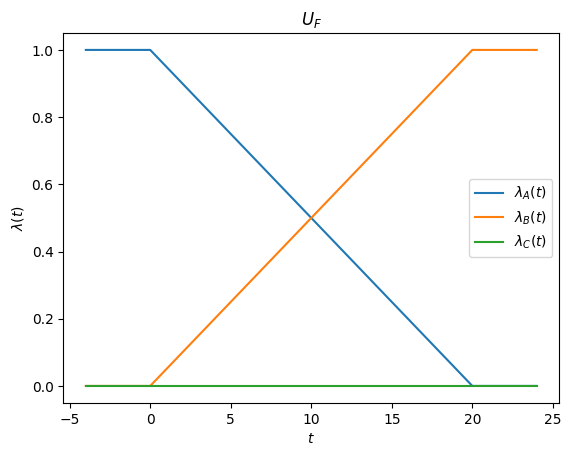

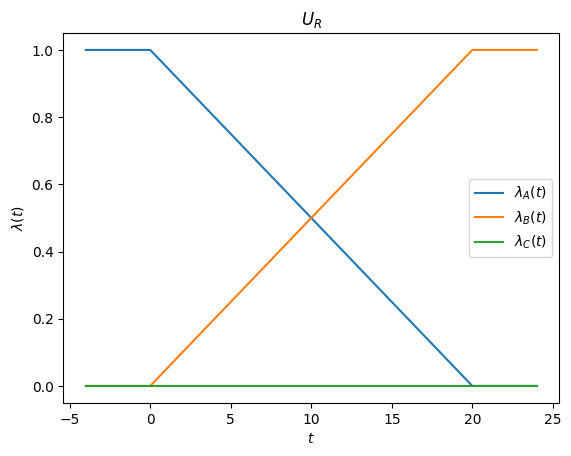

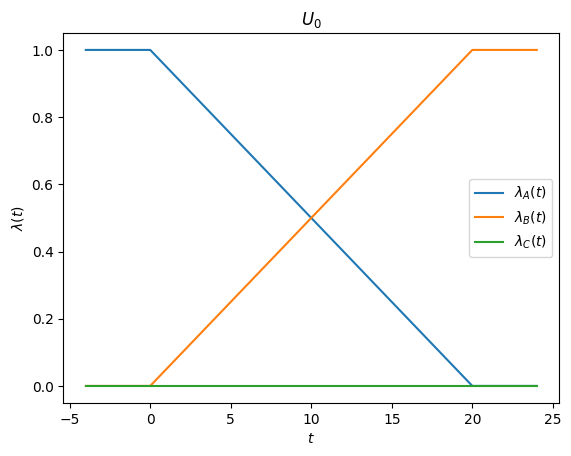

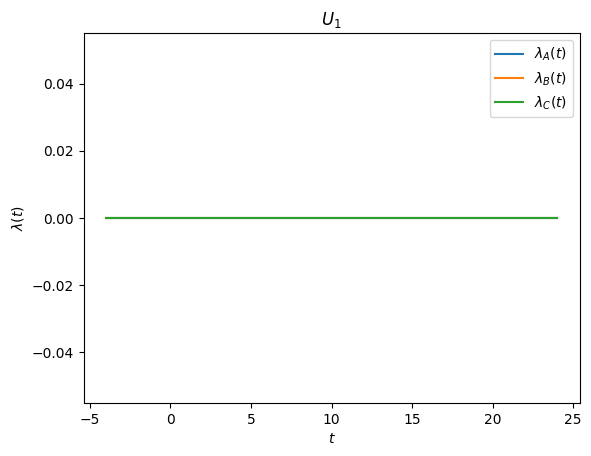

Running initial trajectories now -- parallelized with Pool()
Done!


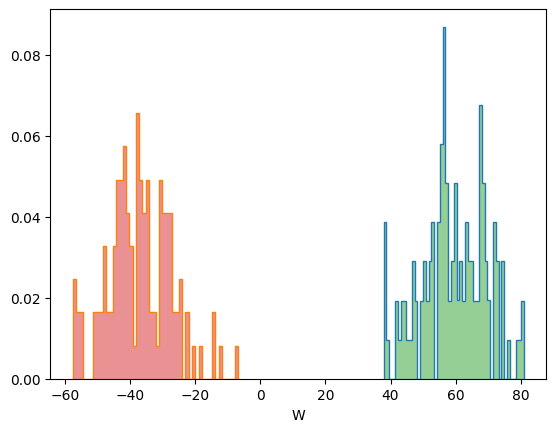

In [9]:
# initial number of samples
n_sample_init = 120

# we pre-evaluate the legendre vandermonde matrix, used to evaluate Legendre polynomials P_l(t) at discrete time-steps
legendre_vandermonde = np.polynomial.legendre.legvander(-1 + 2*(np.arange(N) + 0.5)/N, m_max)

# linear naive protocol
theta_A, theta_B, theta_C = (0.5, -0.5,) + (m_max - 1)*(0.,), (0.5, 0.5,) + (m_max - 1)*(0.,),  (m_max + 1)*(0.,)
theta_F, theta_R = np.array(theta_A + theta_B + theta_C), np.array(theta_A + theta_B + theta_C)
theta_init = np.concatenate((theta_F, theta_R))

print("visualizing initial Forward and Reverse protocols")
plot_protocol(theta_init)
plt.show()

print("Running initial trajectories now -- parallelized with Pool()")
traj_inputs = [] 
for i in range(n_sample_init):
    x0, seed = x0s_A[i],i
    traj_inputs.append((x0, dt, N, theta_init, legendre_vandermonde, True, seed),) 
    
for i in range(n_sample_init):
    x0, seed = x0s_B[i], -1 - i # random seed in negative direction
    traj_inputs.append((x0, dt, N, theta_init, legendre_vandermonde, False, seed),)

with mp.Pool() as pool:
    samples_pool = pool.starmap(traj, traj_inputs)

samples_F_total, samples_R_total = samples_pool[:n_sample_init], samples_pool[n_sample_init:]
samples_F_init, samples_R_init = samples_F_total[:], samples_R_total[:]

print("Done!")

plot_work_distribution(samples_F_total, samples_R_total, shaded=False)
plot_work_distribution(samples_F_total, samples_R_total, shaded=True)
plt.show()

# Starting protocol optimization! 

The next two code blocks perform the protocol optimization. 

For convenience, the first code block resets the protocol to the initialized naive protocol and samples to the initialized samples. 

The second block runs the optimization loop, after hyperparameters are specified!

In [10]:
print("resets to old samples")

samples_F_total = samples_F_init[::]
samples_R_total = samples_R_init[::]

theta = theta_init.copy()

dF_estimator_hist     = []
dF_variance_hist      = []
dF_variance_curr_hist = []

iter_ = 0

 
W_Fs, W_Rs = get_Ws(samples_F_total, samples_R_total)
dF_guess = (np.mean(W_Fs) + np.mean(-W_Rs))/2
print(f"dF guess: {dF_guess}")

dF = root_scalar(BAR_constraint, x0 = dF_guess, x1 = dF_guess + 0.1, args = (W_Fs, W_Rs)).root
dF_guess = dF # update guess for future iterations

print(f"starting dF estimate {dF} +/- {np.sqrt(BAR_variance(dF, W_Fs, W_Rs))}")
print(f"starting variance*n_samples {len(samples_F_total)*BAR_variance(dF, W_Fs, W_Rs)}")

dF_estimator_hist.append(dF)
dF_variance_hist.append(len(samples_F_total)*BAR_variance(dF, W_Fs, W_Rs))
dF_variance_curr_hist.append(len(samples_F_total)*BAR_variance(dF, W_Fs, W_Rs))

resets to old samples
dF guess: 11.021731199471422
starting dF estimate 14.931396628004316 +/- 36439.87625089877
starting variance*n_samples 159343749741.69797


we have 120 F samples 120 R samples
starting protocol optimization
20 of 20 terminated with a single fn evaluation
need to increase wrapper_factor, now 2e-08

we have 120 F samples 120 R samples
starting protocol optimization
20 of 20 terminated with a single fn evaluation
need to increase wrapper_factor, now 4e-08

we have 120 F samples 120 R samples
starting protocol optimization
20 of 20 terminated with a single fn evaluation
need to increase wrapper_factor, now 8e-08

we have 120 F samples 120 R samples
starting protocol optimization
20 of 20 terminated with a single fn evaluation
need to increase wrapper_factor, now 1.6e-07

we have 120 F samples 120 R samples
starting protocol optimization
1 of 20 terminated with a single fn evaluation


Visualizing new protocol:


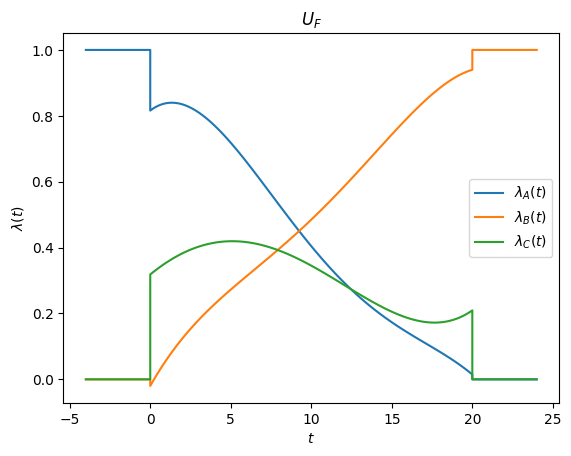

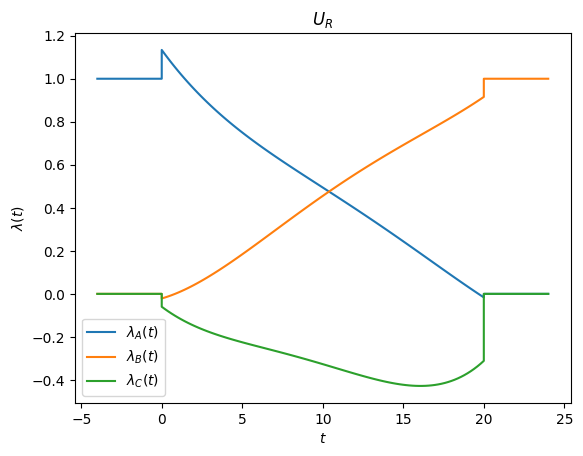

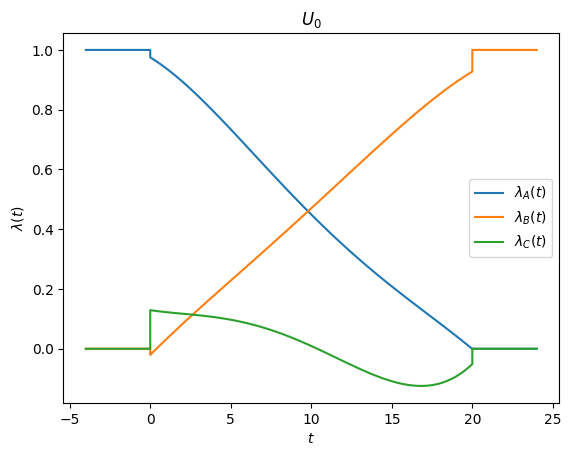

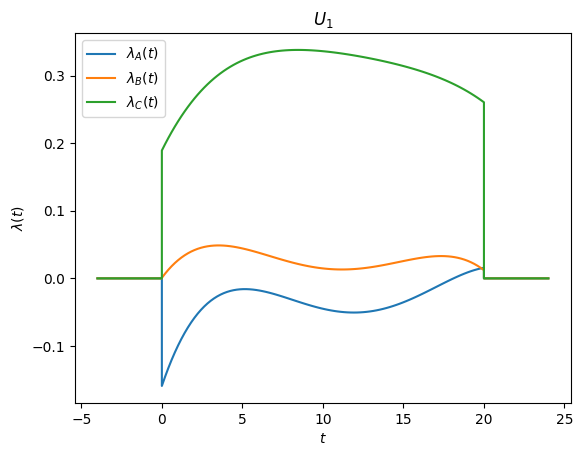

drawing new samples now -- parallelized with Pool
dF estimate 9.624798880934055 +/- 137.6079049949481
var*n_s for all trajs: 2651030.9723938126, and most recent 100: 1896316.7216833094


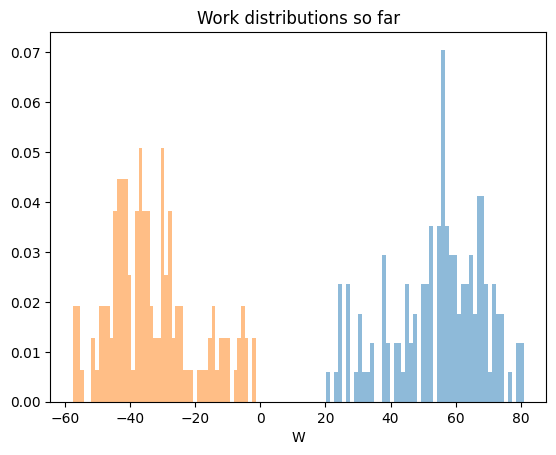

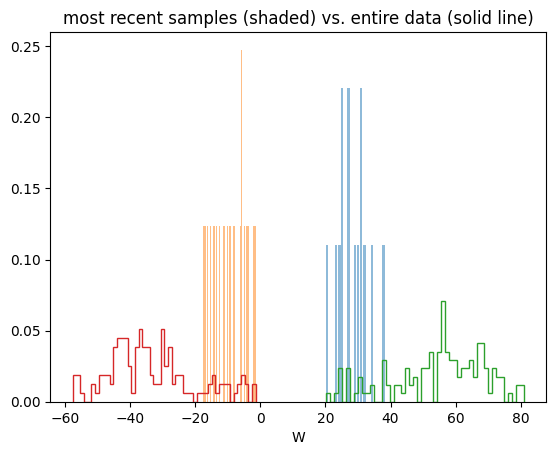

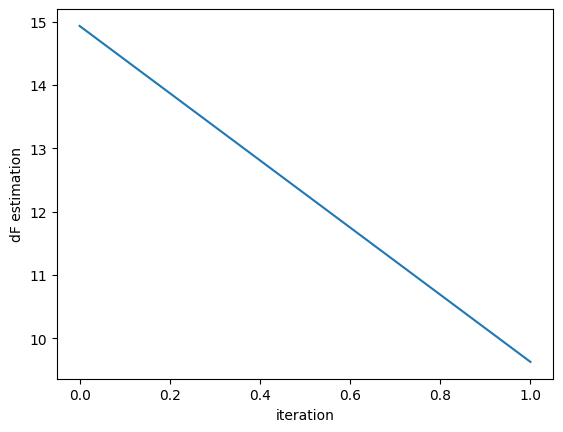

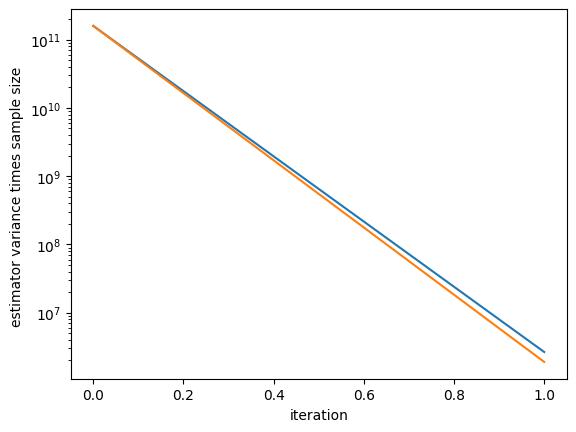

done with iteration no. 0

we have 140 F samples 140 R samples
starting protocol optimization


Visualizing new protocol:


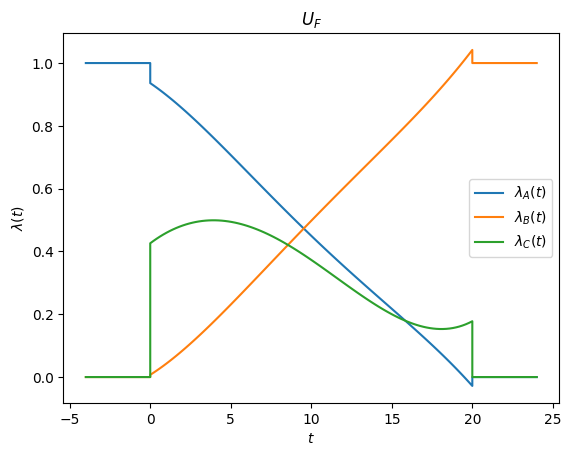

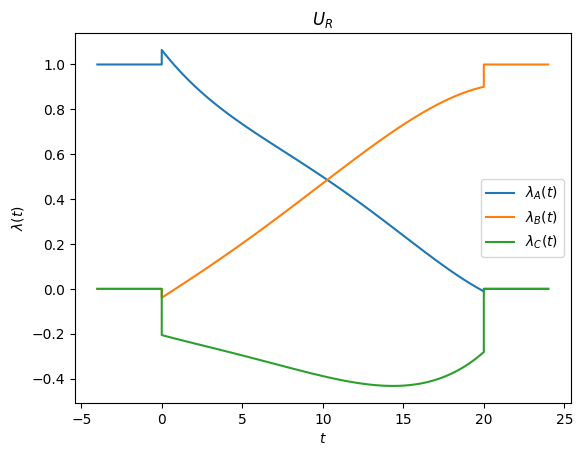

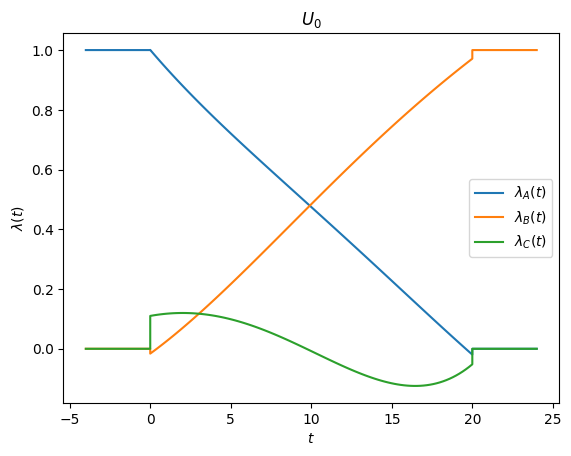

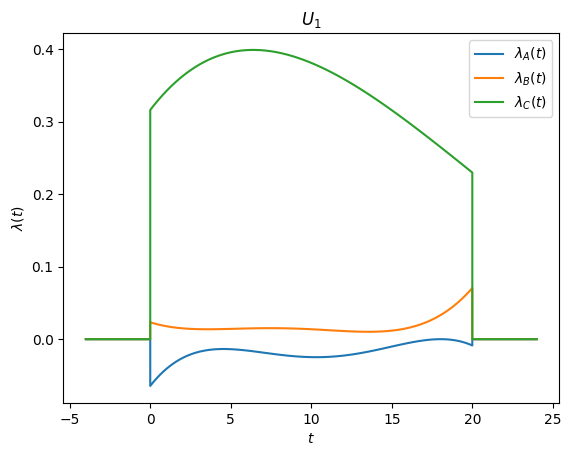

drawing new samples now -- parallelized with Pool
dF estimate 13.863290837419347 +/- 3.0839604537000036
var*n_s for all trajs: 1521.7299327976853, and most recent 100: 950.3312183400687


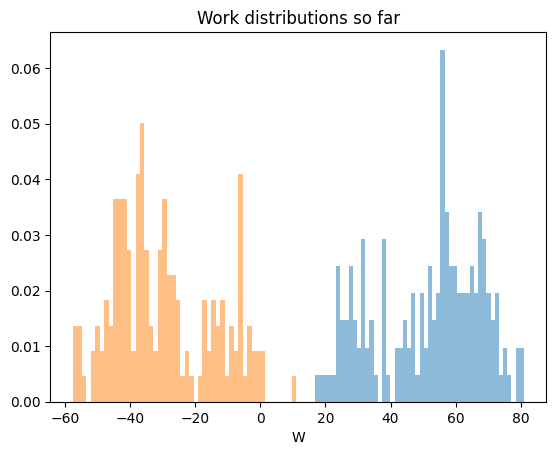

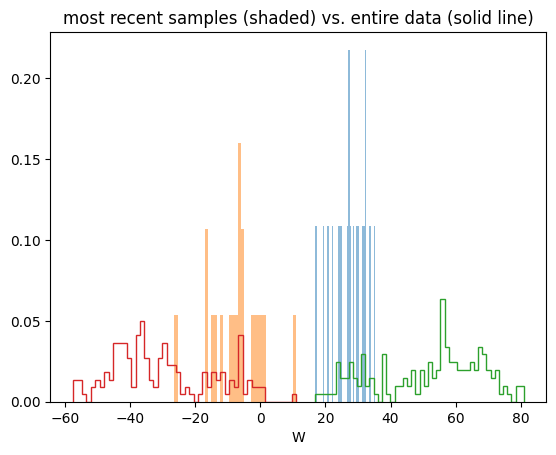

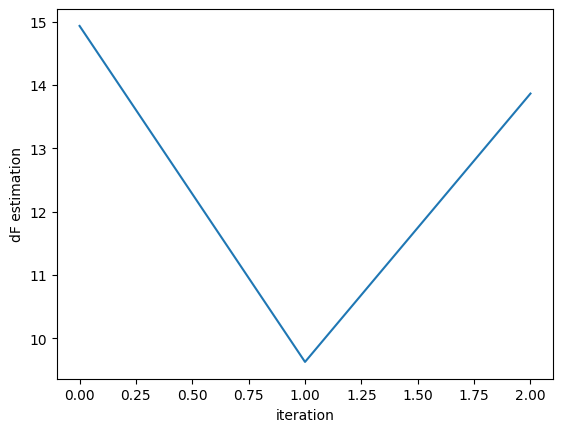

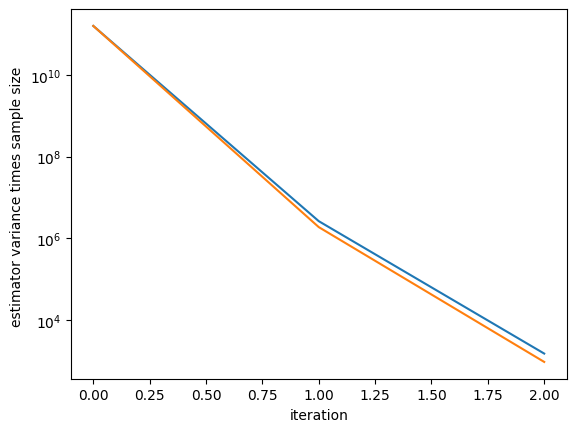

done with iteration no. 1

we have 160 F samples 160 R samples
starting protocol optimization


Visualizing new protocol:


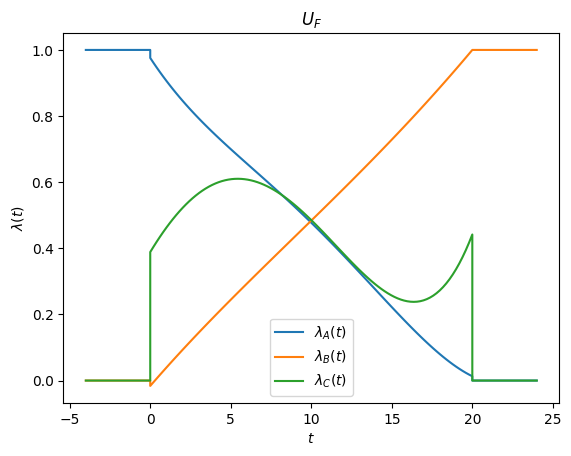

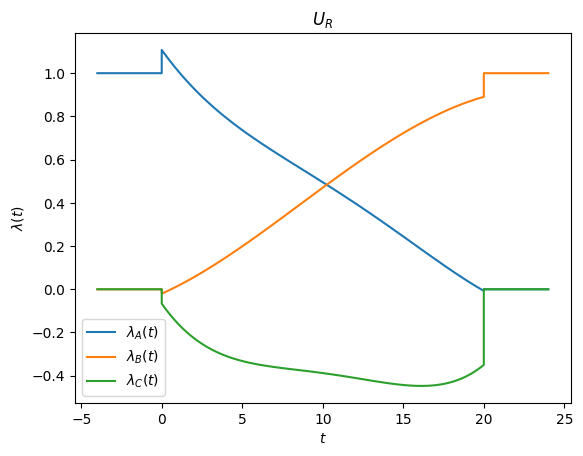

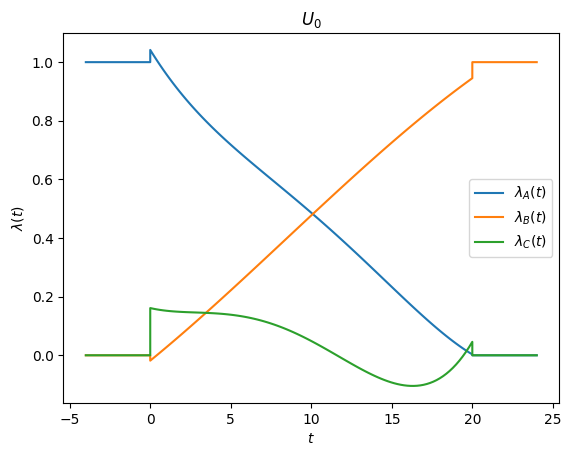

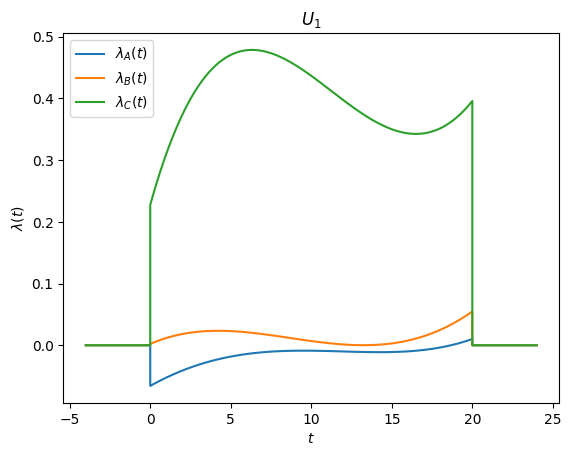

drawing new samples now -- parallelized with Pool
dF estimate 13.267848318617462 +/- 2.3636677934406687
var*n_s for all trajs: 1005.6465787947623, and most recent 100: 557.8036612156357


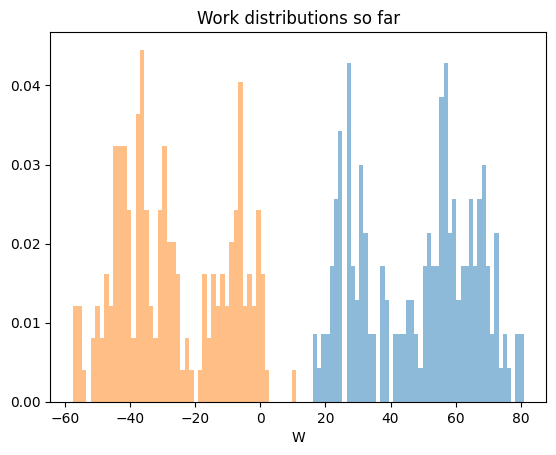

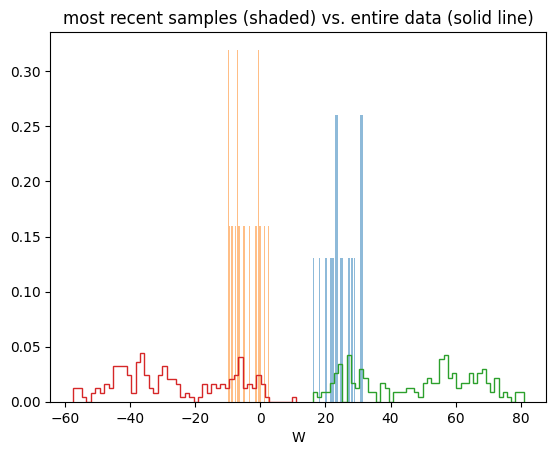

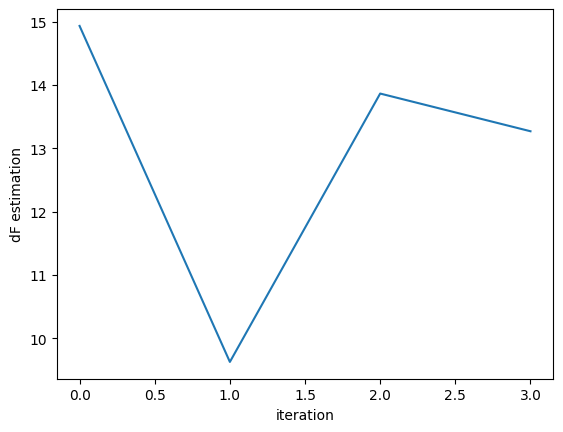

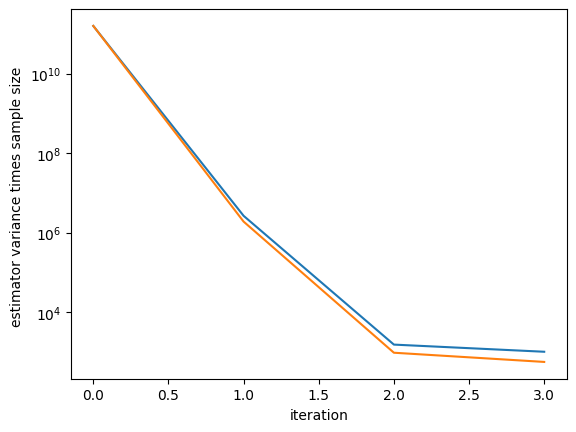

done with iteration no. 2

we have 180 F samples 180 R samples
starting protocol optimization
1 of 20 terminated with a single fn evaluation


Visualizing new protocol:


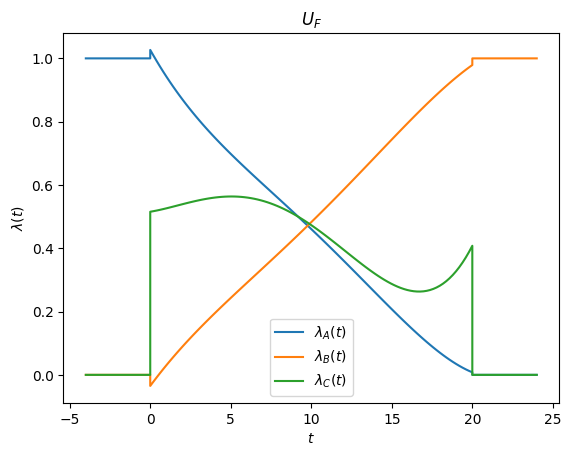

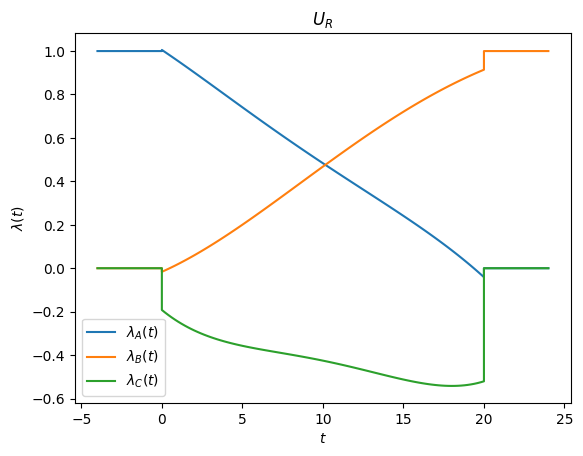

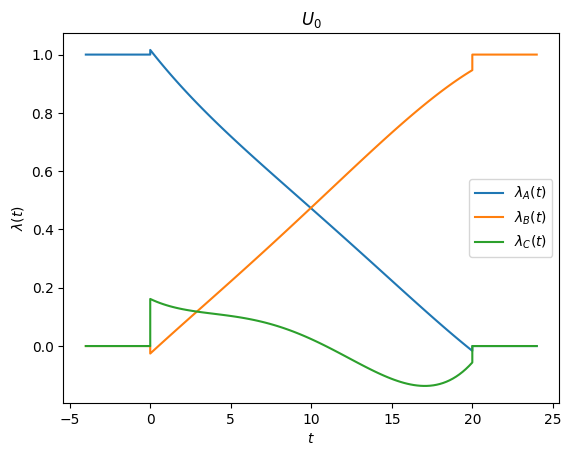

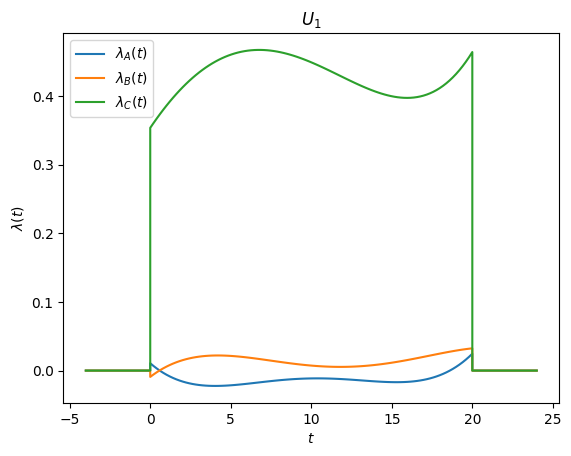

drawing new samples now -- parallelized with Pool
dF estimate 13.189403162055097 +/- 2.2796383136345435
var*n_s for all trajs: 1039.3501681981093, and most recent 100: 518.6750900552477


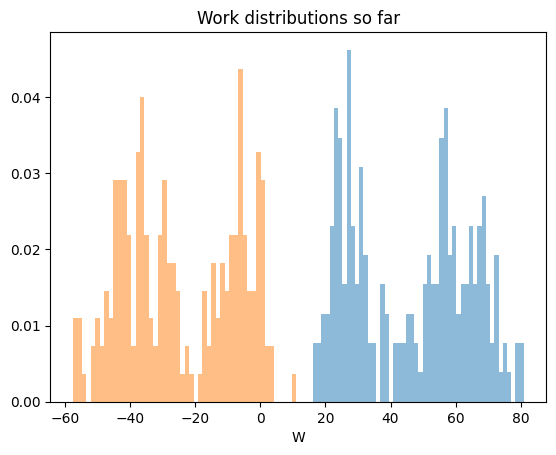

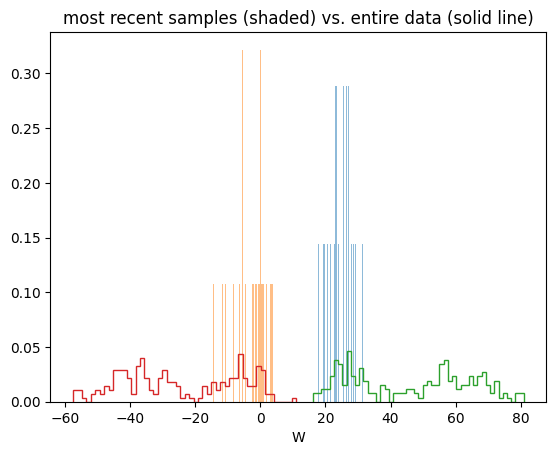

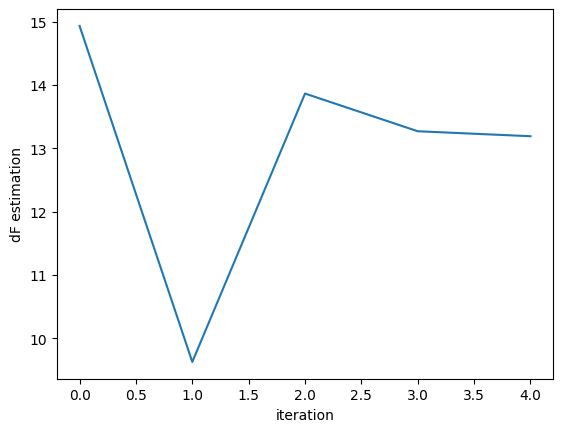

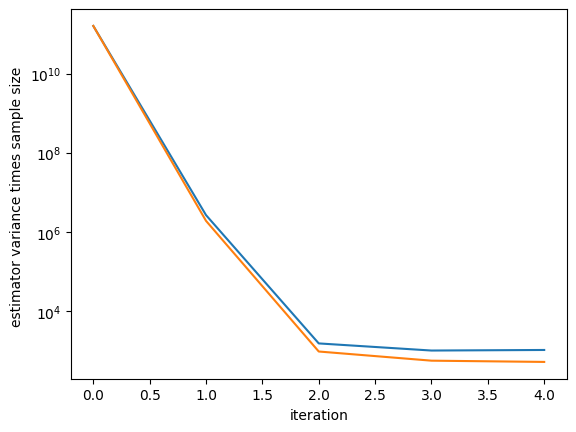

done with iteration no. 3

we have 200 F samples 200 R samples
starting protocol optimization
1 of 20 terminated with a single fn evaluation


Visualizing new protocol:


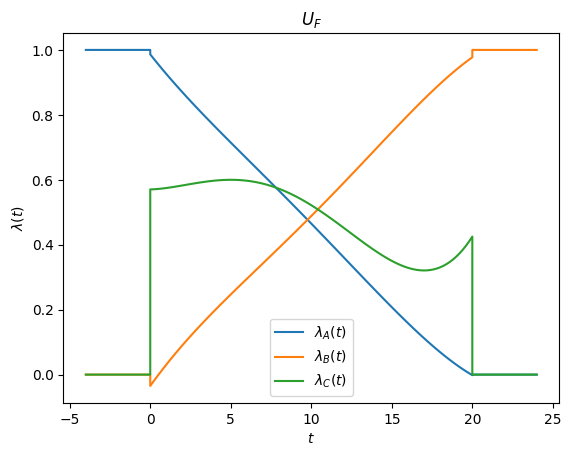

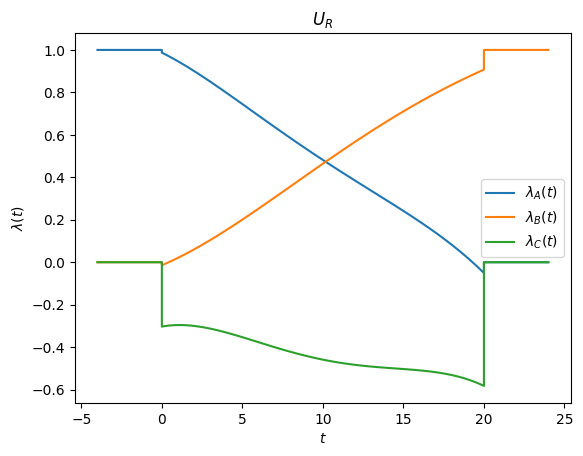

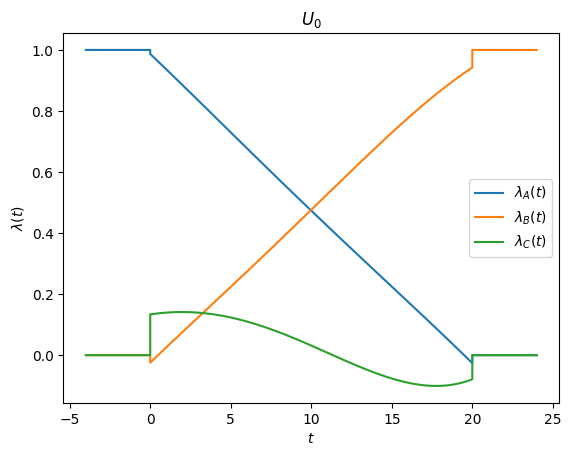

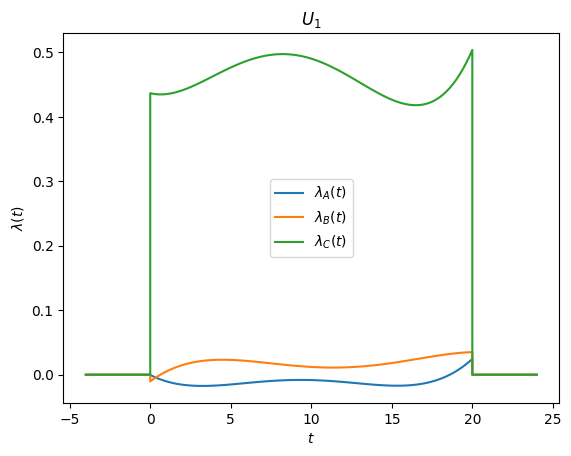

drawing new samples now -- parallelized with Pool
dF estimate 11.309279273207403 +/- 1.2882452984114872
var*n_s for all trajs: 365.1067087534464, and most recent 100: 164.8666897228482


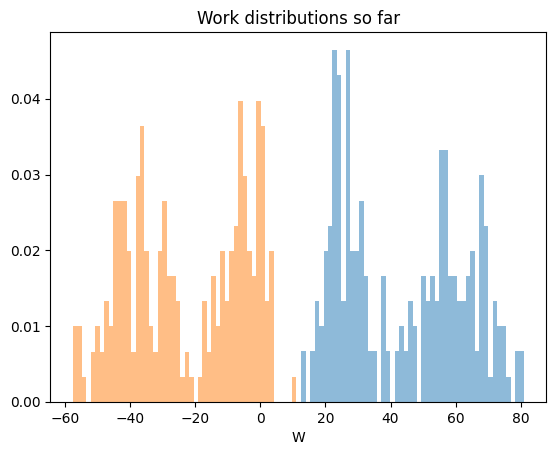

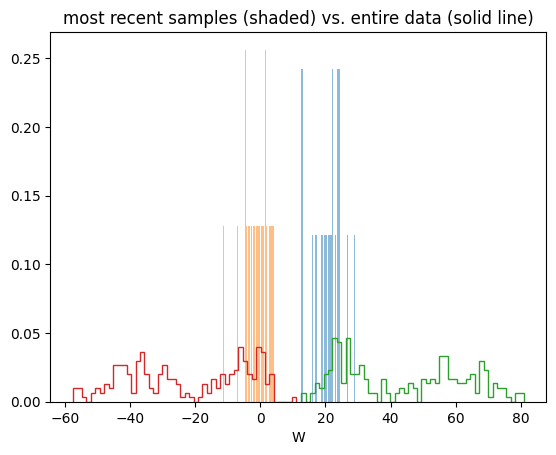

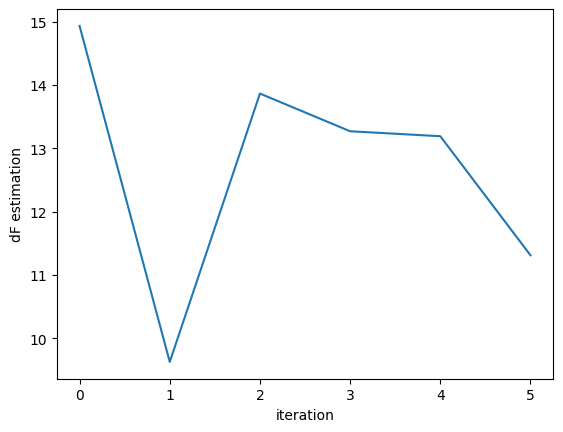

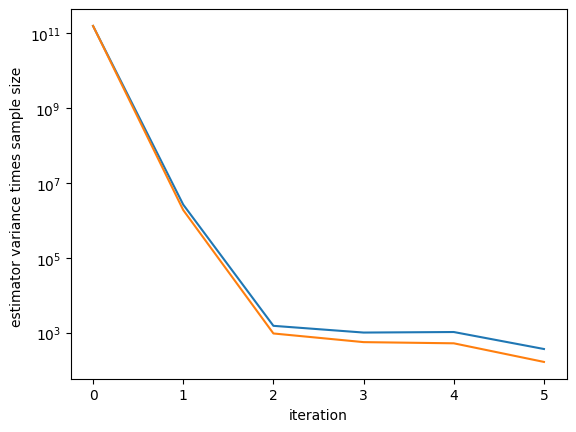

done with iteration no. 4

we have 220 F samples 220 R samples
starting protocol optimization
11 of 20 terminated with a single fn evaluation
need to increase wrapper_factor, now 3.2e-07

we have 220 F samples 220 R samples
starting protocol optimization
11 of 20 terminated with a single fn evaluation
need to increase wrapper_factor, now 6.4e-07

we have 220 F samples 220 R samples
starting protocol optimization


Visualizing new protocol:


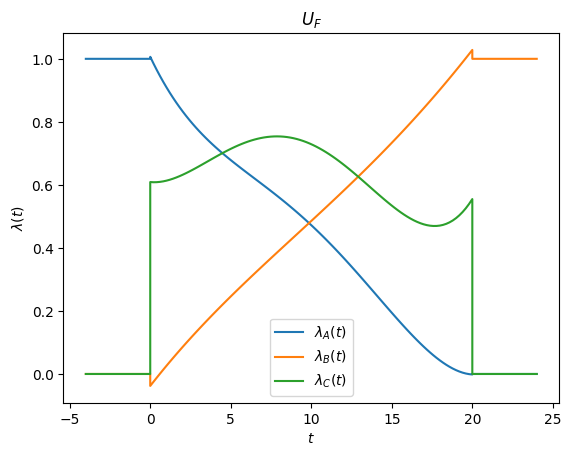

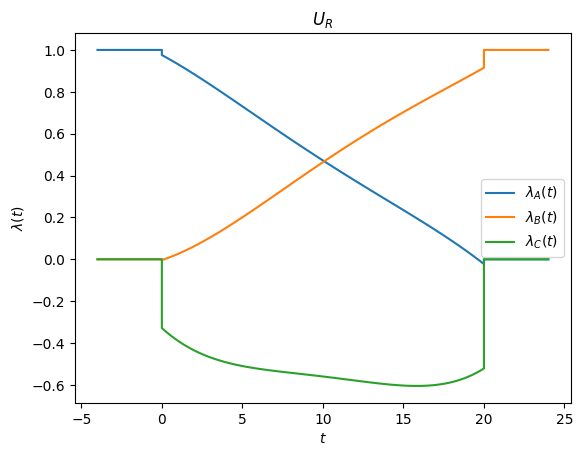

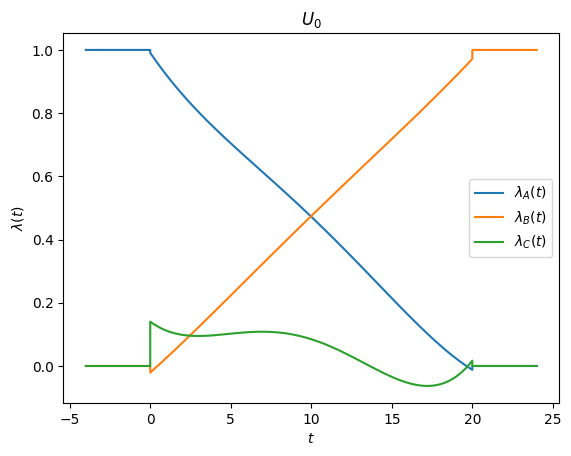

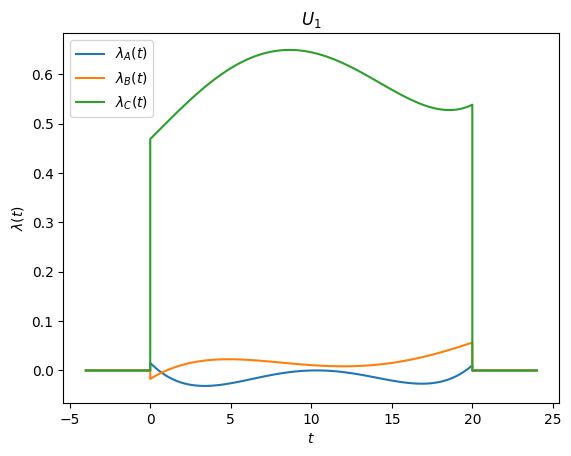

drawing new samples now -- parallelized with Pool
dF estimate 11.233261907013436 +/- 0.7918465319114223
var*n_s for all trajs: 150.4850232240353, and most recent 100: 61.54096355786015


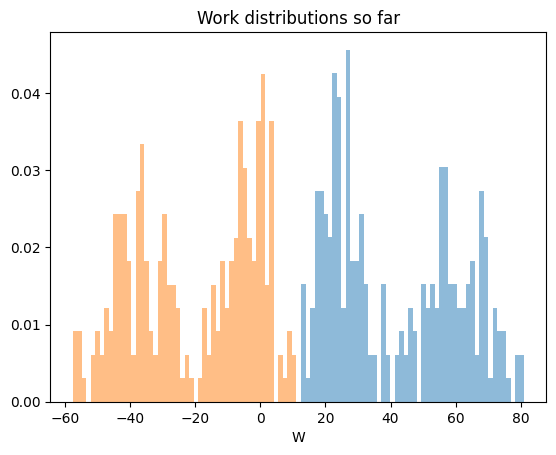

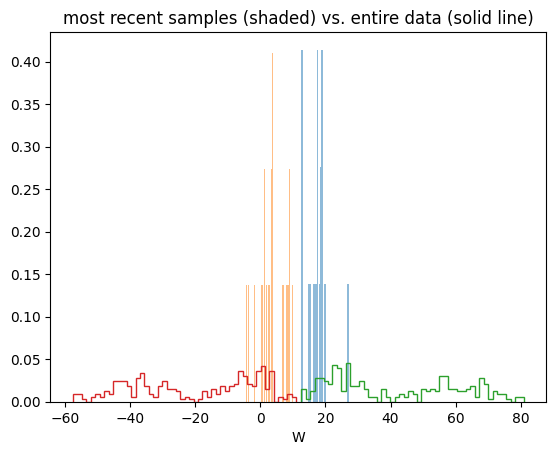

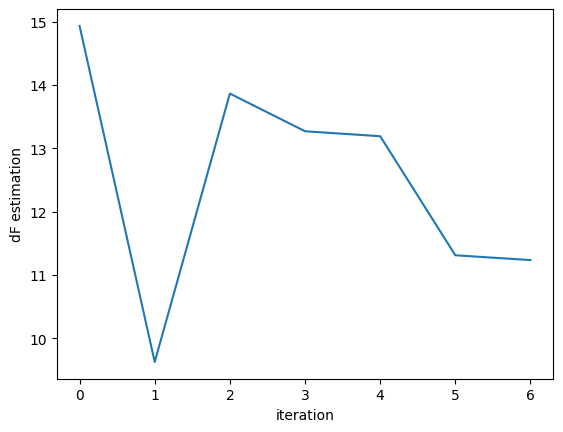

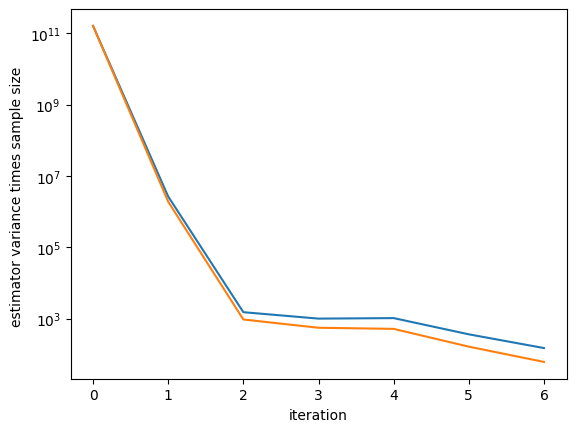

done with iteration no. 5

we have 240 F samples 240 R samples
starting protocol optimization


Visualizing new protocol:


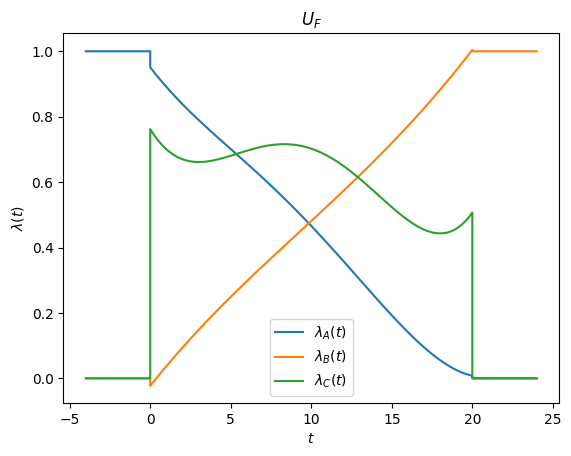

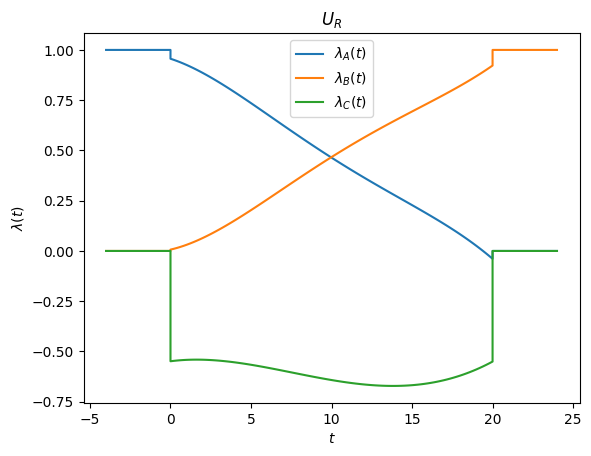

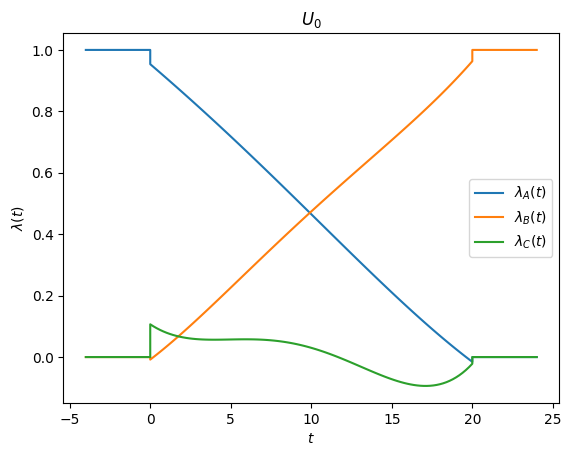

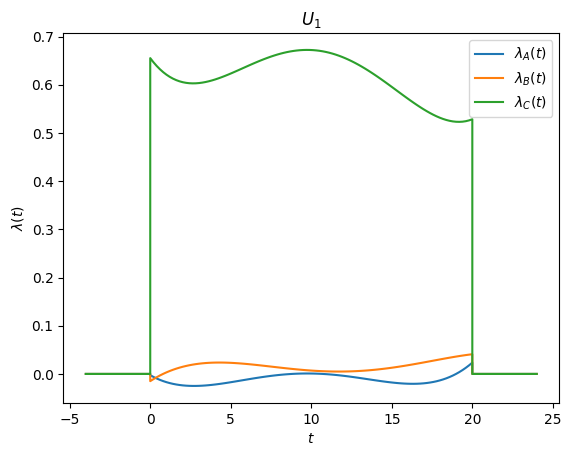

drawing new samples now -- parallelized with Pool
dF estimate 10.547261522981525 +/- 0.6453871473225475
var*n_s for all trajs: 108.29638818157527, and most recent 100: 45.199686637015425


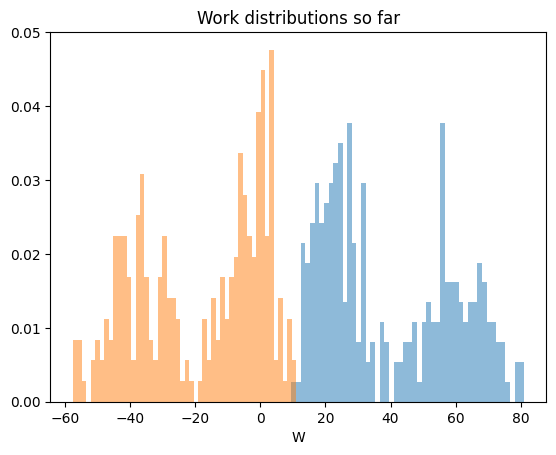

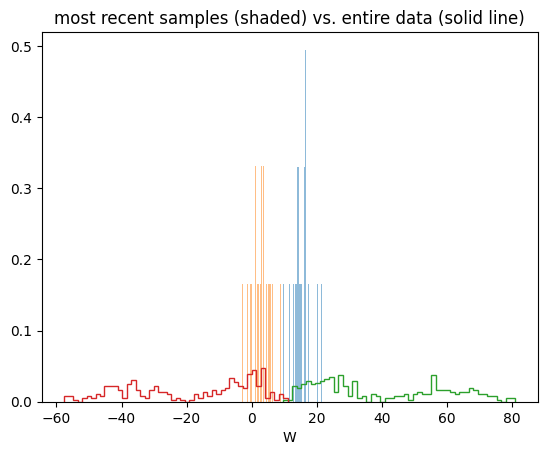

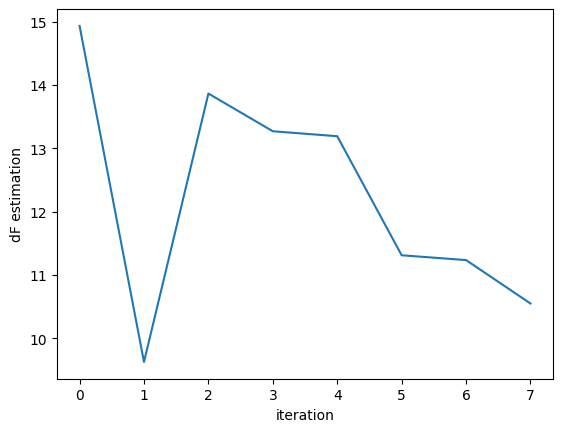

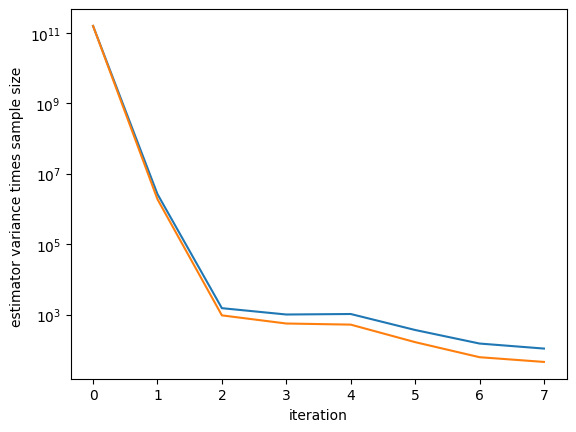

done with iteration no. 6

we have 260 F samples 260 R samples
starting protocol optimization


Visualizing new protocol:


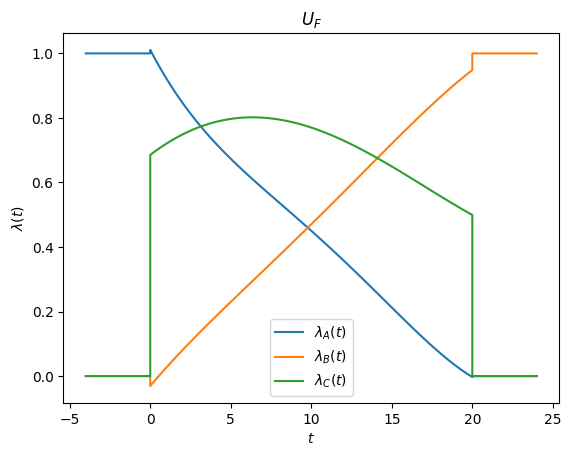

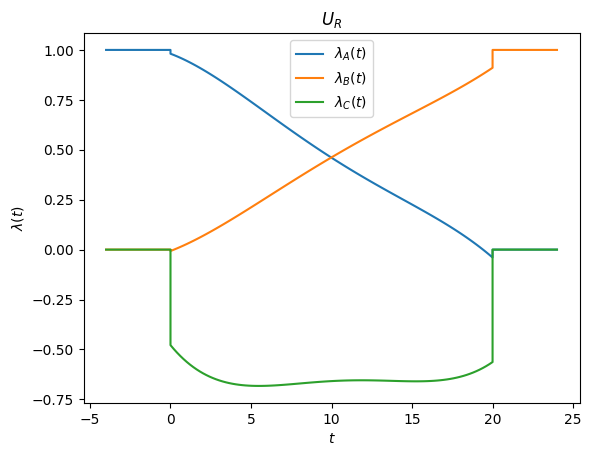

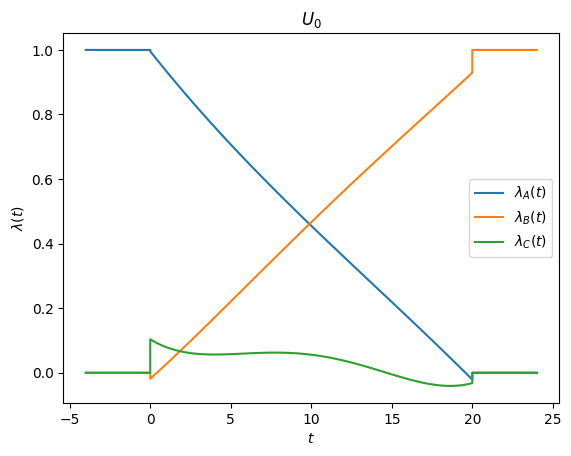

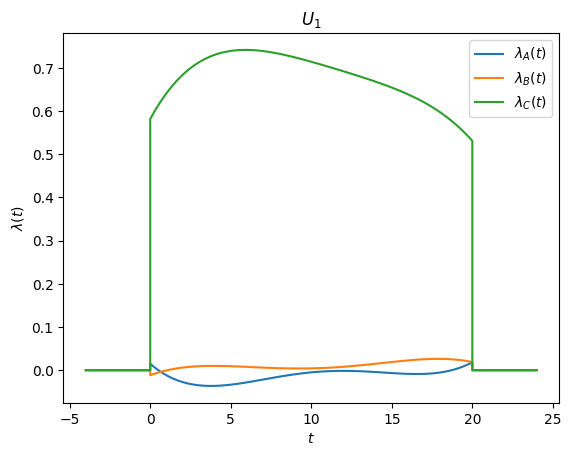

drawing new samples now -- parallelized with Pool
dF estimate 10.859625232197697 +/- 0.5117692411619281
var*n_s for all trajs: 73.3341717358476, and most recent 100: 26.910329176841774


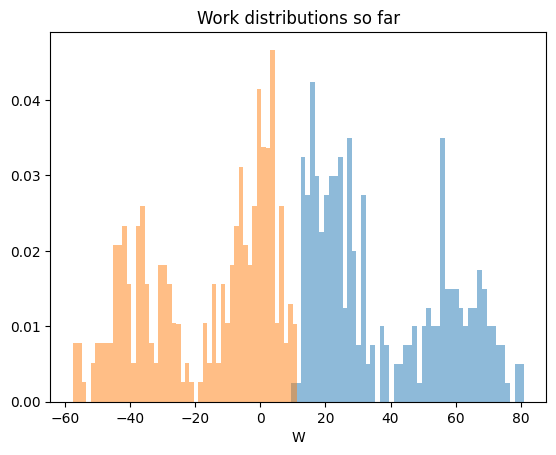

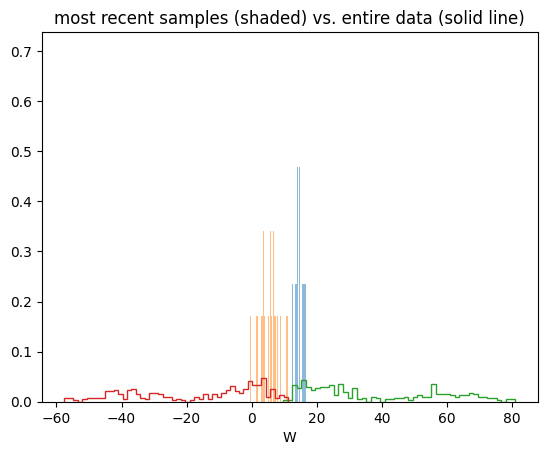

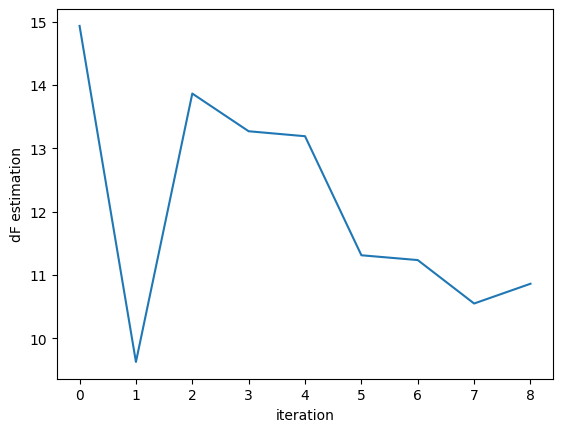

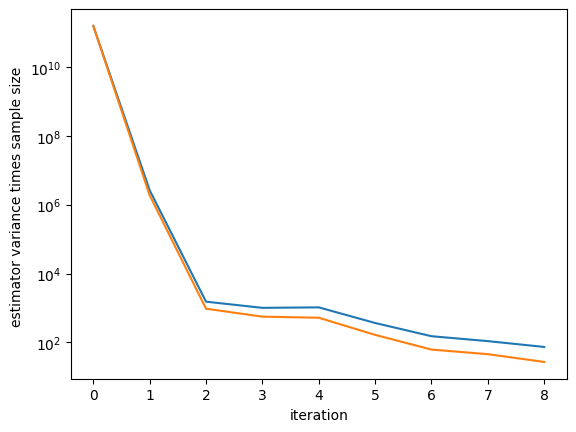

done with iteration no. 7

we have 280 F samples 280 R samples
starting protocol optimization


Visualizing new protocol:


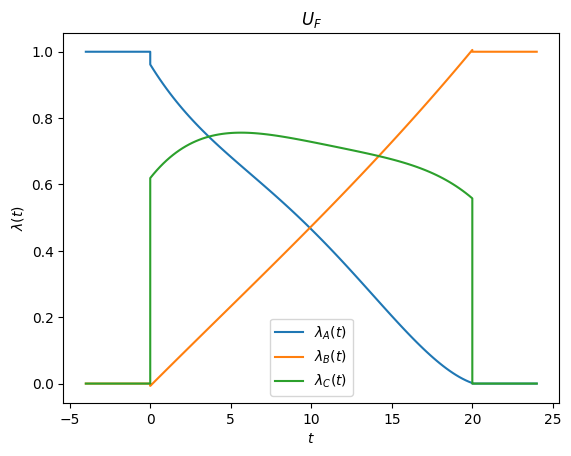

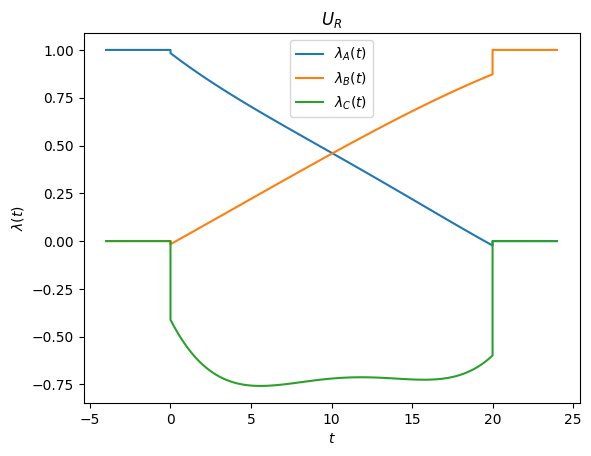

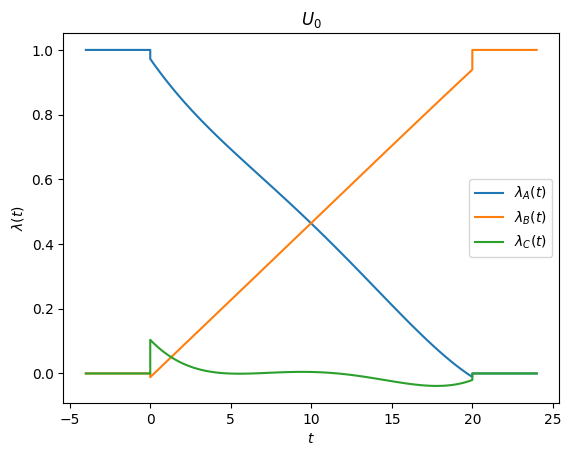

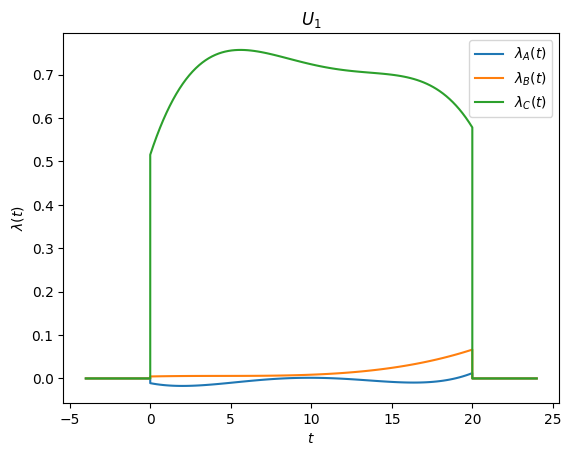

drawing new samples now -- parallelized with Pool
dF estimate 10.428738579059992 +/- 0.38905469315044267
var*n_s for all trajs: 45.40906627871553, and most recent 100: 14.42535800001315


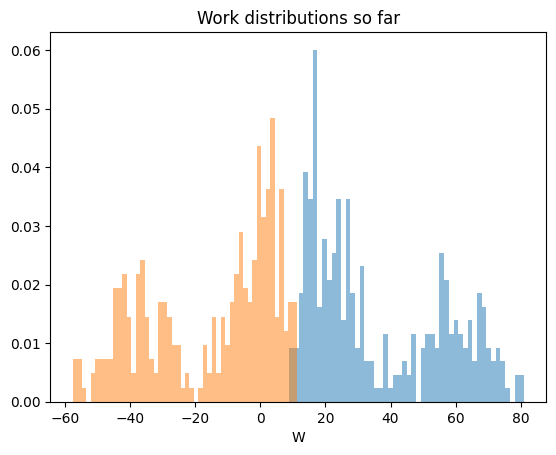

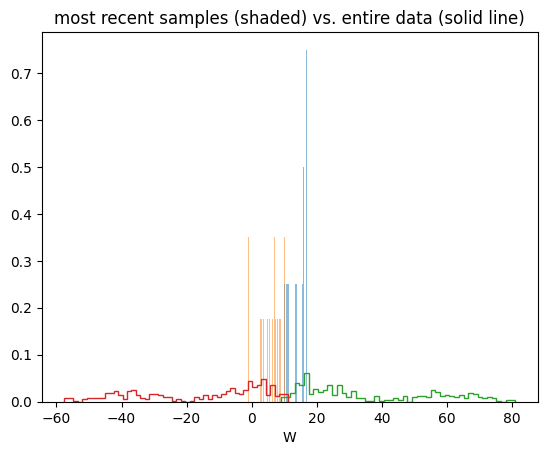

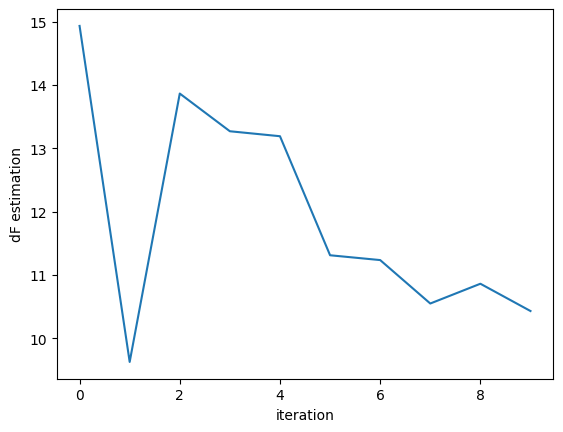

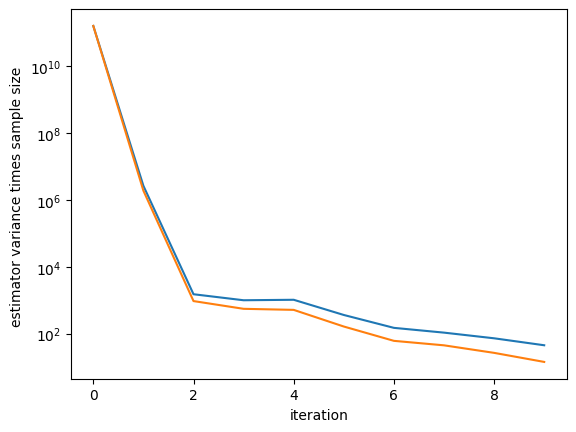

done with iteration no. 8

we have 300 F samples 300 R samples
starting protocol optimization


Visualizing new protocol:


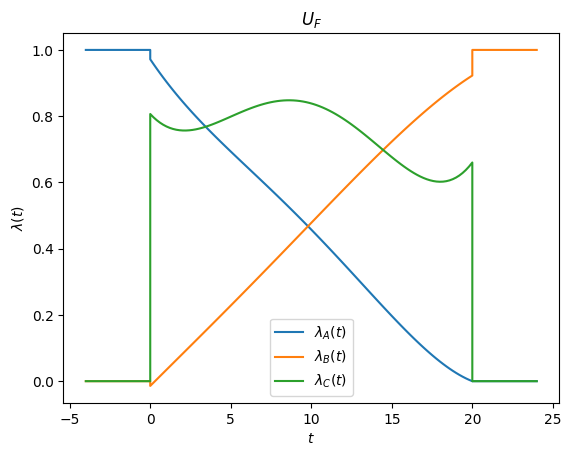

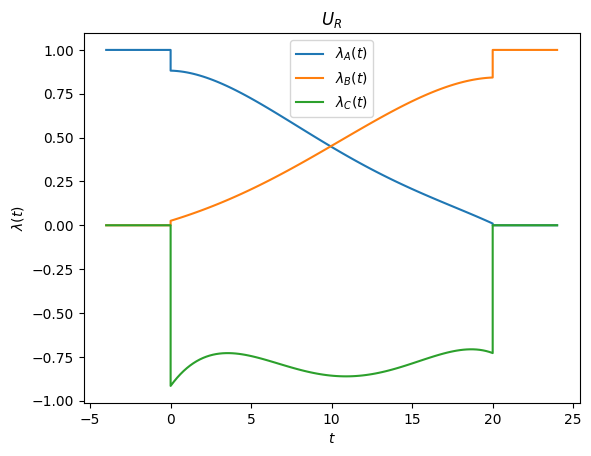

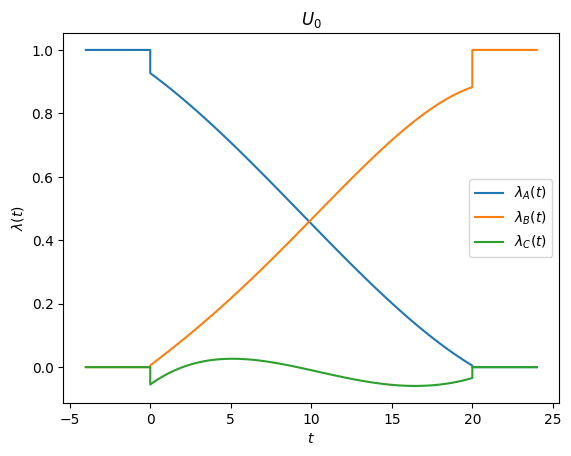

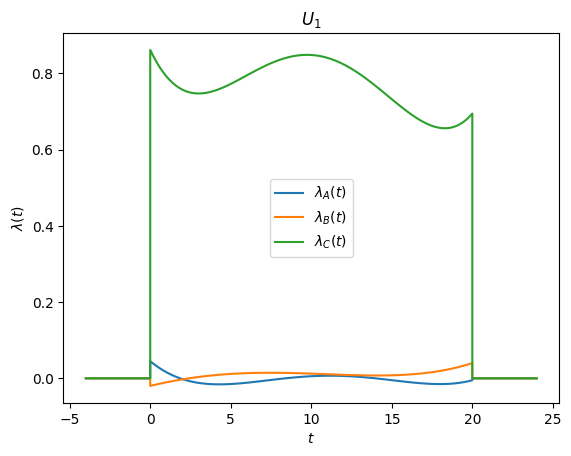

drawing new samples now -- parallelized with Pool
dF estimate 10.334314543577046 +/- 0.3135806303240054
var*n_s for all trajs: 31.466499748608175, and most recent 100: 8.916911154821422


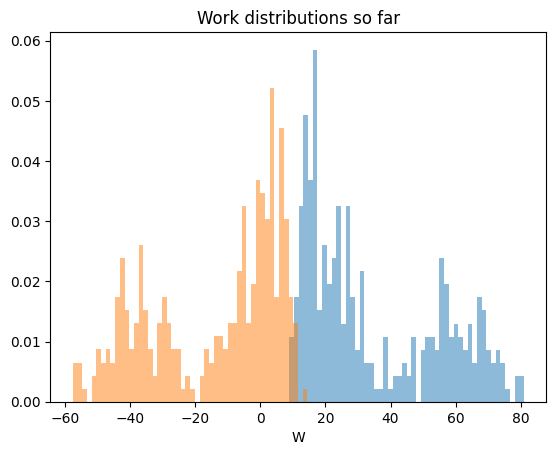

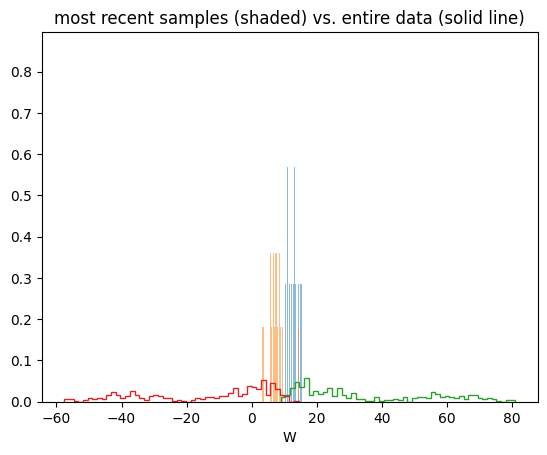

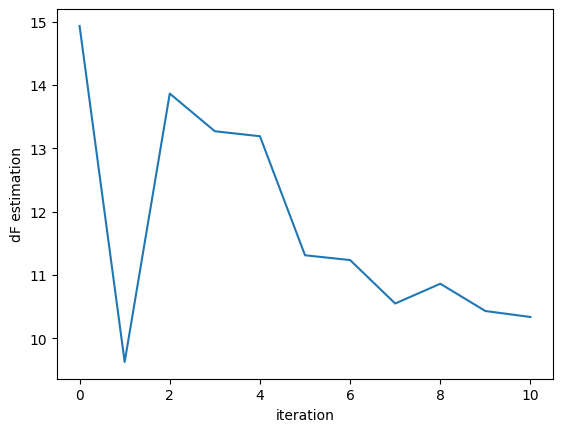

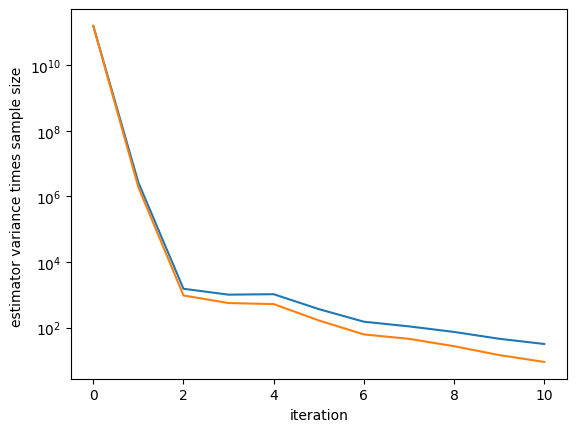

done with iteration no. 9

we have 320 F samples 320 R samples
starting protocol optimization
 message: More than 3*n iterations in LSQ subproblem
 success: False
  status: 3
     fun: 0.0006466004639021265
       x: [ 4.686e-01 -4.655e-01 ...  3.850e-01 -5.450e-02]
     nit: 83
     jac: [ 4.523e-05  2.966e-05 ...  1.705e-06 -7.101e-07]
    nfev: 336
    njev: 83 continuing!
 message: More than 3*n iterations in LSQ subproblem
 success: False
  status: 3
     fun: 0.0007499033067286573
       x: [ 1.321e-01  3.106e-01 ...  4.773e-01  8.305e-01]
     nit: 154
     jac: [ 4.939e-04  2.488e-06 ...  1.413e-04  6.070e-05]
    nfev: 694
    njev: 154 continuing!
 message: Iteration limit reached
 success: False
  status: 9
     fun: 0.0006426575576134504
       x: [ 4.658e-01 -5.477e-01 ...  1.840e-01 -2.730e-01]
     nit: 500
     jac: [-2.069e-08  3.482e-06 ...  1.752e-06 -2.845e-07]
    nfev: 583
    njev: 500 continuing!


Visualizing new protocol:


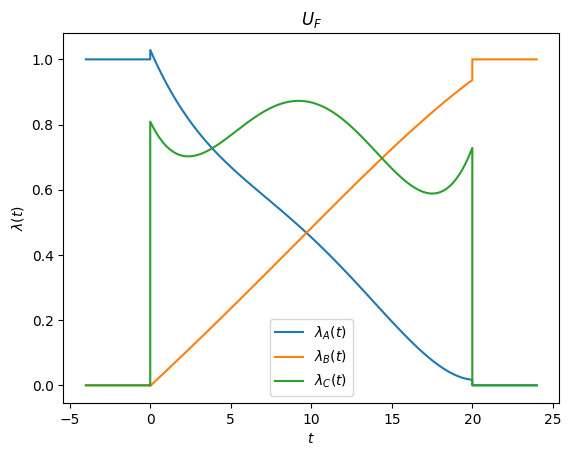

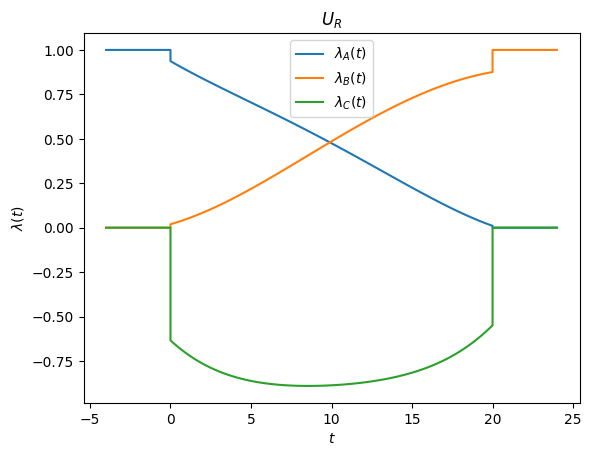

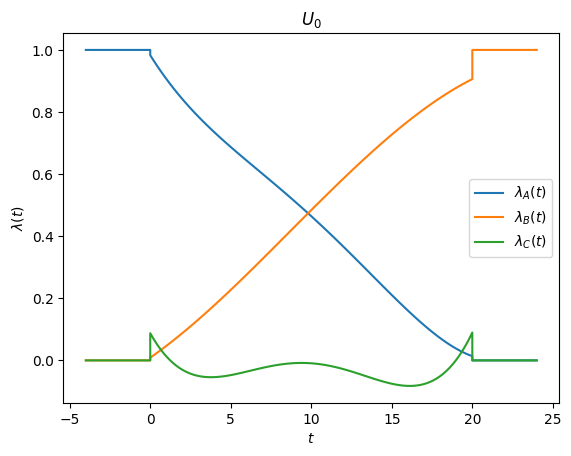

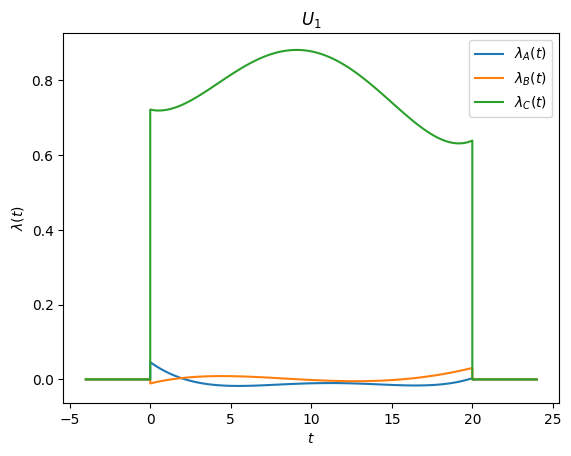

drawing new samples now -- parallelized with Pool
dF estimate 10.261299646107643 +/- 0.25599347168968256
var*n_s for all trajs: 22.28110356623034, and most recent 100: 5.996418987648884


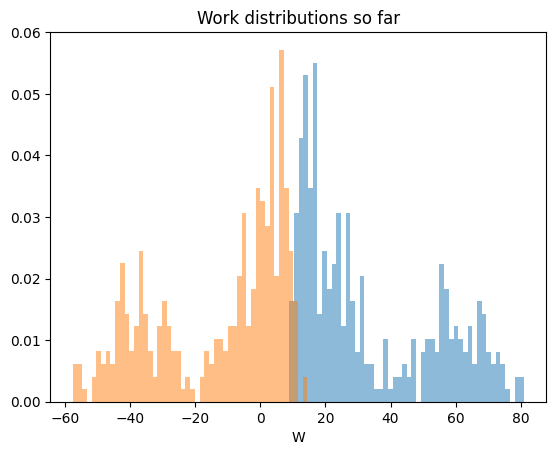

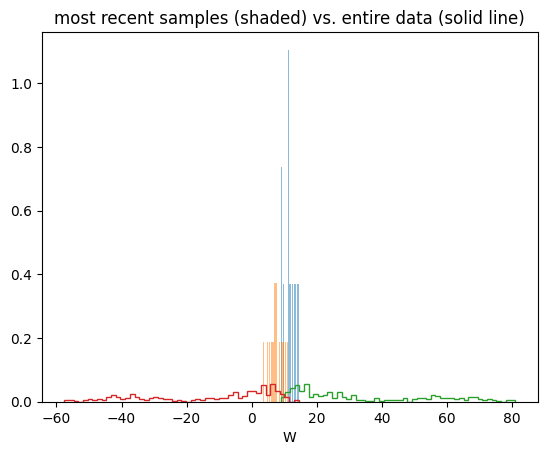

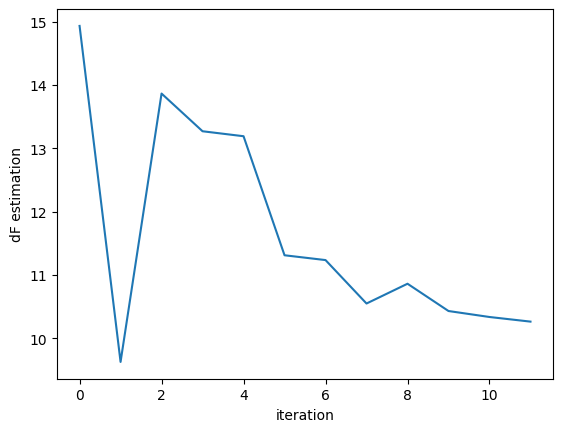

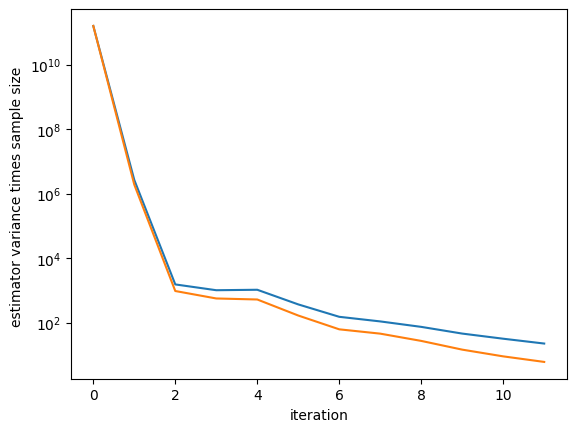

done with iteration no. 10

we have 340 F samples 340 R samples
starting protocol optimization


/Users/adrizhong/Library/Python/3.9/lib/python/site-packages/scipy/optimize/_optimize.py:353: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "


 message: Iteration limit reached
 success: False
  status: 9
     fun: 0.0007800608890304435
       x: [ 2.129e+00  6.513e-01 ... -3.027e-01  9.526e-01]
     nit: 500
     jac: [ 1.342e-04  3.921e-05 ...  1.152e-04  2.877e-04]
    nfev: 2045
    njev: 499 continuing!
 message: Inequality constraints incompatible
 success: False
  status: 4
     fun: 0.0006745511823488397
       x: [ 4.855e-01 -7.451e-01 ... -1.329e-01  7.845e-01]
     nit: 63
     jac: [ 2.804e-04  1.471e-07 ... -2.035e-06 -2.931e-06]
    nfev: 321
    njev: 63 continuing!
 message: More than 3*n iterations in LSQ subproblem
 success: False
  status: 3
     fun: 0.0006764598653255799
       x: [ 4.241e-01 -4.604e-01 ... -2.683e-01 -7.059e-01]
     nit: 92
     jac: [ 5.875e-04  2.891e-04 ...  1.952e-06 -4.828e-06]
    nfev: 383
    njev: 92 continuing!


Visualizing new protocol:


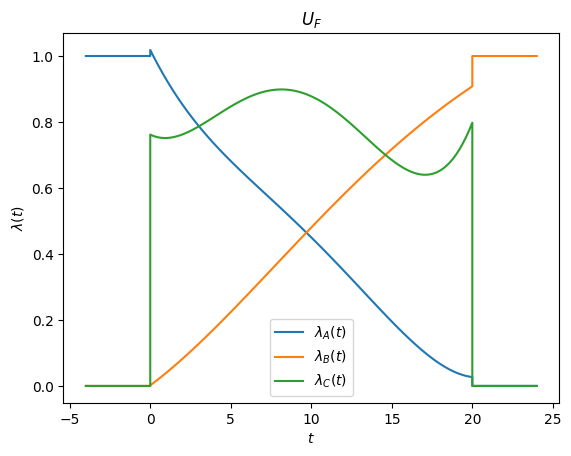

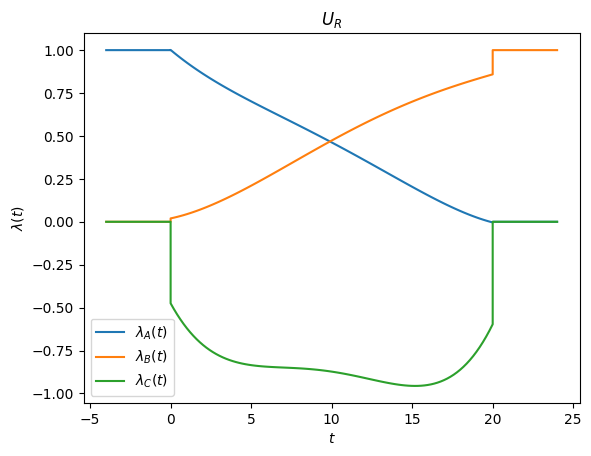

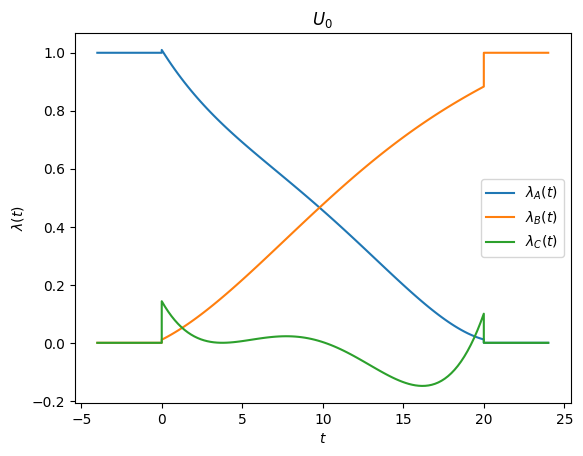

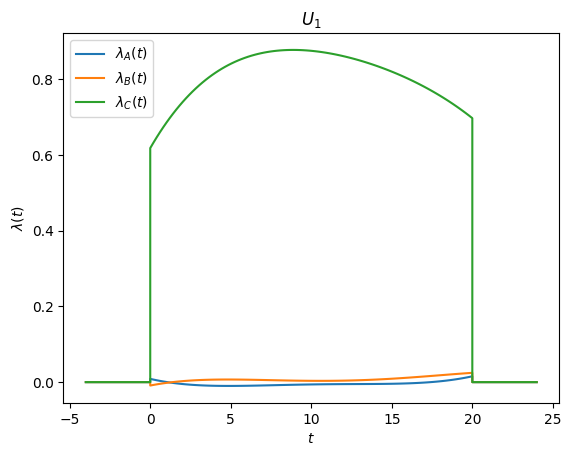

drawing new samples now -- parallelized with Pool
dF estimate 10.294508974497067 +/- 0.22043222970399146
var*n_s for all trajs: 17.492532441218373, and most recent 100: 4.197131805544961


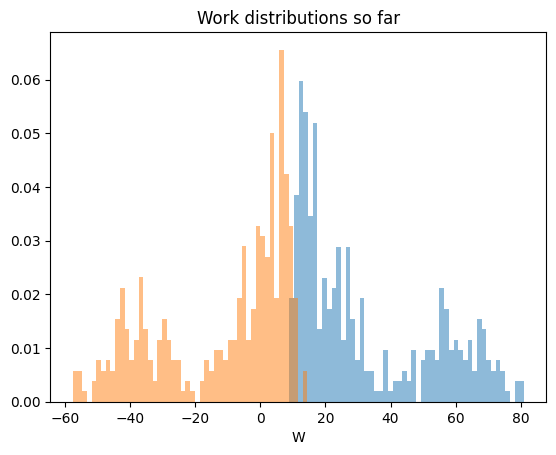

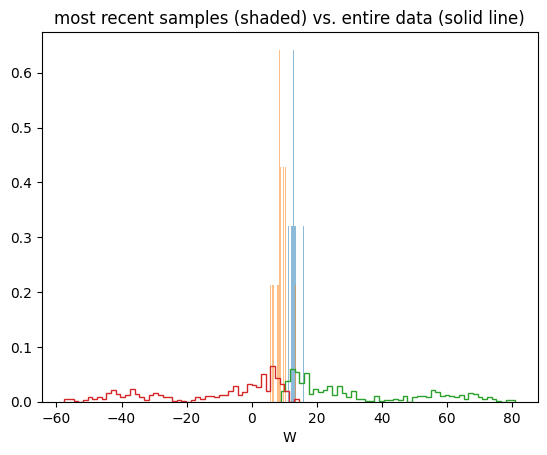

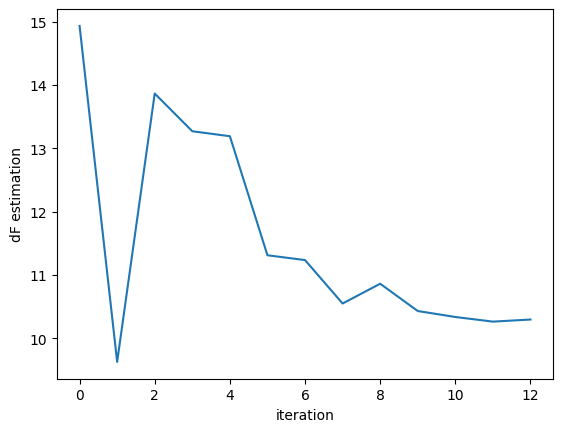

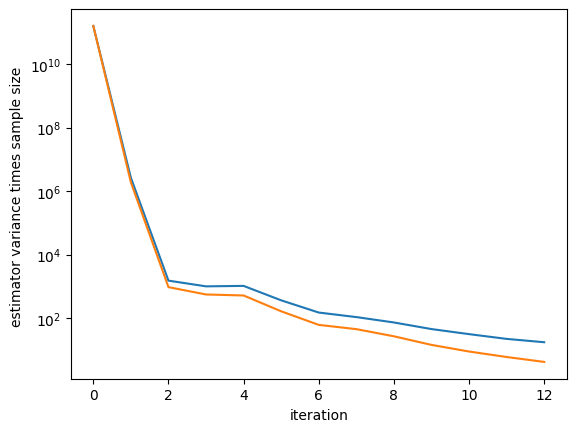

done with iteration no. 11

we have 360 F samples 360 R samples
starting protocol optimization


Visualizing new protocol:


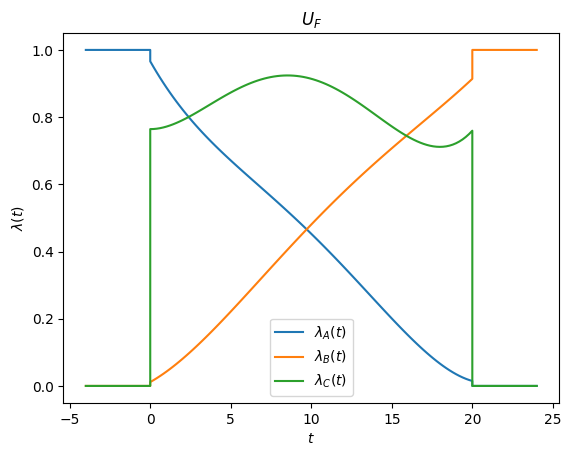

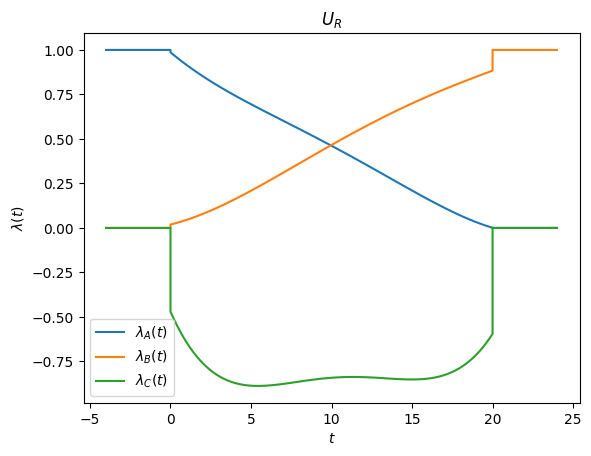

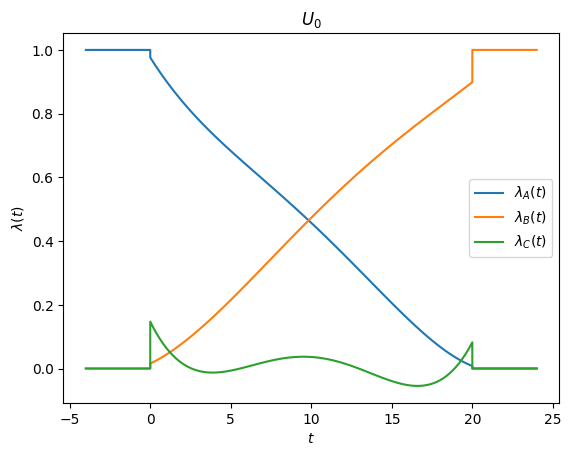

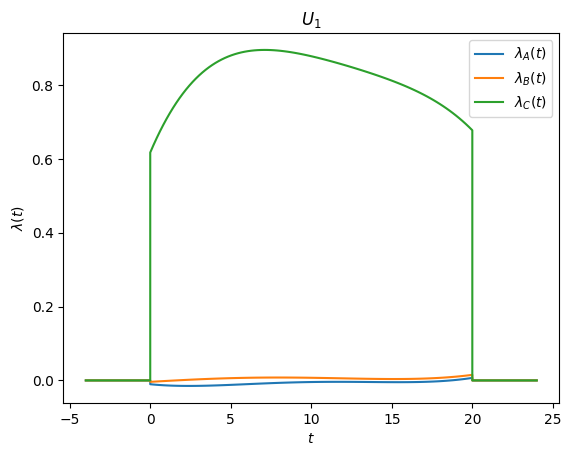

drawing new samples now -- parallelized with Pool
dF estimate 10.29471833316644 +/- 0.19036723701861696
var*n_s for all trajs: 13.77108027343887, and most recent 100: 2.856612047120939


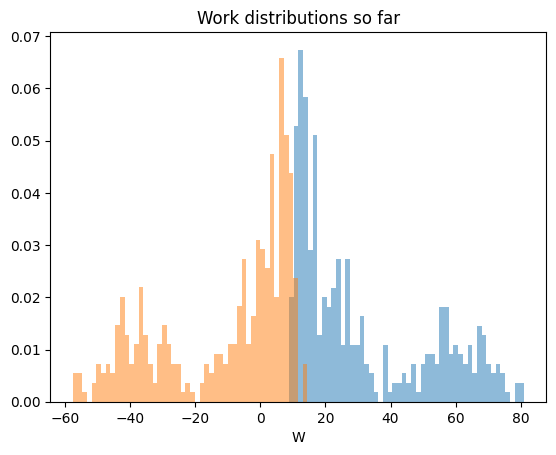

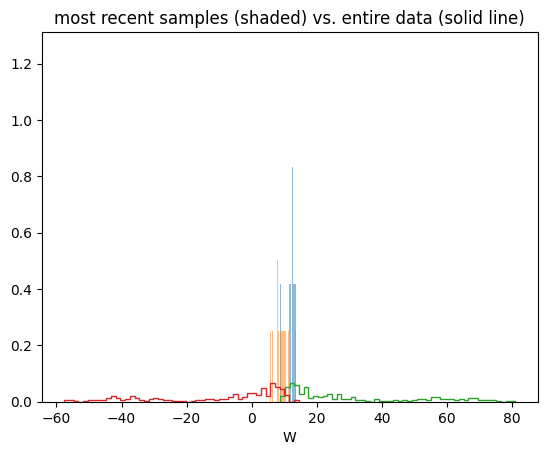

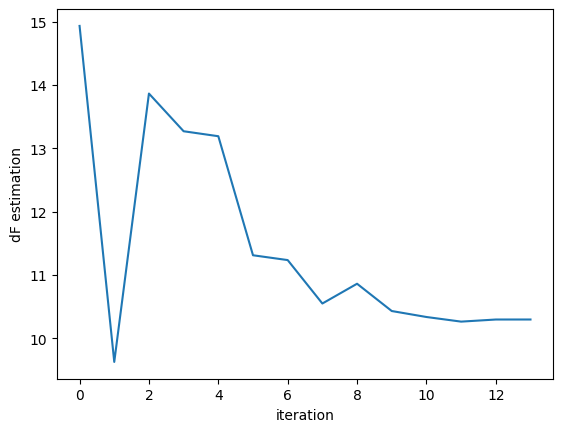

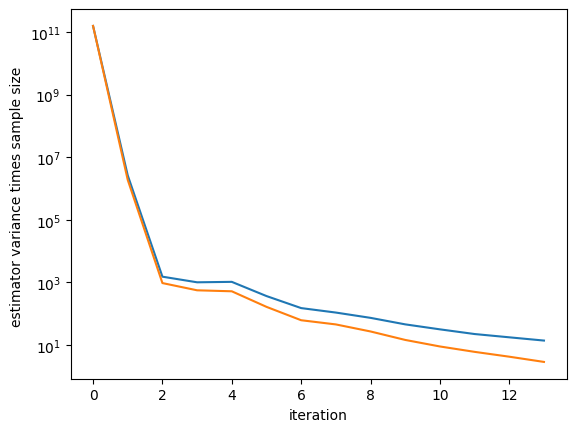

done with iteration no. 12

we have 380 F samples 380 R samples
starting protocol optimization


Visualizing new protocol:


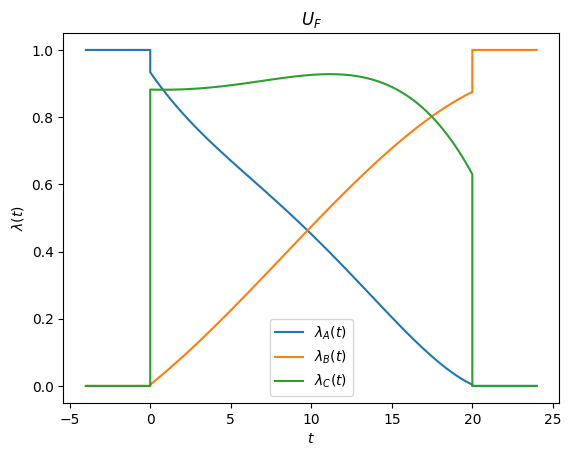

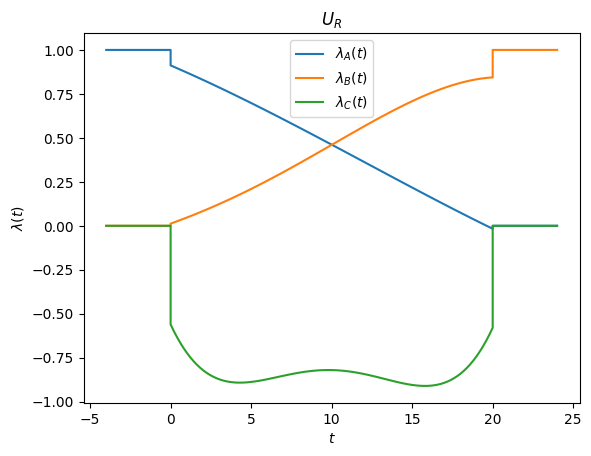

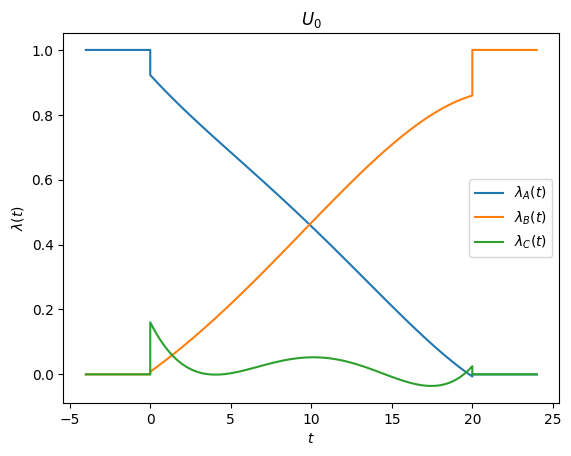

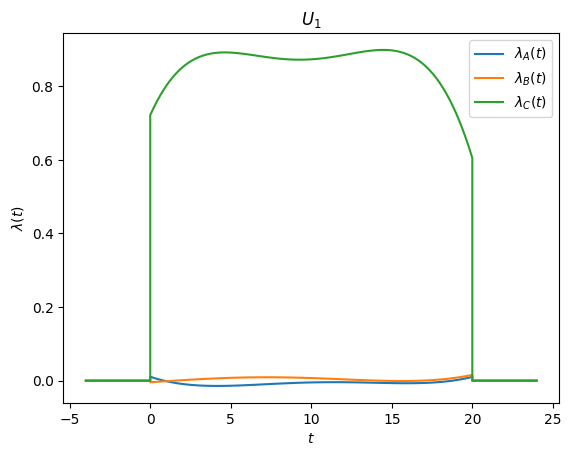

drawing new samples now -- parallelized with Pool
dF estimate 10.177421966444468 +/- 0.16420587796111208
var*n_s for all trajs: 10.78542814279185, and most recent 100: 2.0080171654609544


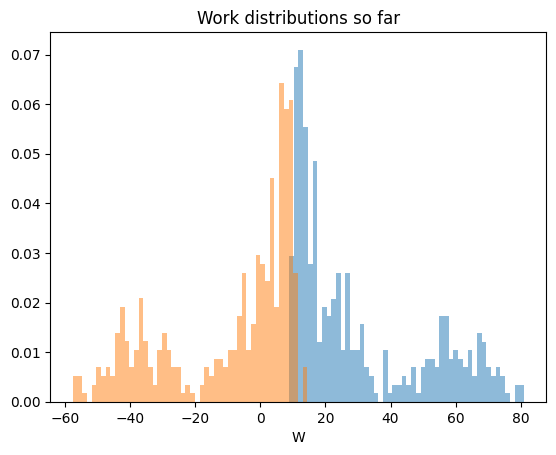

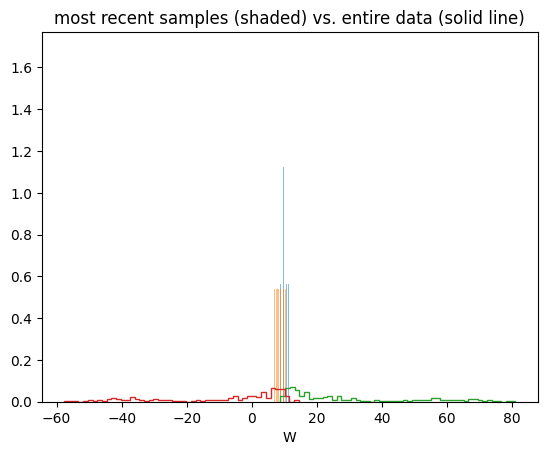

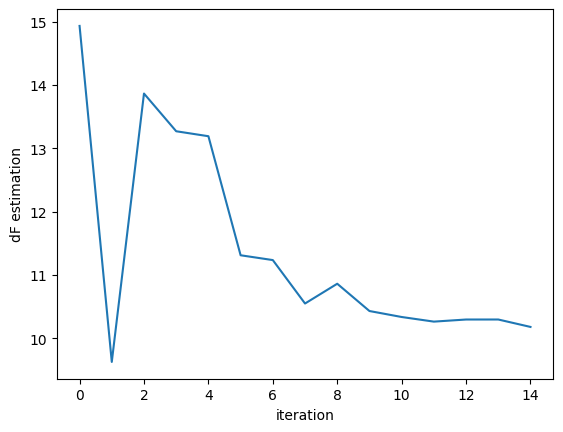

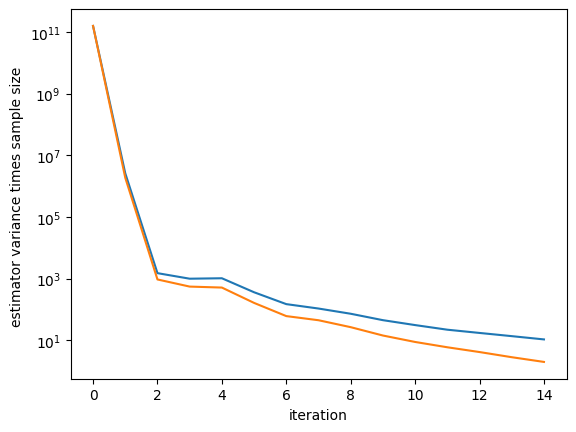

done with iteration no. 13

we have 400 F samples 400 R samples
starting protocol optimization


Visualizing new protocol:


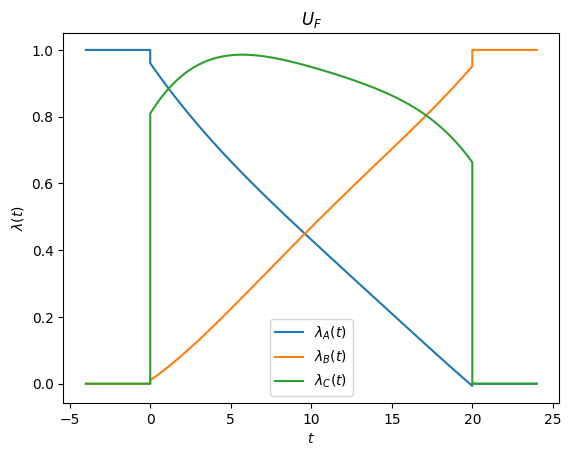

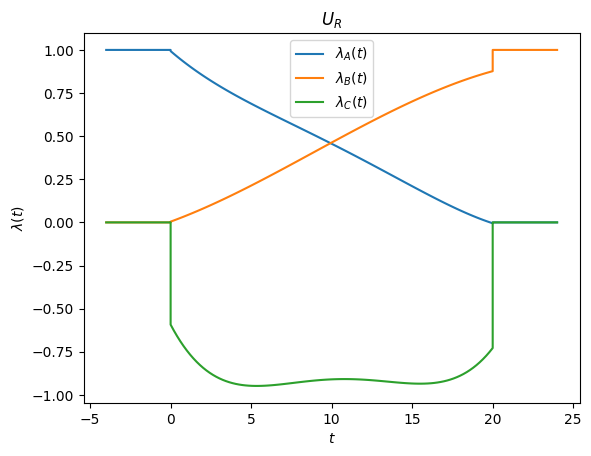

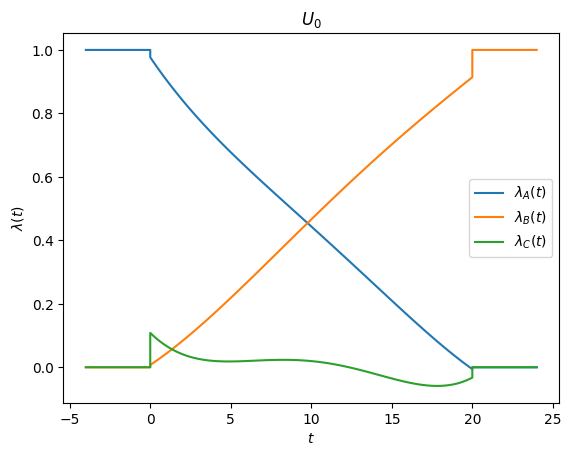

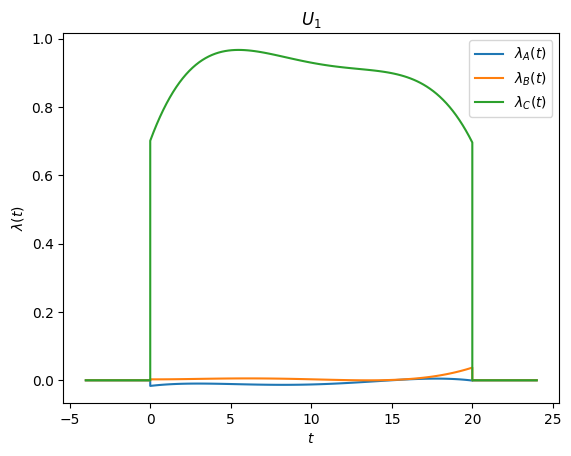

drawing new samples now -- parallelized with Pool
dF estimate 10.10095787161412 +/- 0.144684070656529
var*n_s for all trajs: 8.792061726732259, and most recent 100: 1.4043531157209517


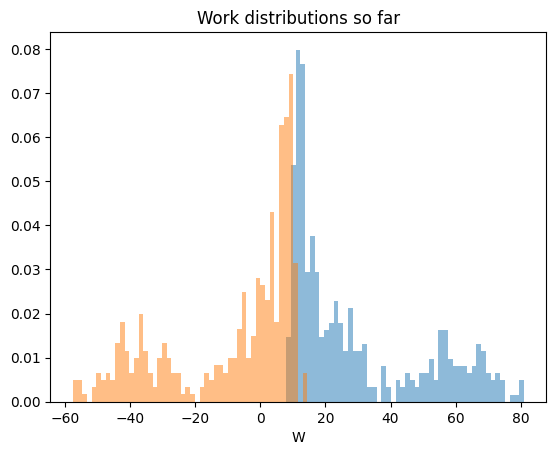

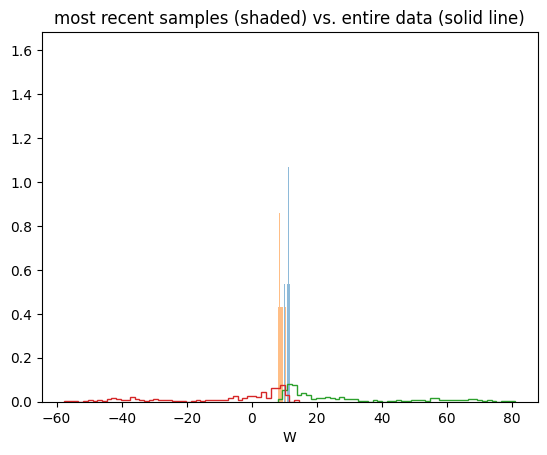

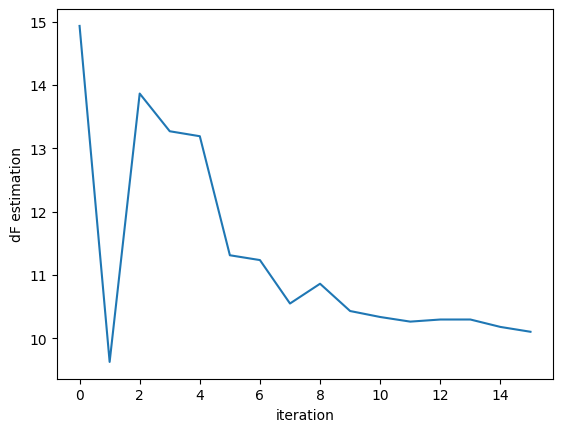

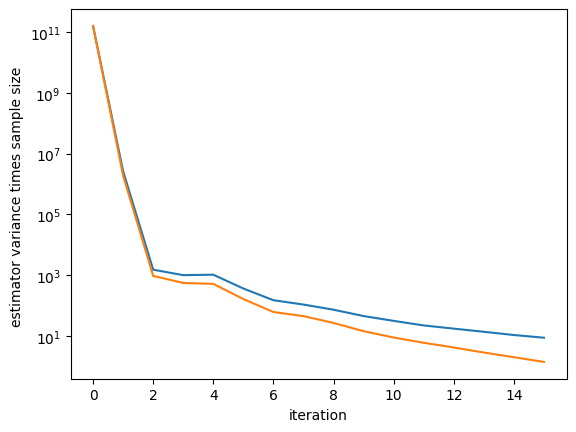

done with iteration no. 14

we have 420 F samples 420 R samples
starting protocol optimization


Visualizing new protocol:


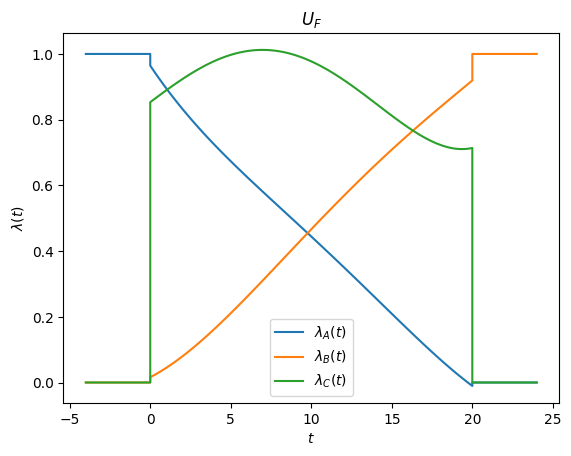

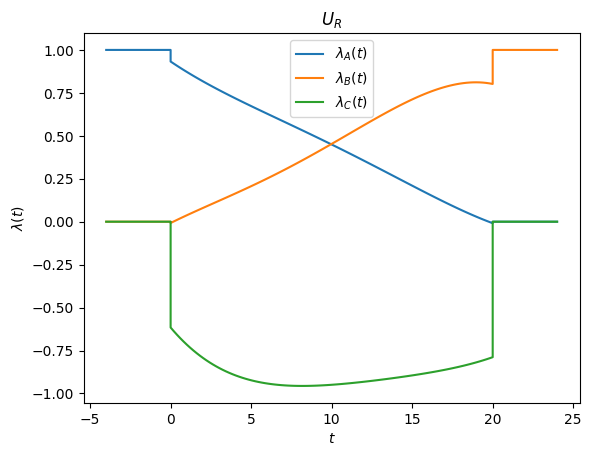

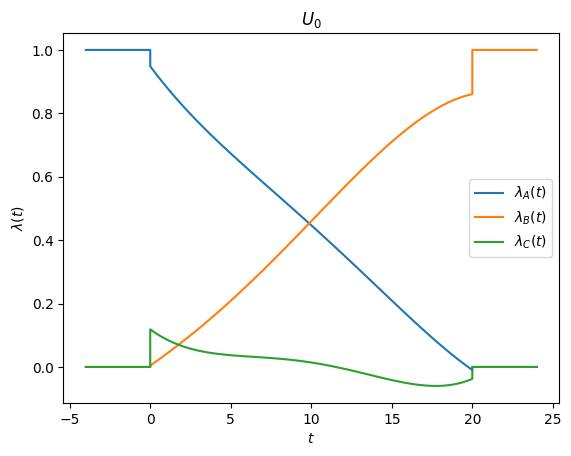

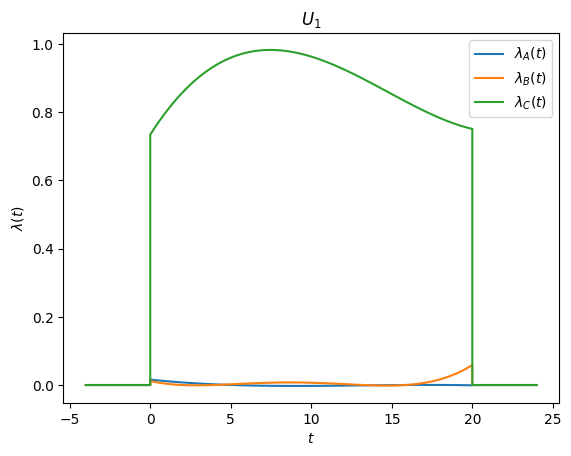

drawing new samples now -- parallelized with Pool
dF estimate 10.11280615778992 +/- 0.13154426961564733
var*n_s for all trajs: 7.613713742234211, and most recent 100: 1.1422936190171884


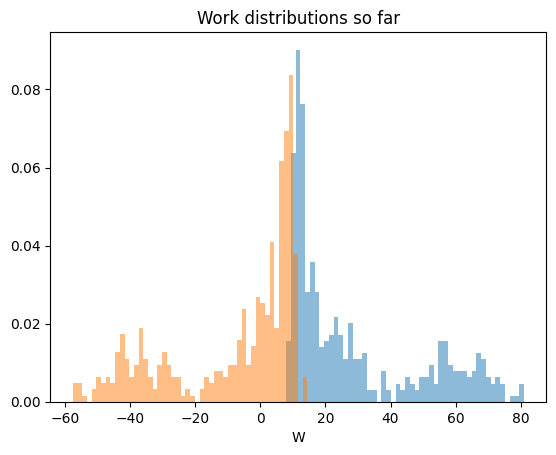

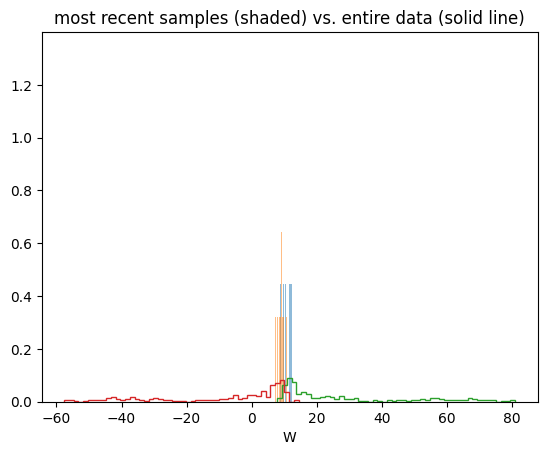

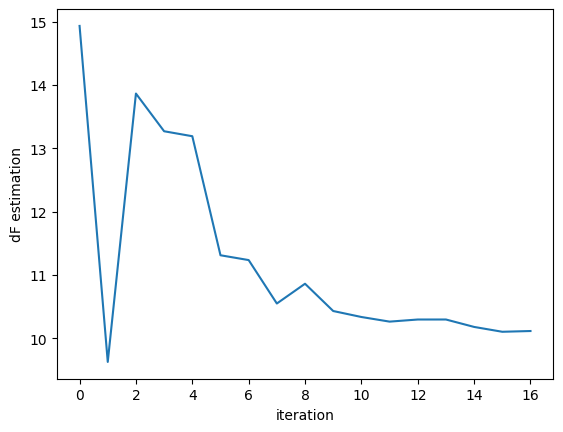

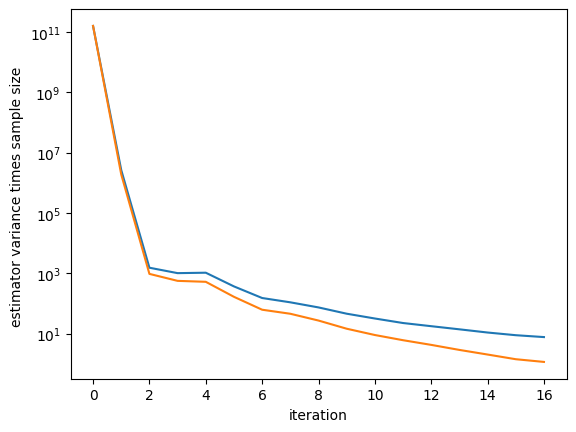

done with iteration no. 15

we have 440 F samples 440 R samples
starting protocol optimization


Visualizing new protocol:


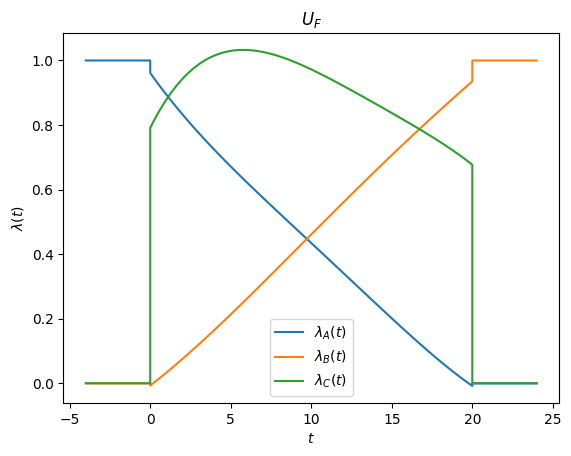

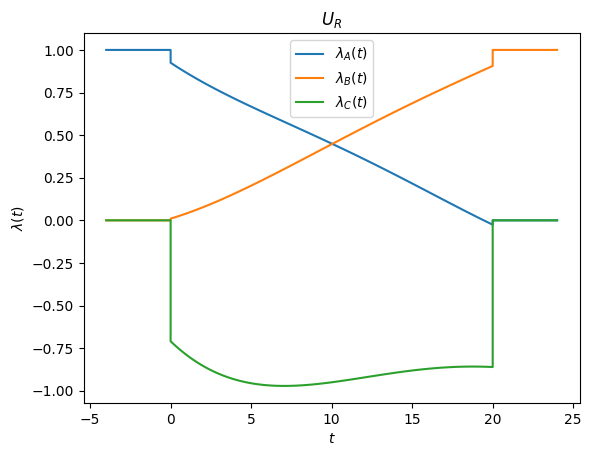

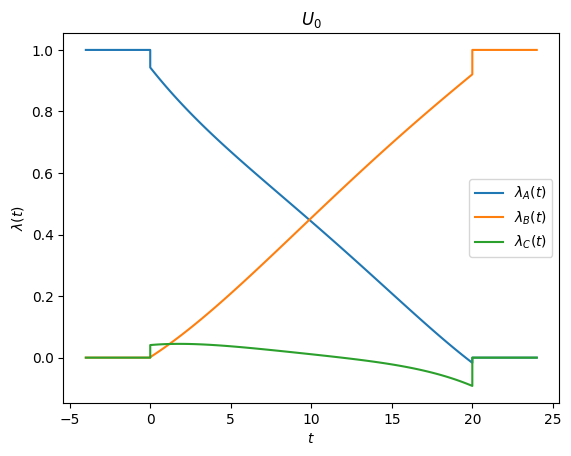

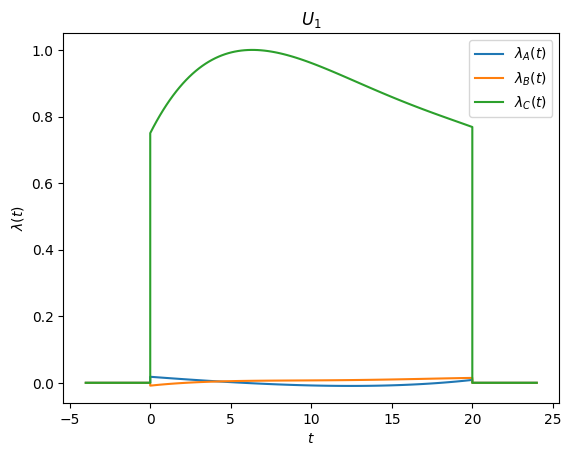

drawing new samples now -- parallelized with Pool
dF estimate 10.11329456737376 +/- 0.1194156207108301
var*n_s for all trajs: 6.559641616086305, and most recent 100: 0.8261361297840966


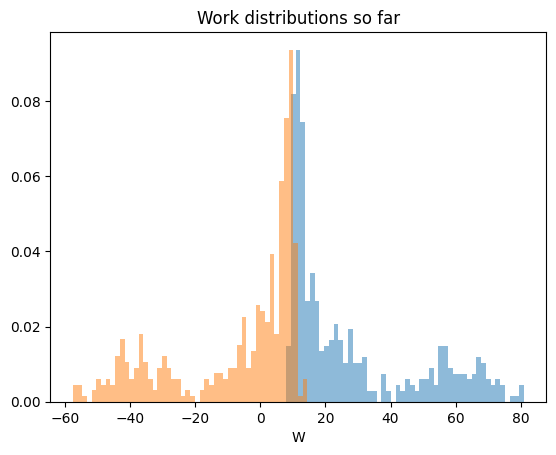

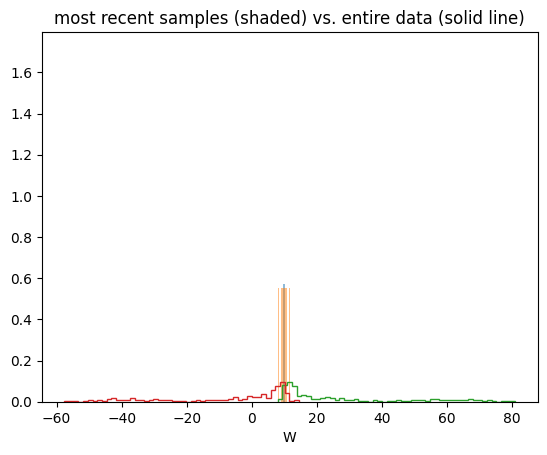

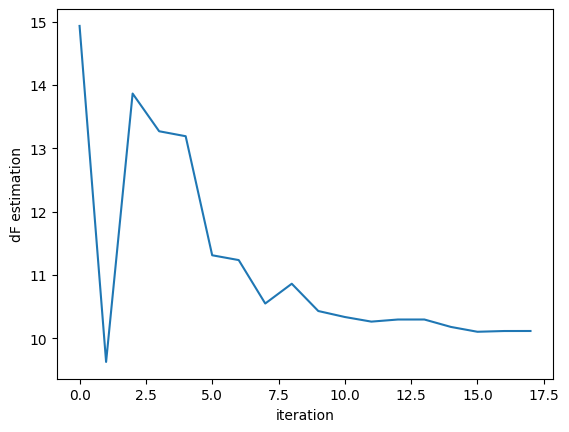

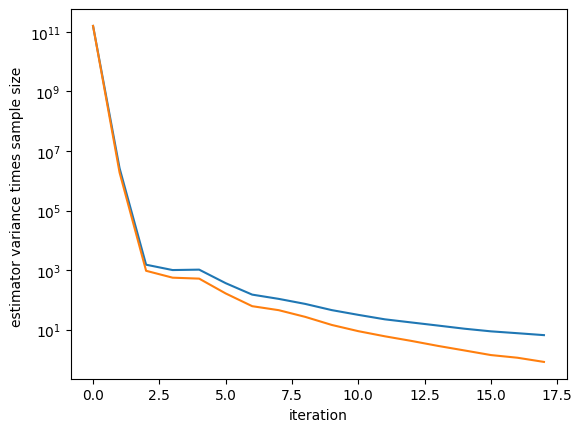

done with iteration no. 16

we have 460 F samples 460 R samples
starting protocol optimization


Visualizing new protocol:


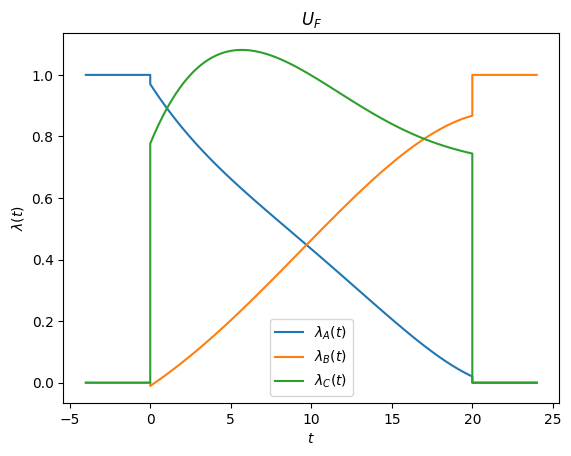

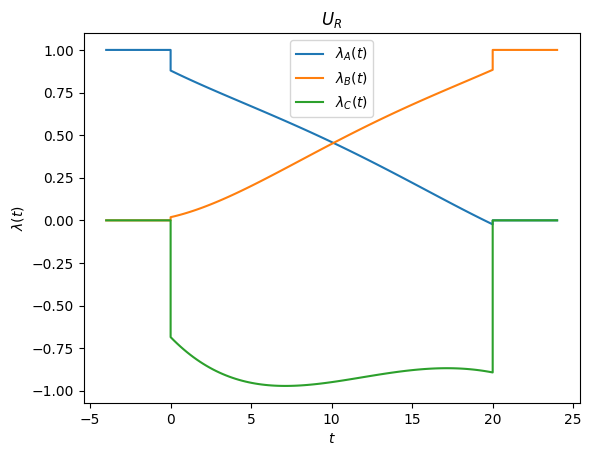

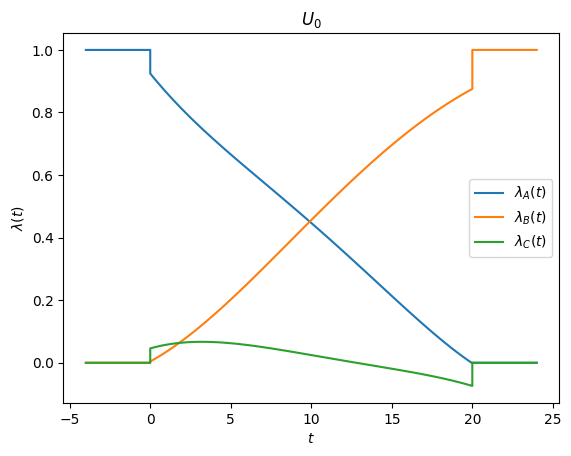

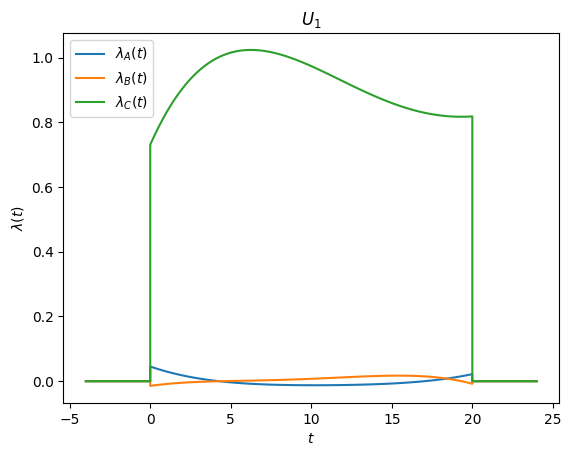

drawing new samples now -- parallelized with Pool
dF estimate 10.07271374509086 +/- 0.11217796367926895
var*n_s for all trajs: 6.040269856909145, and most recent 100: 0.7949424802610596


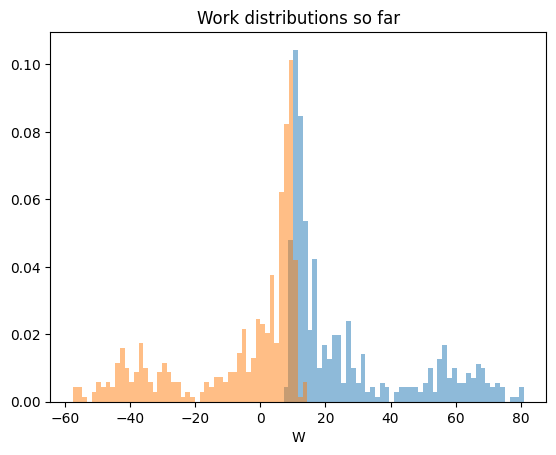

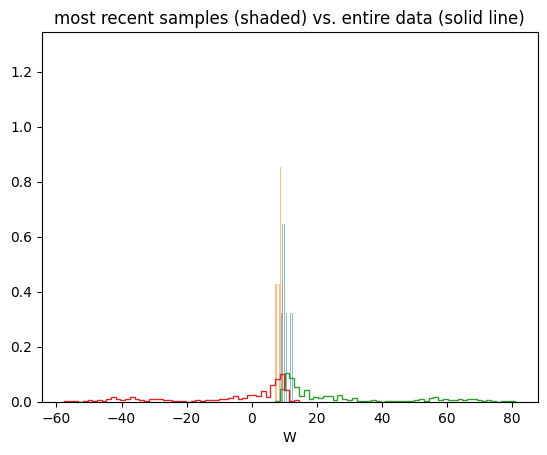

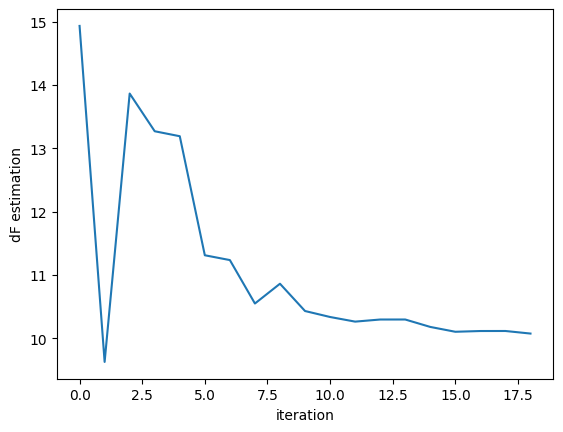

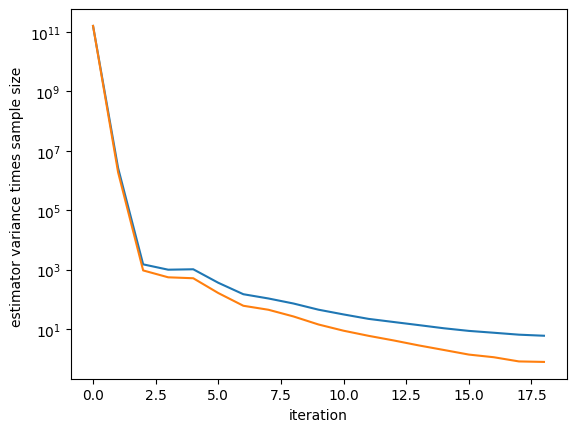

done with iteration no. 17

we have 480 F samples 480 R samples
starting protocol optimization


Visualizing new protocol:


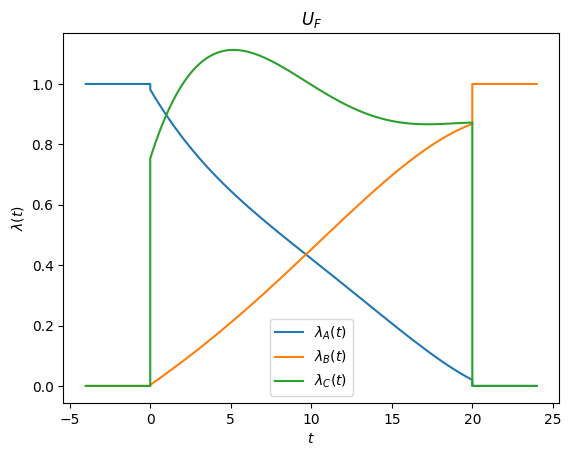

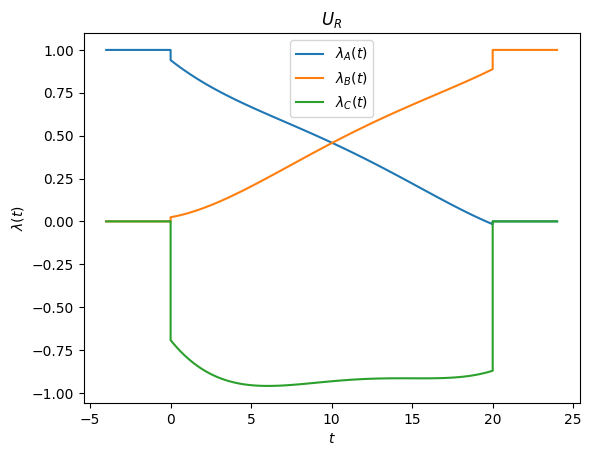

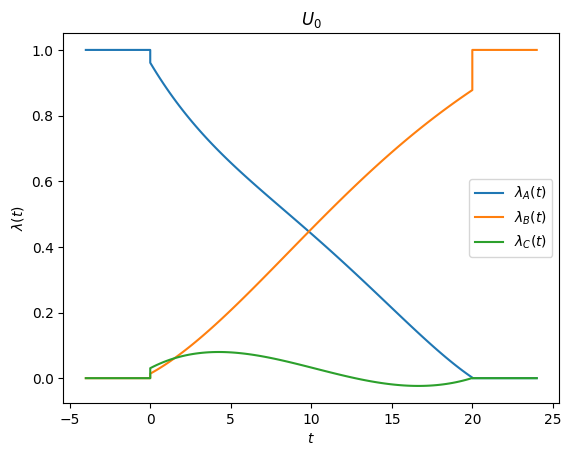

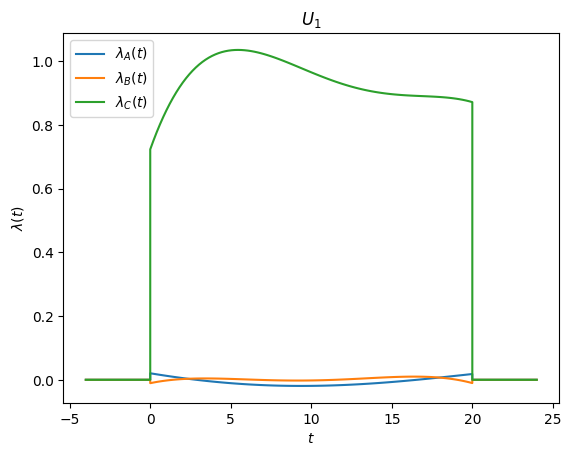

drawing new samples now -- parallelized with Pool
dF estimate 10.06162136868565 +/- 0.10478593935365213
var*n_s for all trajs: 5.490046543113631, and most recent 100: 0.817043344662629


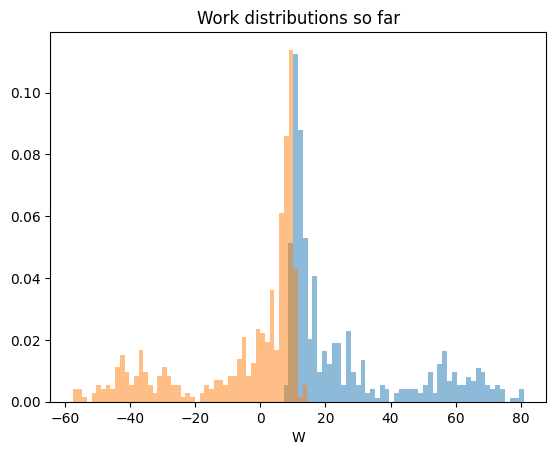

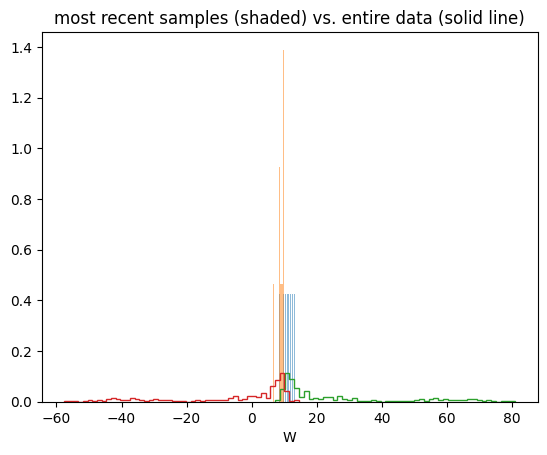

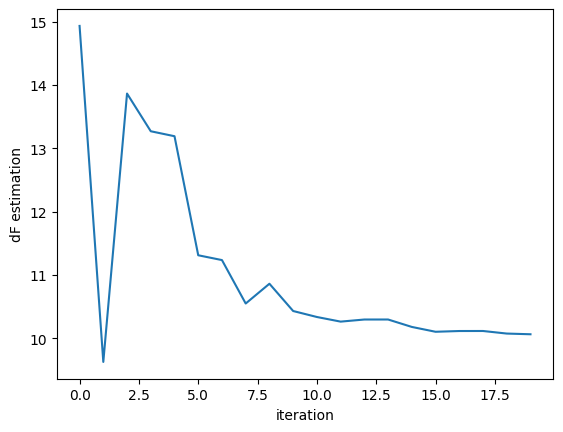

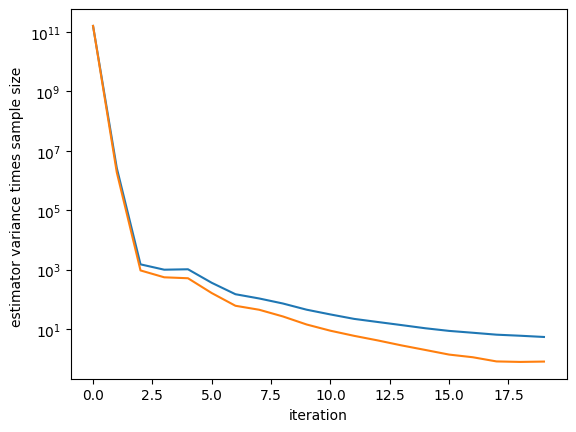

done with iteration no. 18

we have 500 F samples 500 R samples
starting protocol optimization


Visualizing new protocol:


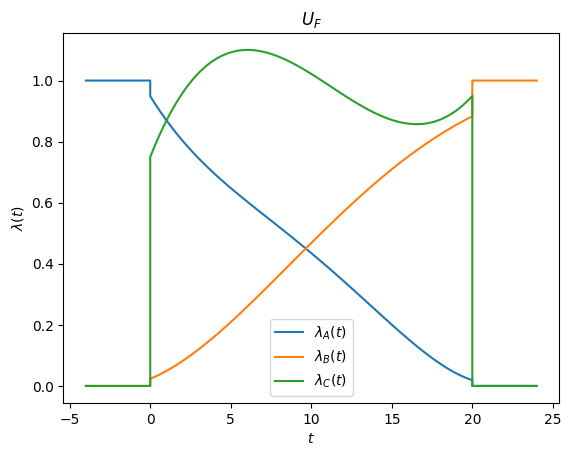

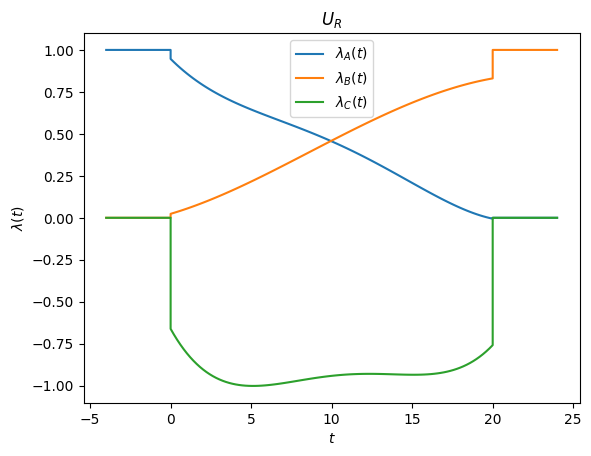

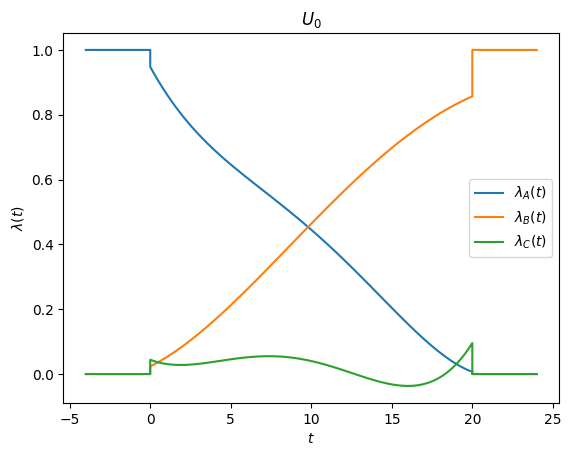

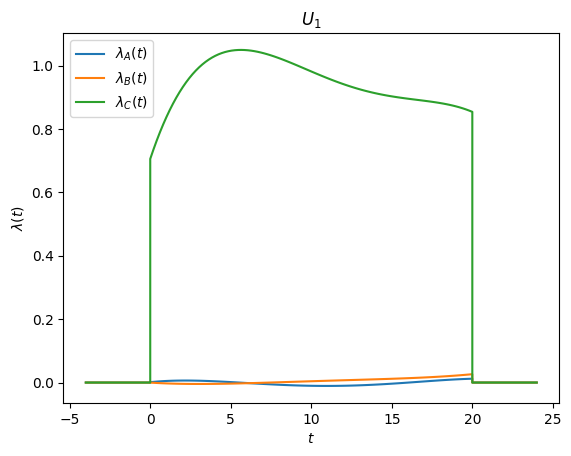

drawing new samples now -- parallelized with Pool
dF estimate 10.053326023448822 +/- 0.09776808467211778
var*n_s for all trajs: 4.970471157836284, and most recent 100: 0.8028387747187976


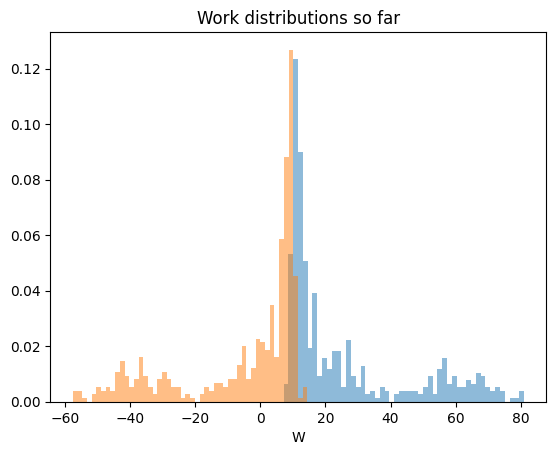

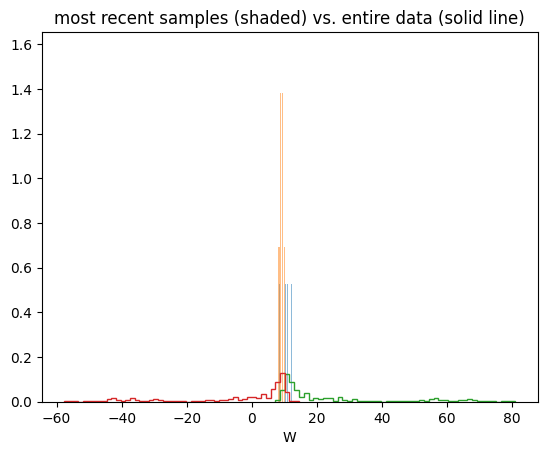

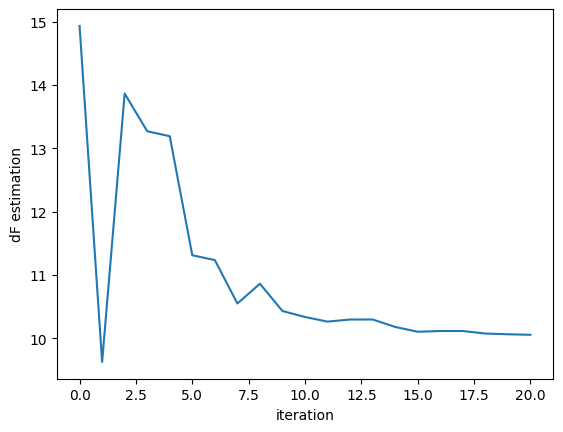

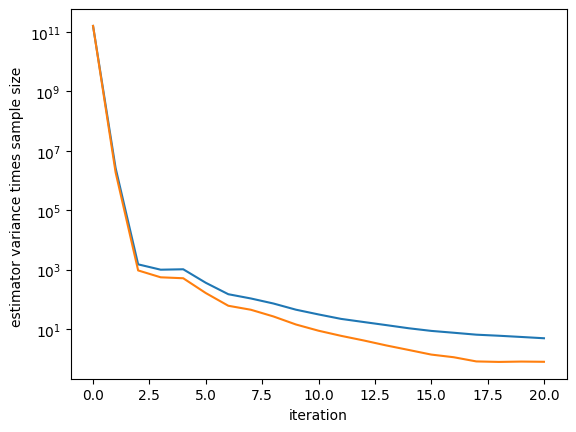

done with iteration no. 19

we have 520 F samples 520 R samples
starting protocol optimization


Visualizing new protocol:


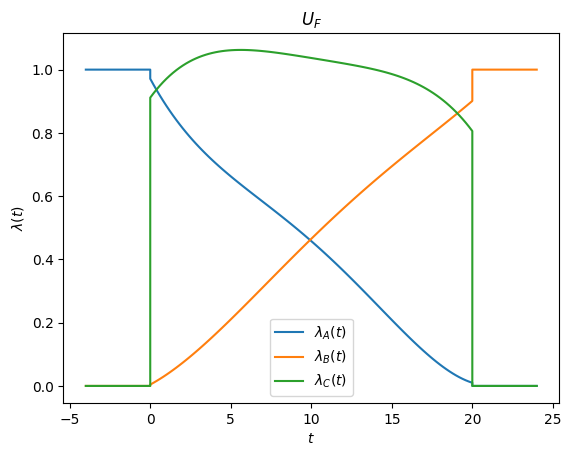

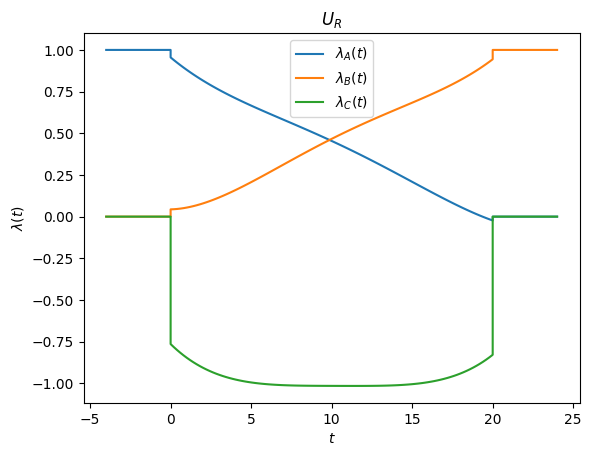

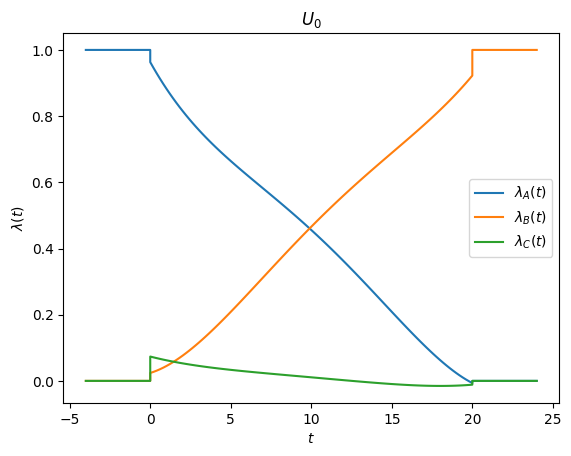

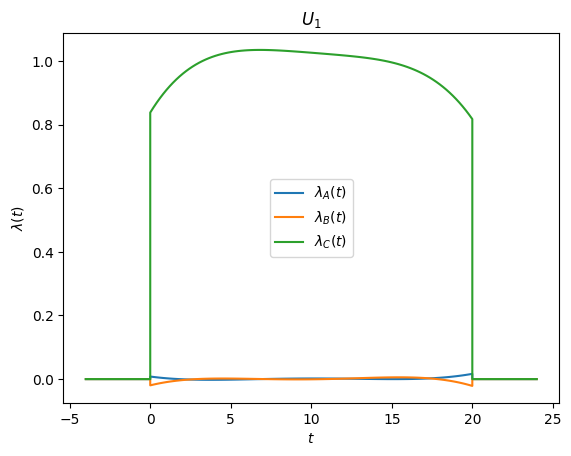

drawing new samples now -- parallelized with Pool
dF estimate 10.036835794073157 +/- 0.09112420947225992
var*n_s for all trajs: 4.483955638049925, and most recent 100: 0.6645766209353514


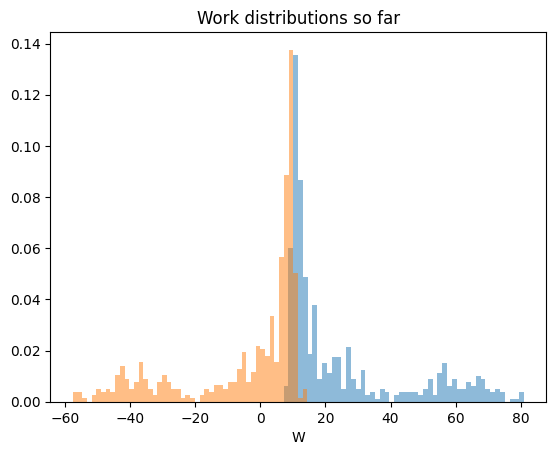

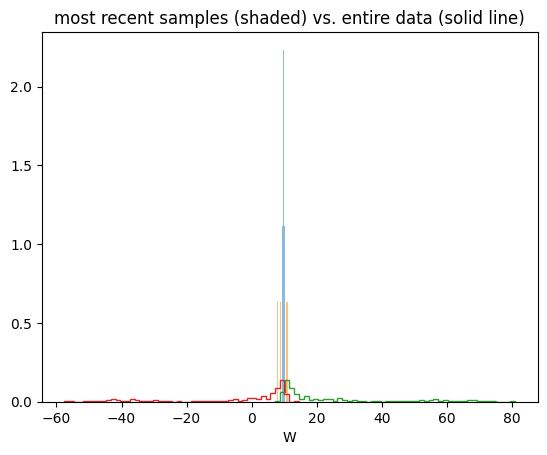

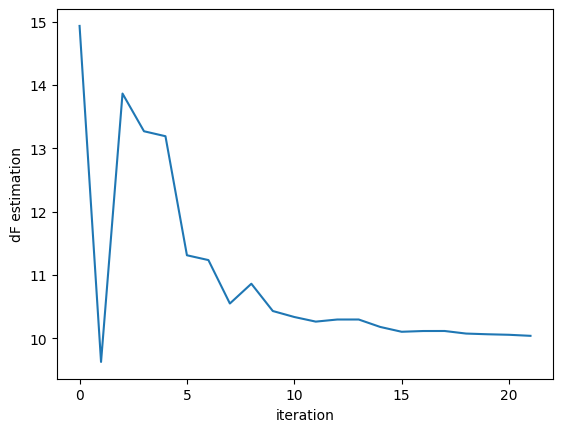

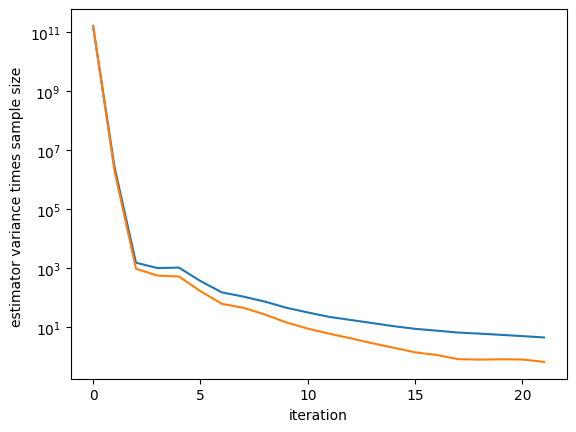

done with iteration no. 20

we have 540 F samples 540 R samples
starting protocol optimization


Visualizing new protocol:


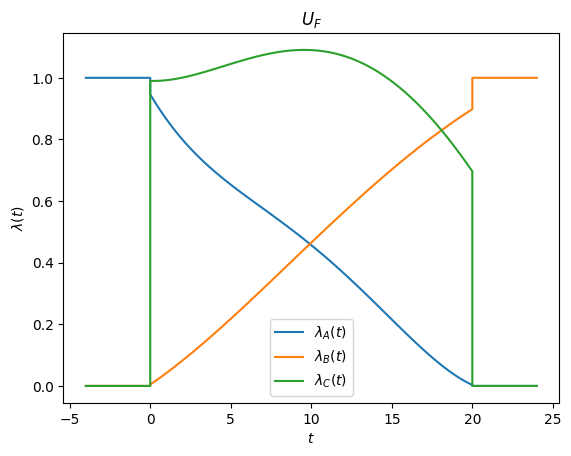

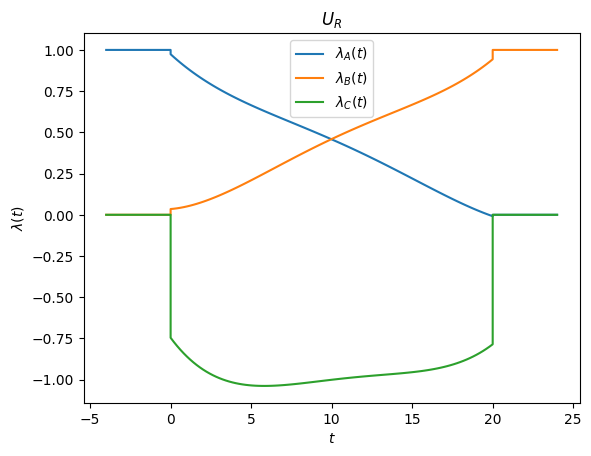

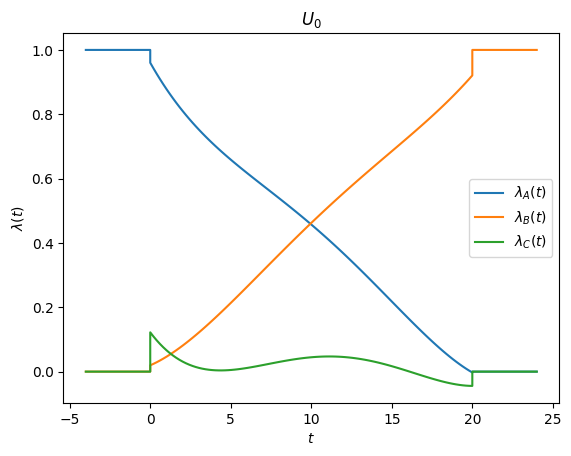

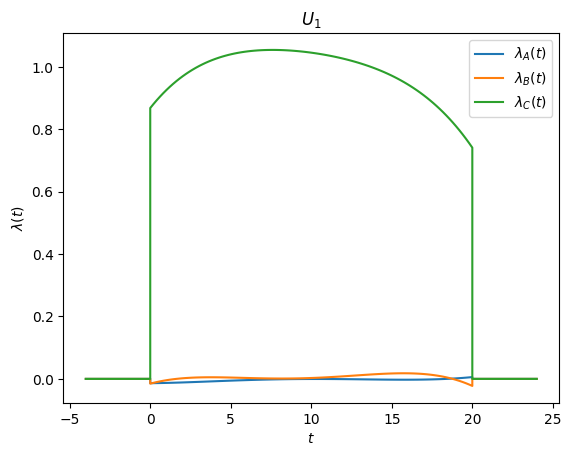

drawing new samples now -- parallelized with Pool
dF estimate 10.013903377975993 +/- 0.08556164204232099
var*n_s for all trajs: 4.099644969827831, and most recent 100: 0.624053521722312


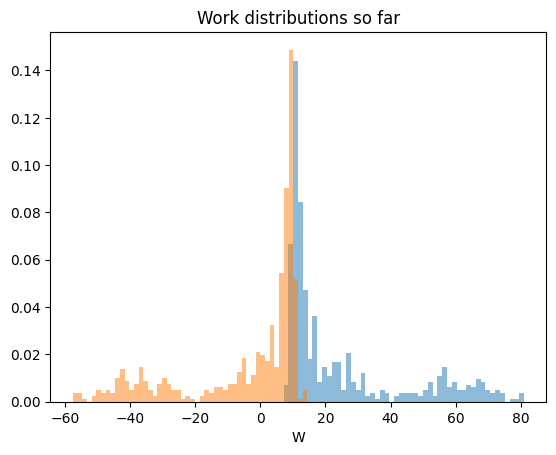

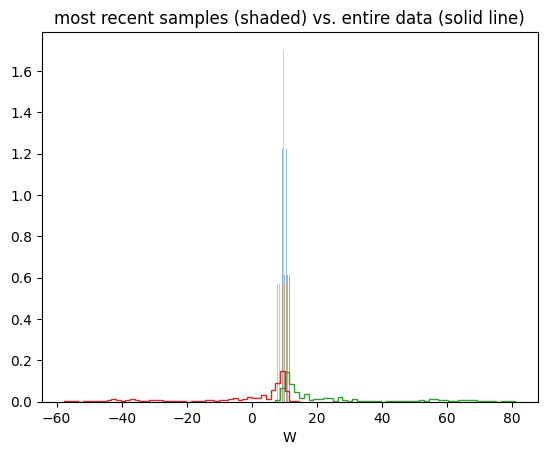

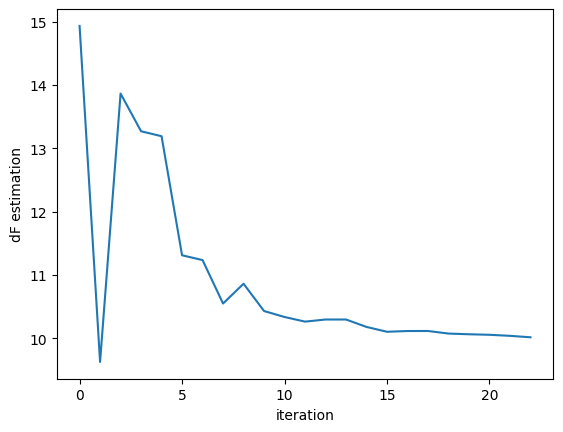

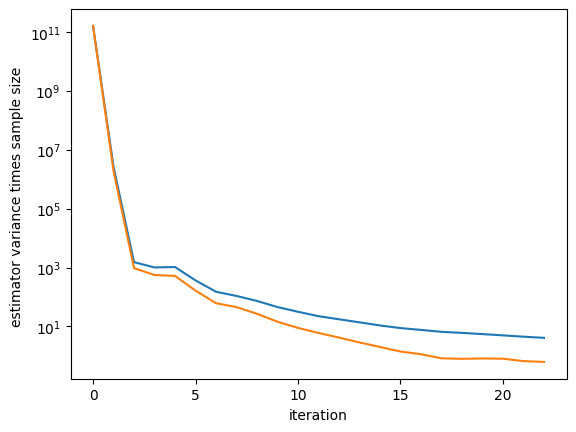

done with iteration no. 21

we have 560 F samples 560 R samples
starting protocol optimization


Visualizing new protocol:


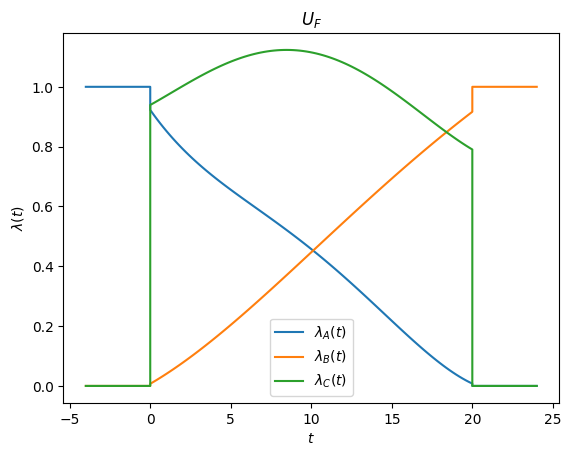

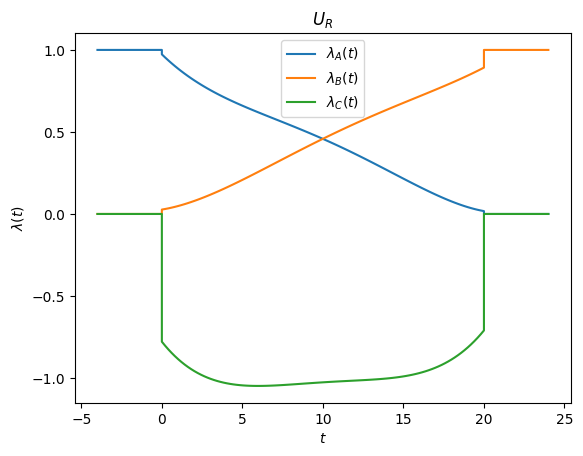

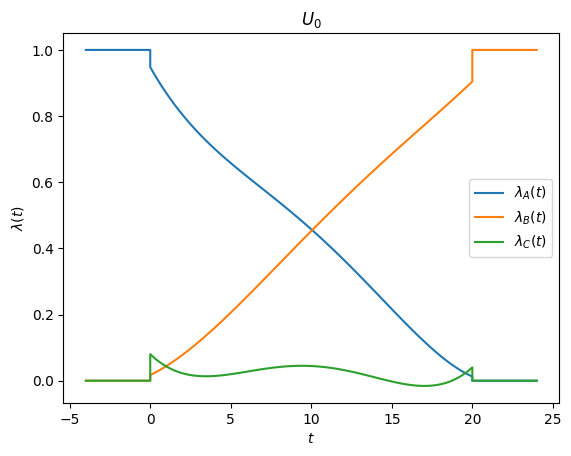

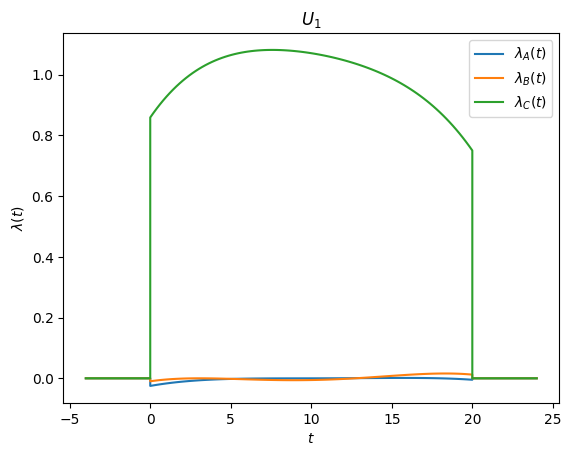

drawing new samples now -- parallelized with Pool
dF estimate 10.008797588046372 +/- 0.08049965513207023
var*n_s for all trajs: 3.7585127963016998, and most recent 100: 0.43726837375700245


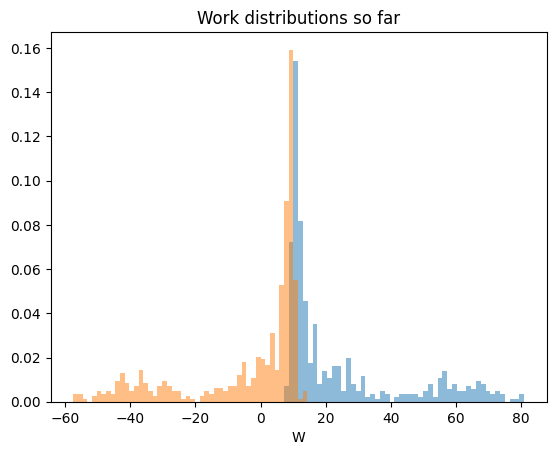

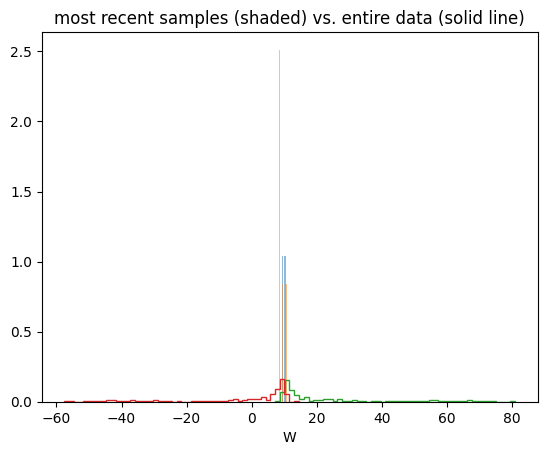

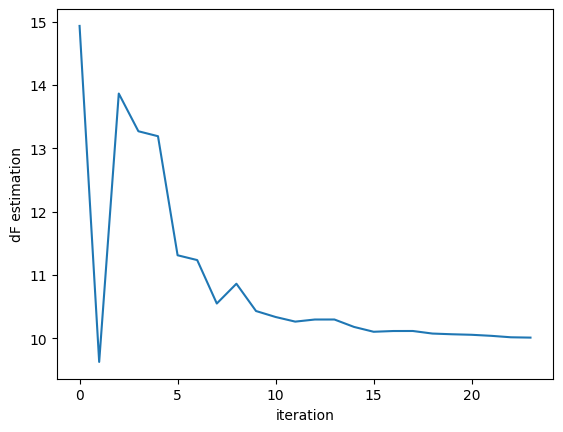

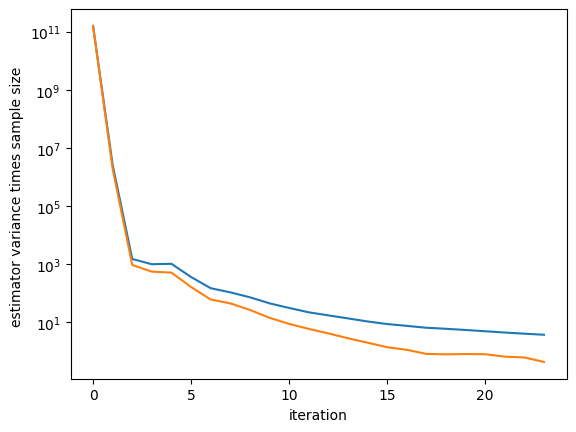

done with iteration no. 22

we have 580 F samples 580 R samples
starting protocol optimization


Visualizing new protocol:


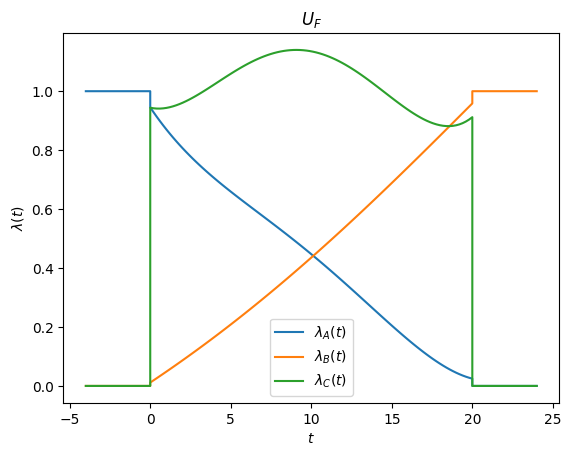

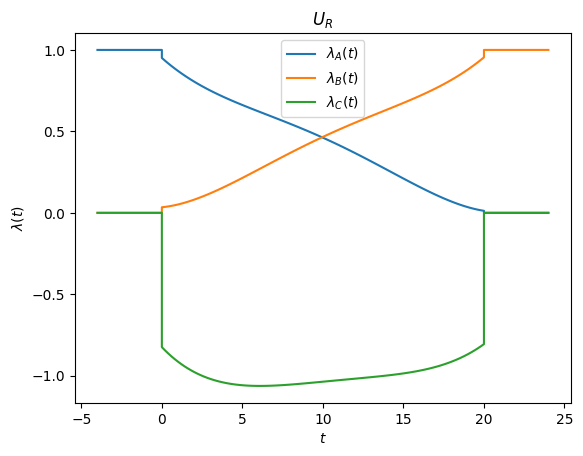

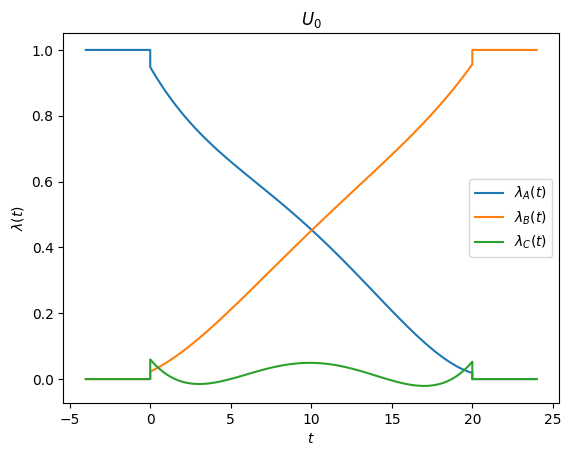

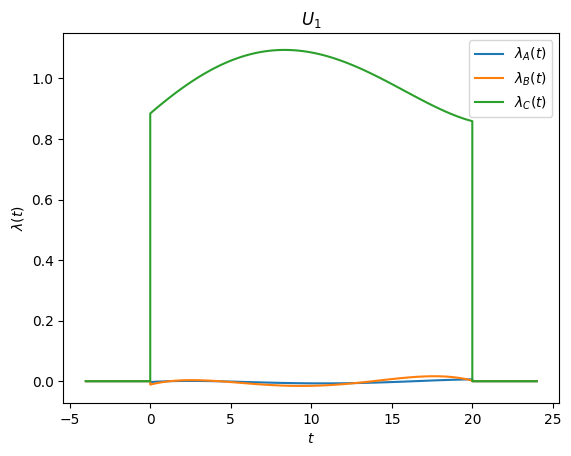

drawing new samples now -- parallelized with Pool
dF estimate 10.001161179391511 +/- 0.07620212694022993
var*n_s for all trajs: 3.4840584901289495, and most recent 100: 0.34468218981650556


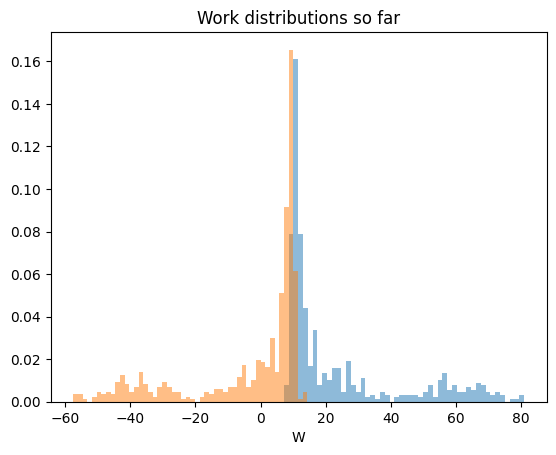

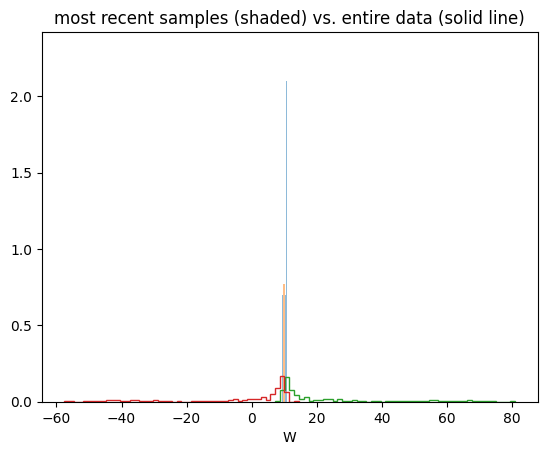

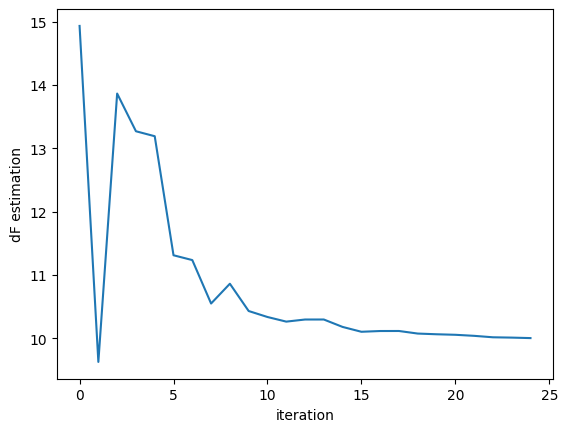

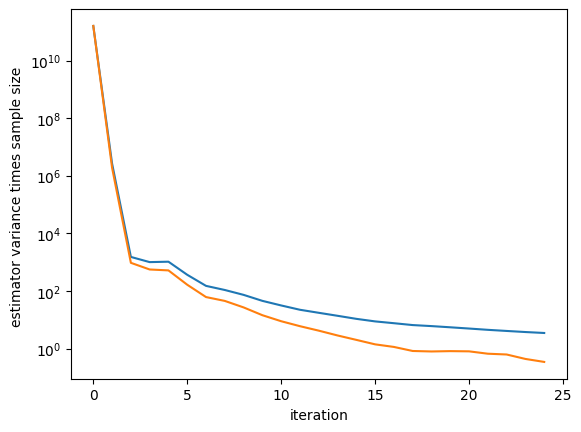

done with iteration no. 23

we have 600 F samples 600 R samples
starting protocol optimization


Visualizing new protocol:


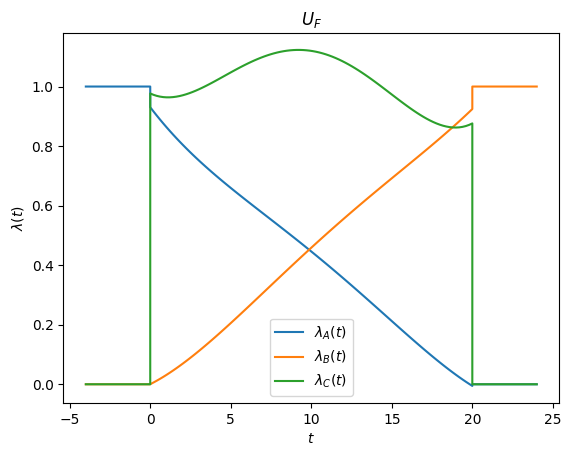

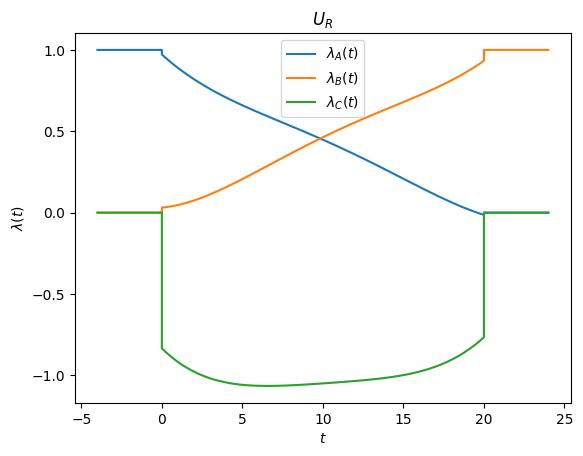

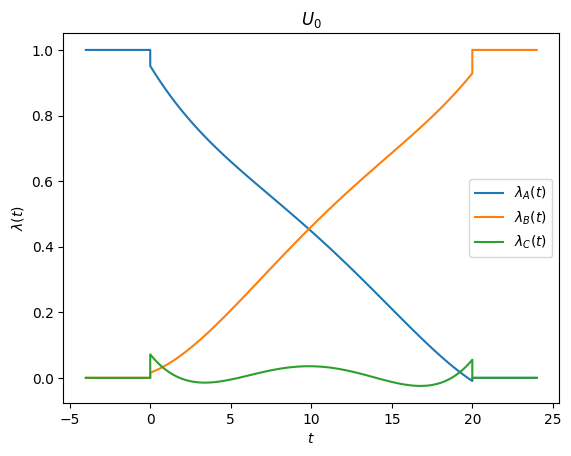

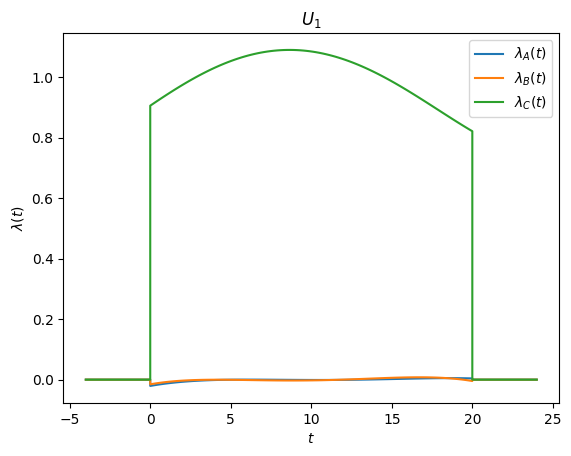

drawing new samples now -- parallelized with Pool
dF estimate 9.994766462777818 +/- 0.07270209902149906
var*n_s for all trajs: 3.27706902532175, and most recent 100: 0.3319648135255187


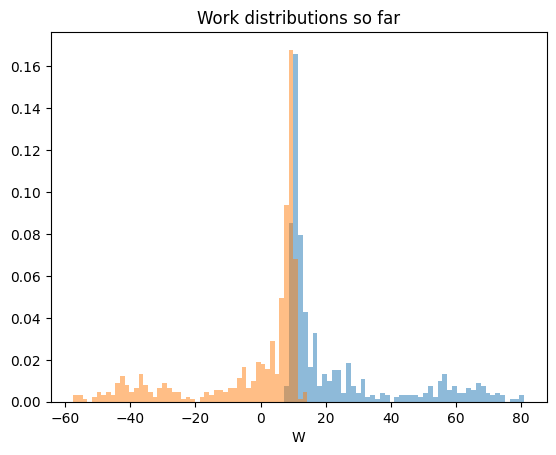

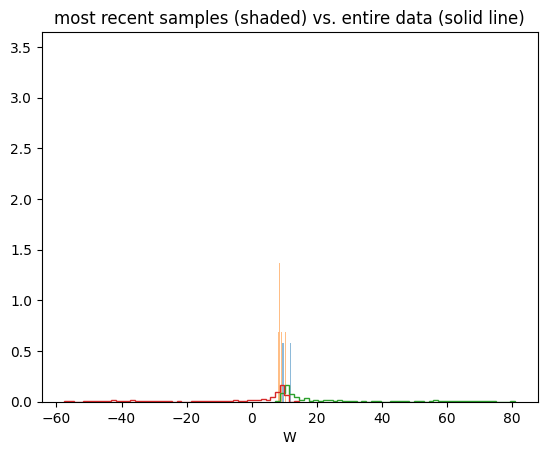

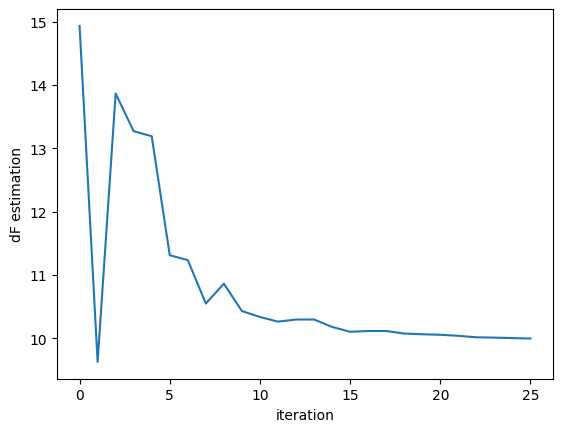

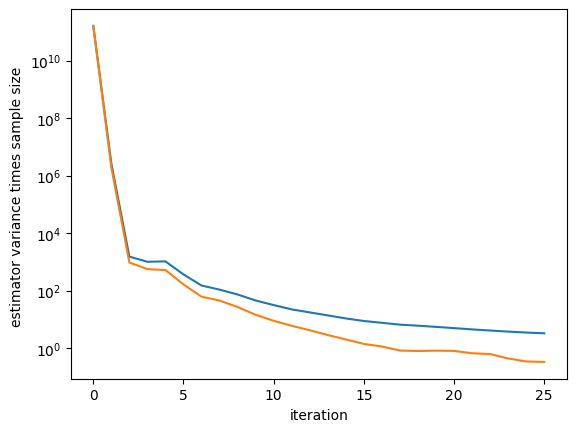

done with iteration no. 24

we have 620 F samples 620 R samples
starting protocol optimization
3 of 20 terminated with a single fn evaluation


Visualizing new protocol:


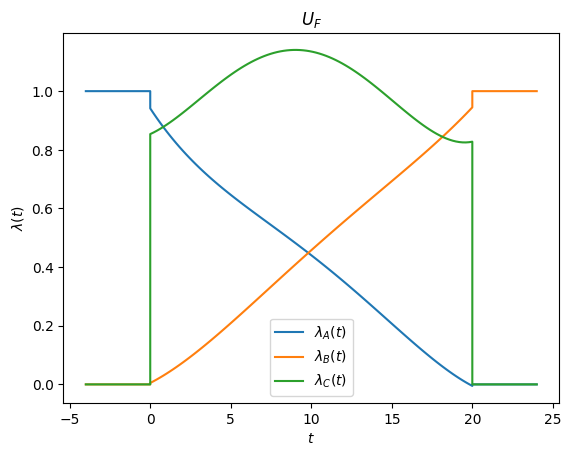

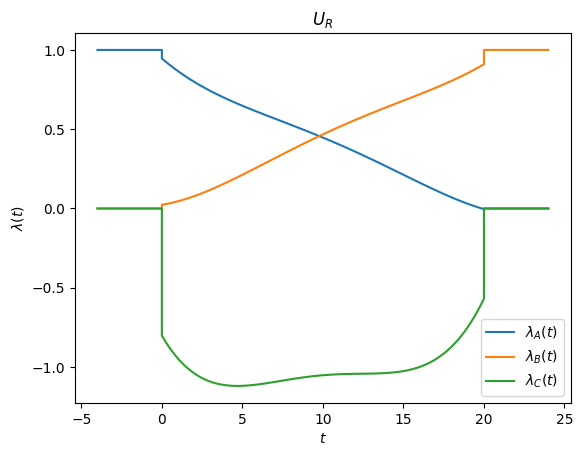

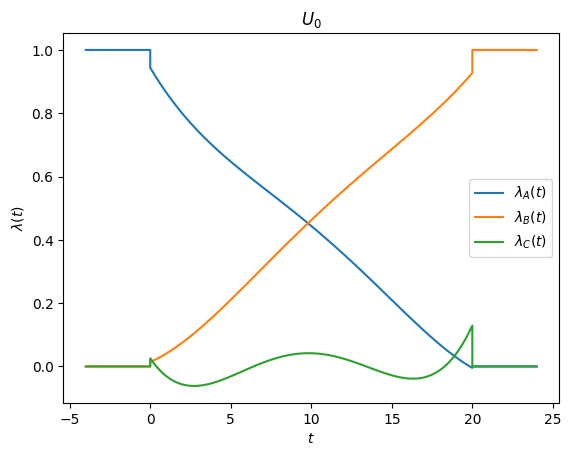

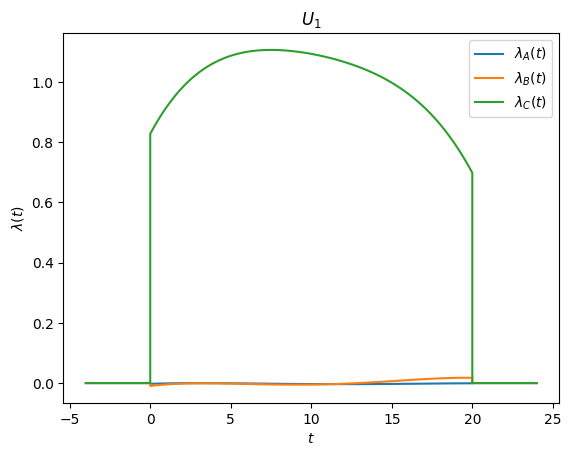

drawing new samples now -- parallelized with Pool
dF estimate 9.99741261895888 +/- 0.0695479549328623
var*n_s for all trajs: 3.095627542619805, and most recent 100: 0.3637407666265618


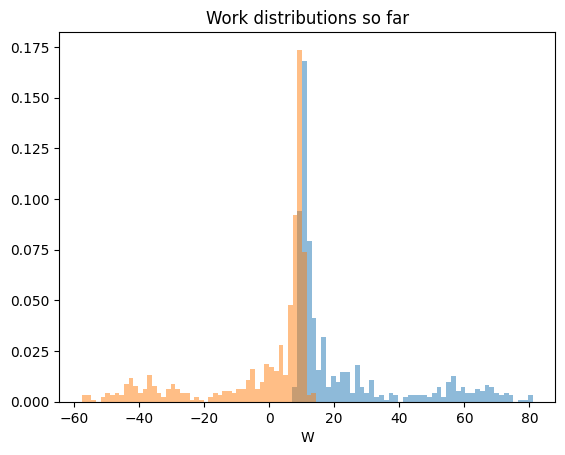

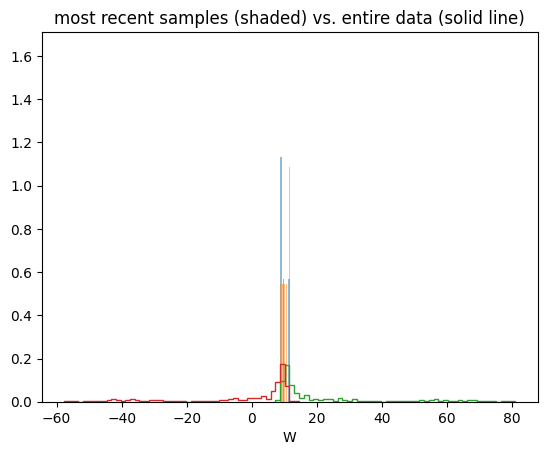

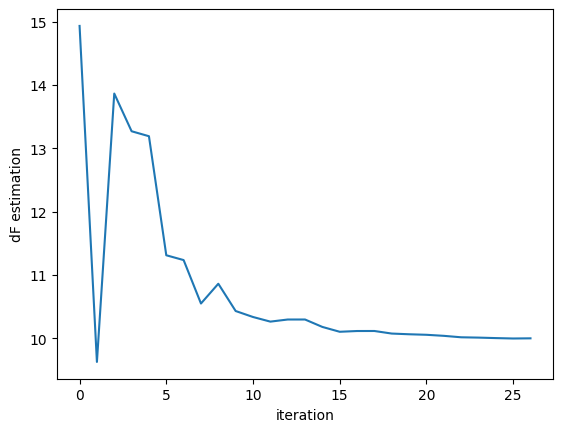

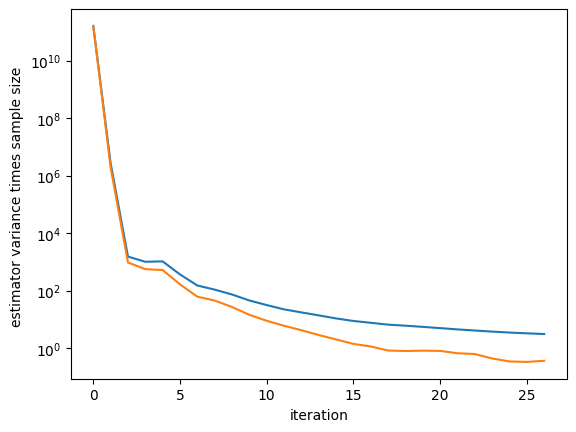

done with iteration no. 25

we have 640 F samples 640 R samples
starting protocol optimization
1 of 20 terminated with a single fn evaluation


Visualizing new protocol:


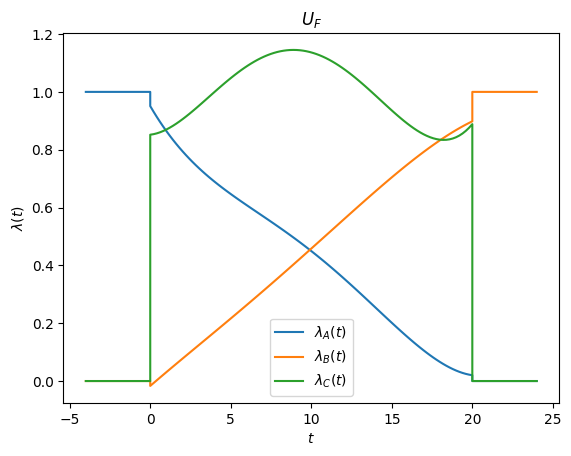

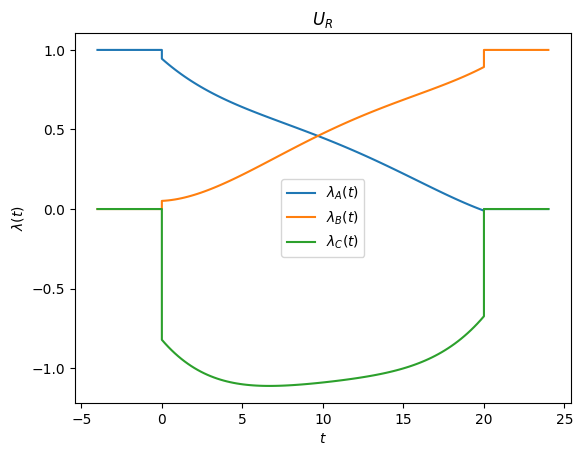

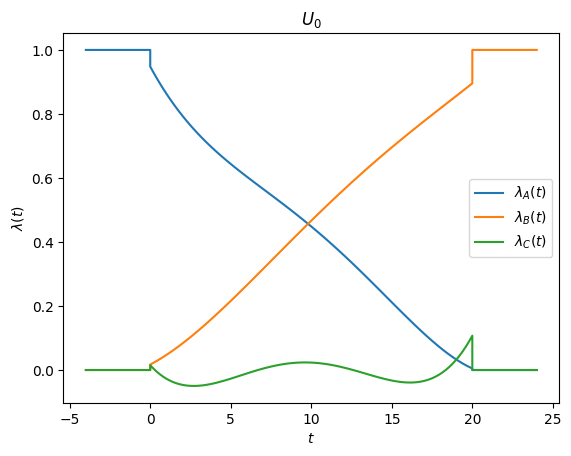

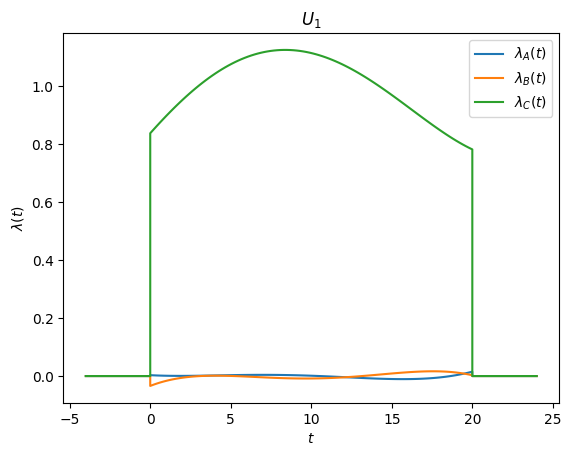

drawing new samples now -- parallelized with Pool
dF estimate 9.977148008288921 +/- 0.06674138000307592
var*n_s for all trajs: 2.9399117911118884, and most recent 100: 0.39321018372796246


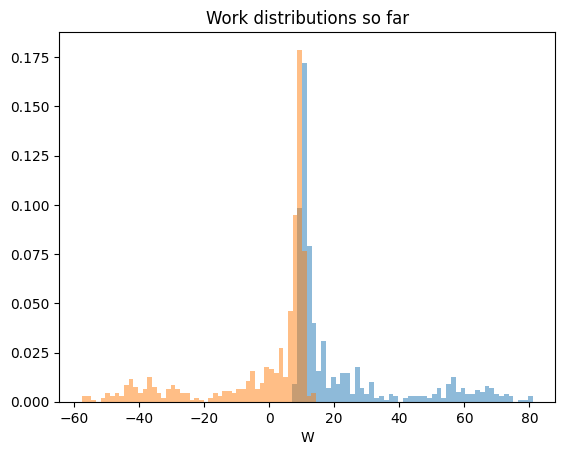

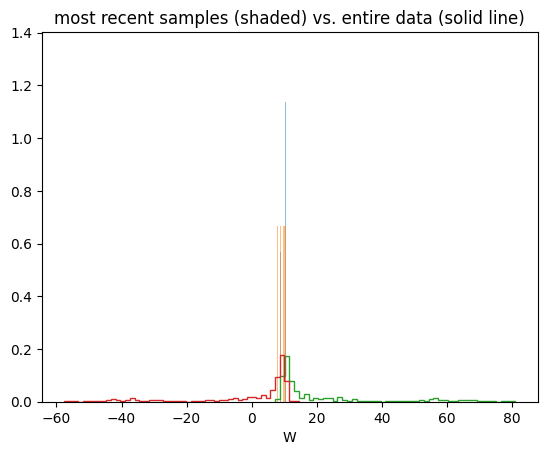

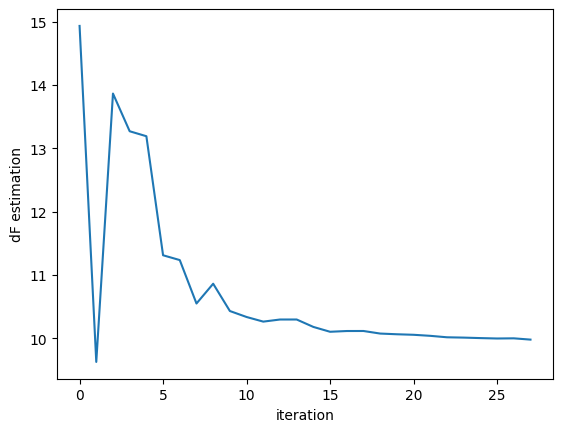

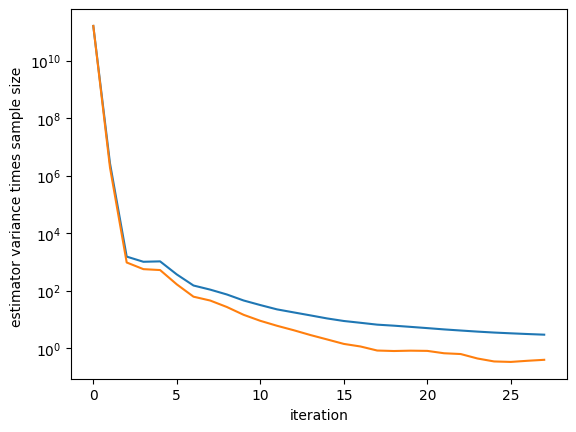

done with iteration no. 26

we have 660 F samples 660 R samples
starting protocol optimization
2 of 20 terminated with a single fn evaluation


Visualizing new protocol:


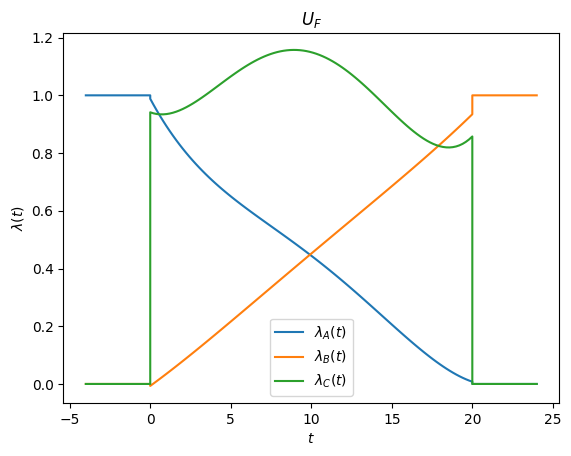

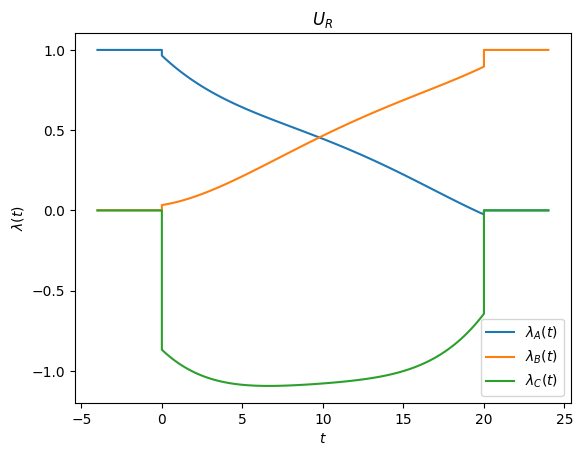

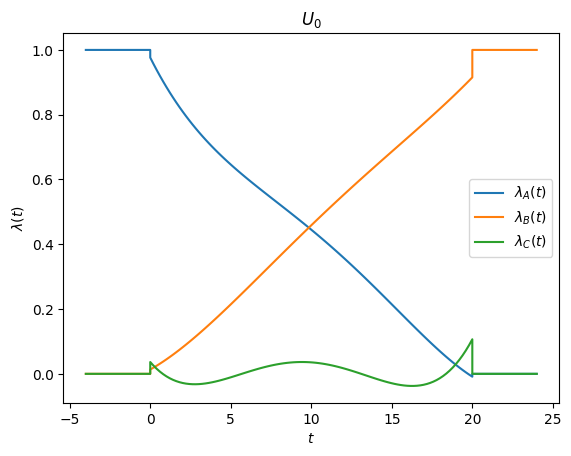

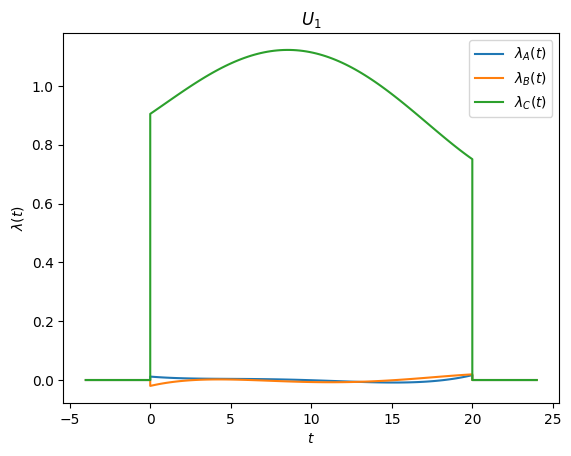

drawing new samples now -- parallelized with Pool
dF estimate 9.977240653247978 +/- 0.06407776257562522
var*n_s for all trajs: 2.7920525665547737, and most recent 100: 0.42900016006447855


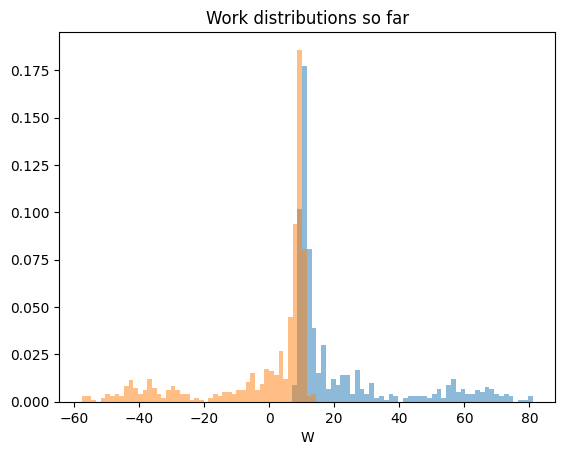

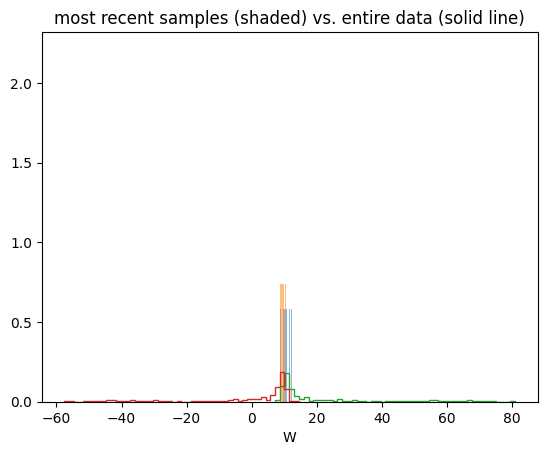

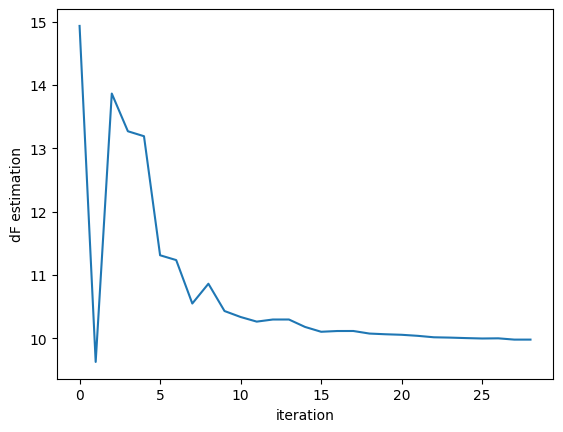

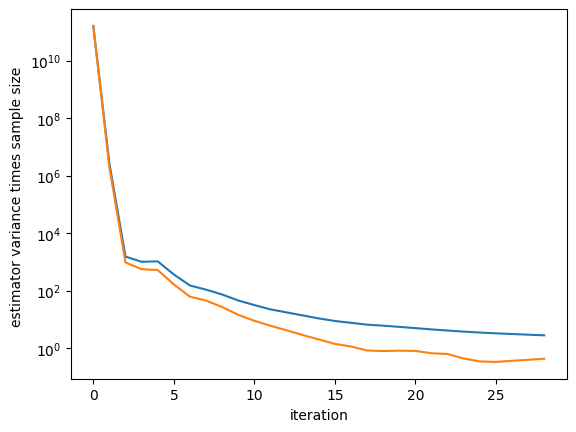

done with iteration no. 27

we have 680 F samples 680 R samples
starting protocol optimization
4 of 20 terminated with a single fn evaluation


Visualizing new protocol:


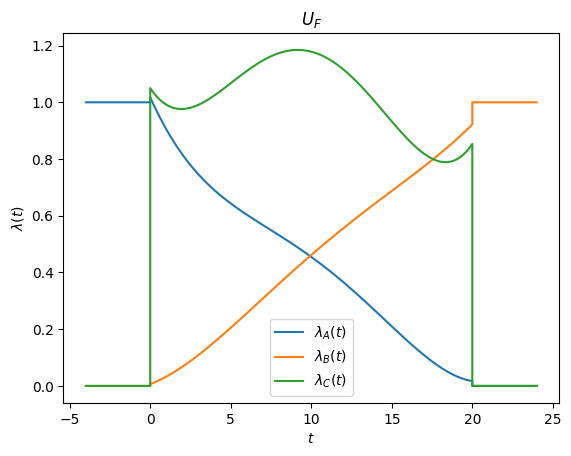

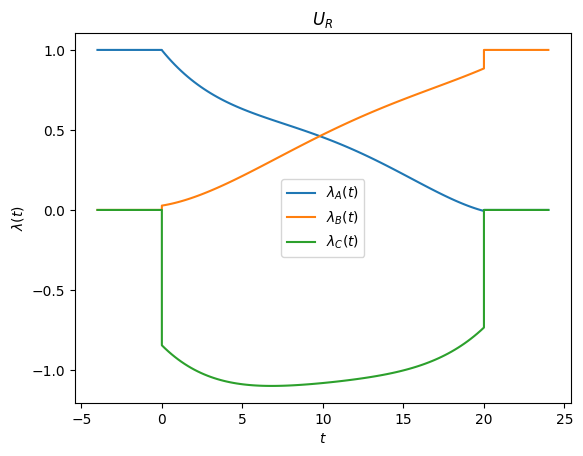

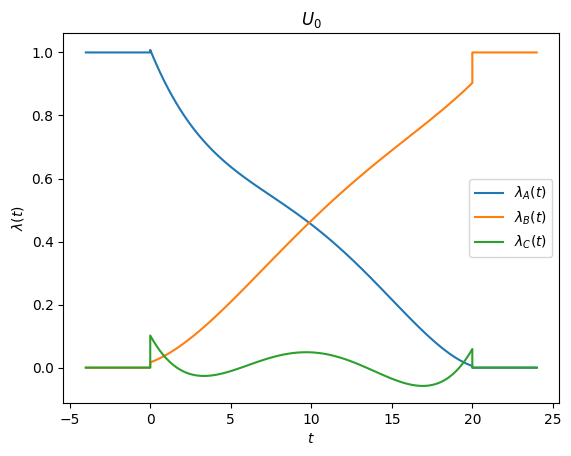

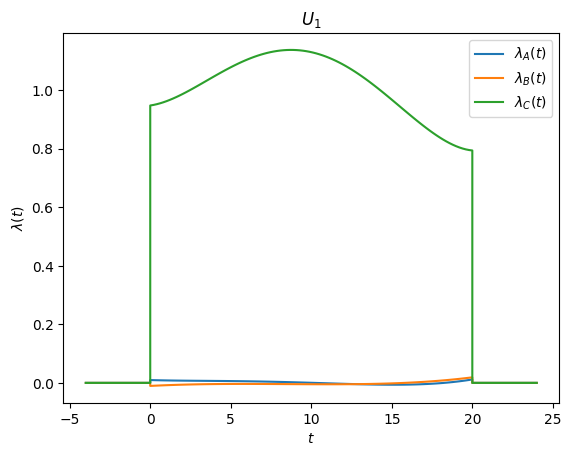

drawing new samples now -- parallelized with Pool
dF estimate 9.976367971831245 +/- 0.06178198109166694
var*n_s for all trajs: 2.671909231327764, and most recent 100: 0.4745120436621293


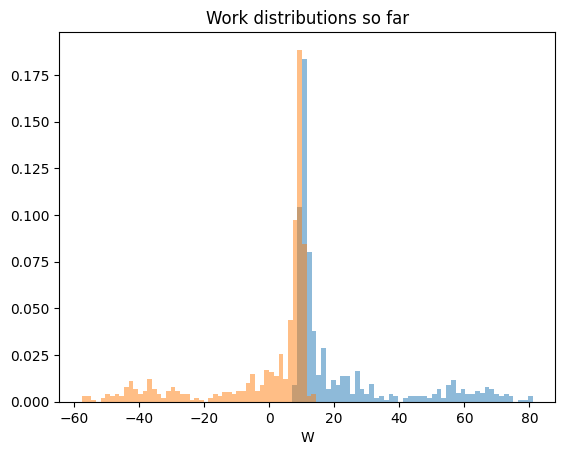

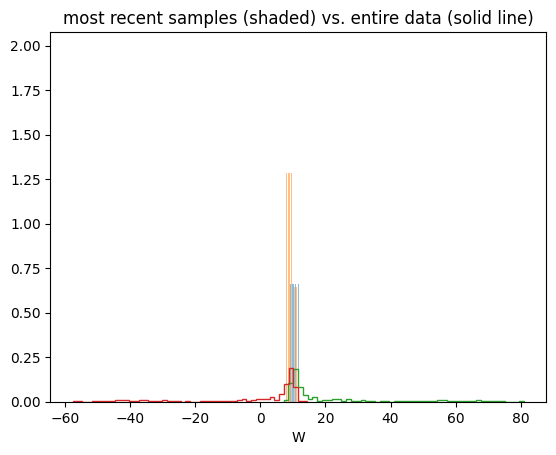

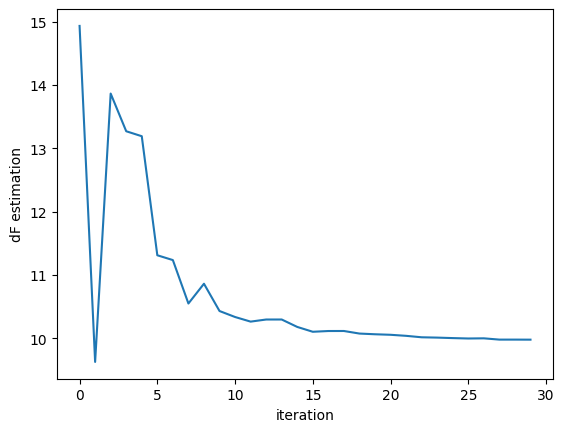

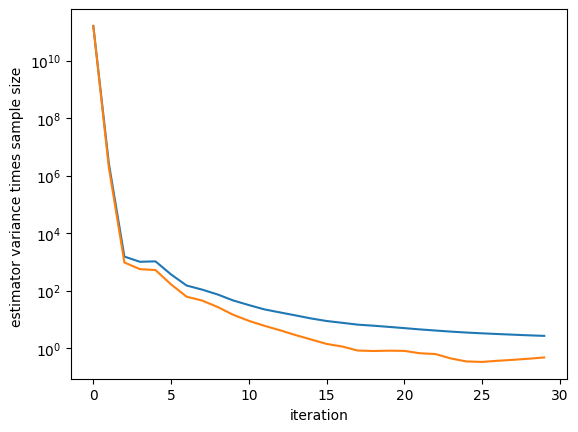

done with iteration no. 28

we have 700 F samples 700 R samples
starting protocol optimization
2 of 20 terminated with a single fn evaluation


Visualizing new protocol:


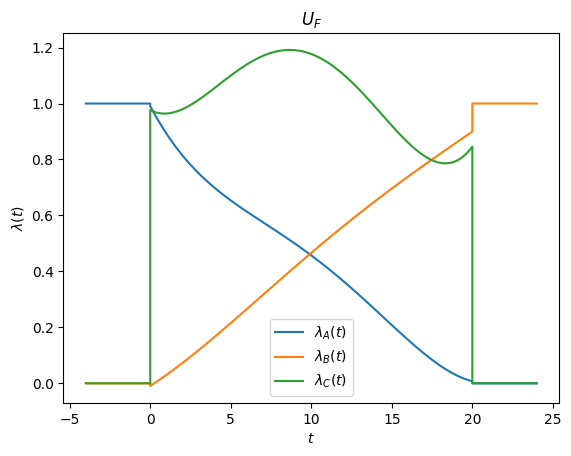

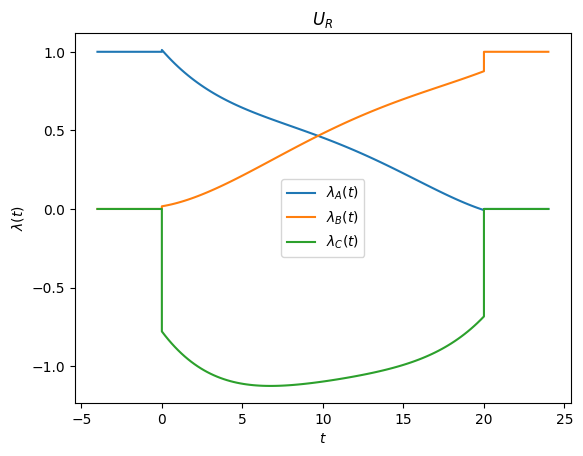

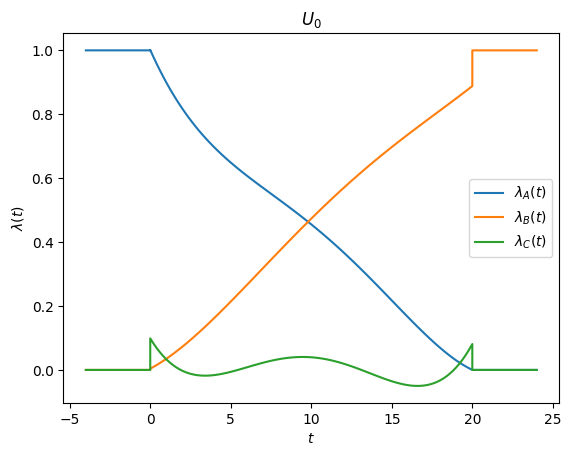

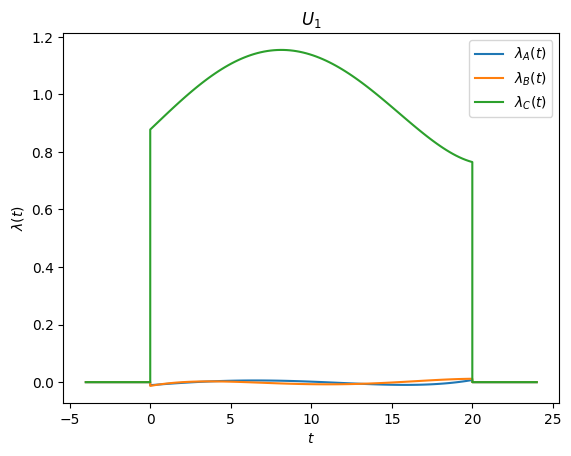

drawing new samples now -- parallelized with Pool
dF estimate 9.979274473212733 +/- 0.05949767175320455
var*n_s for all trajs: 2.5487805197174938, and most recent 100: 0.4518905529158304


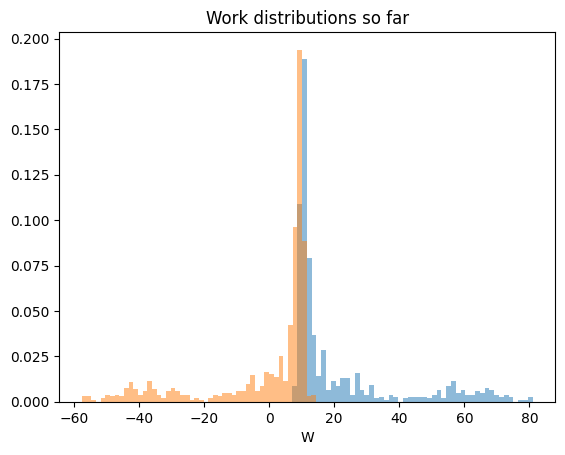

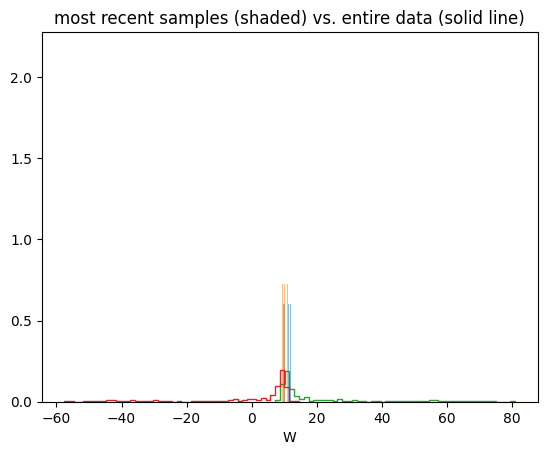

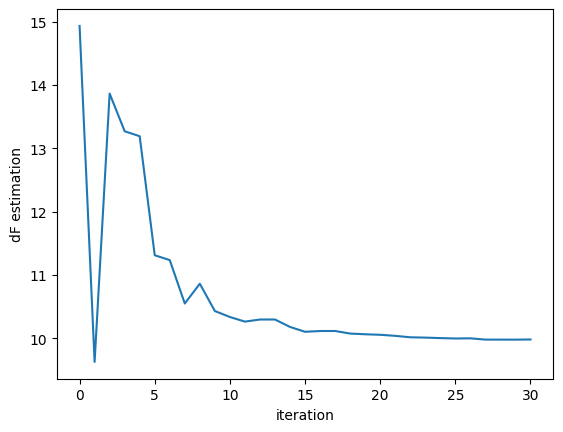

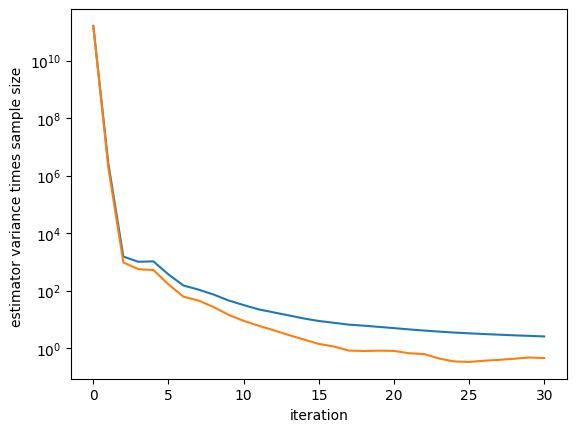

done with iteration no. 29

we have 720 F samples 720 R samples
starting protocol optimization
2 of 20 terminated with a single fn evaluation


Visualizing new protocol:


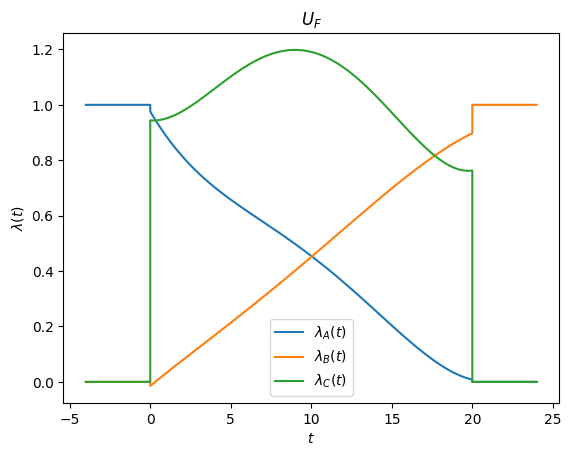

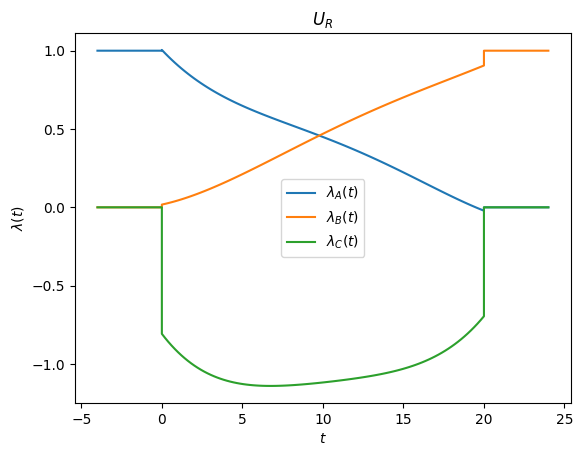

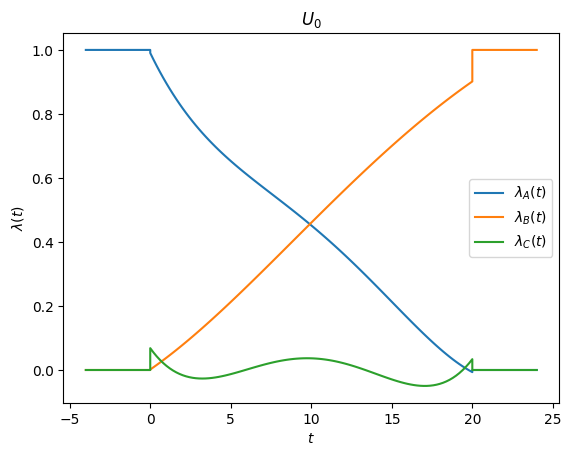

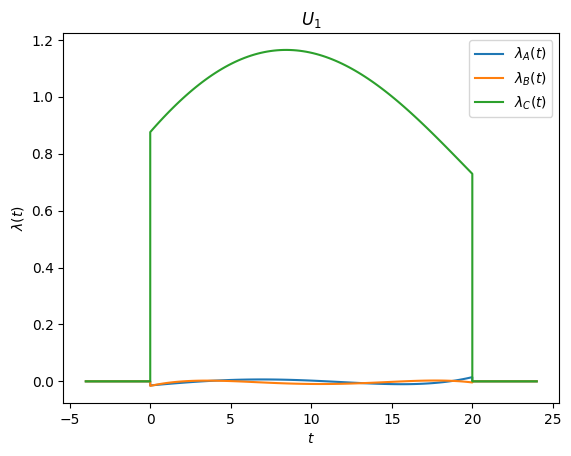

drawing new samples now -- parallelized with Pool
dF estimate 9.98393993591062 +/- 0.057342128749939866
var*n_s for all trajs: 2.4332085998852633, and most recent 100: 0.42054106086294346


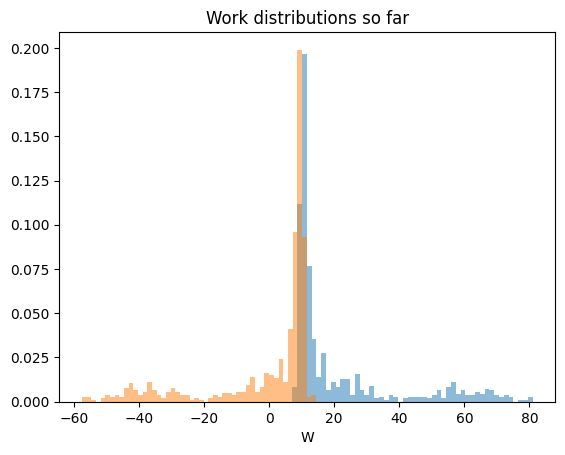

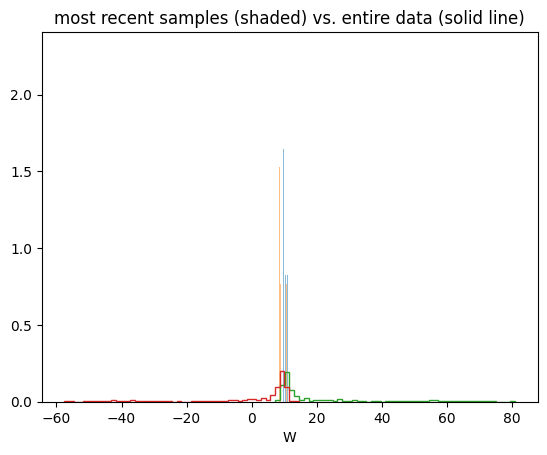

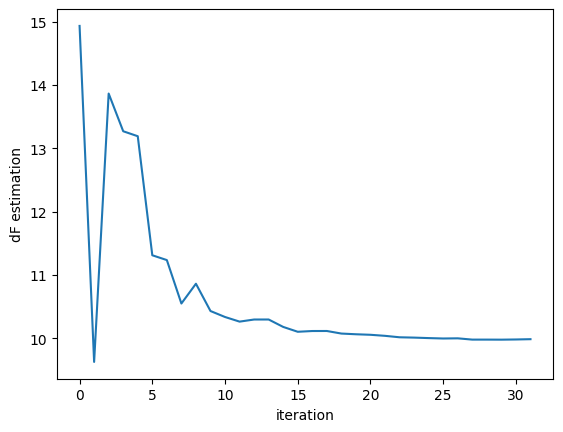

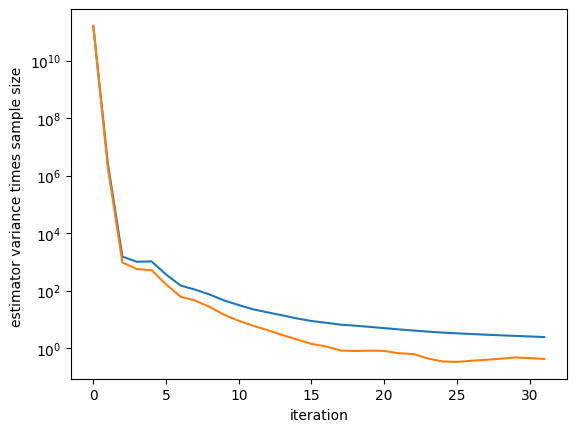

done with iteration no. 30

we have 740 F samples 740 R samples
starting protocol optimization
7 of 20 terminated with a single fn evaluation


Visualizing new protocol:


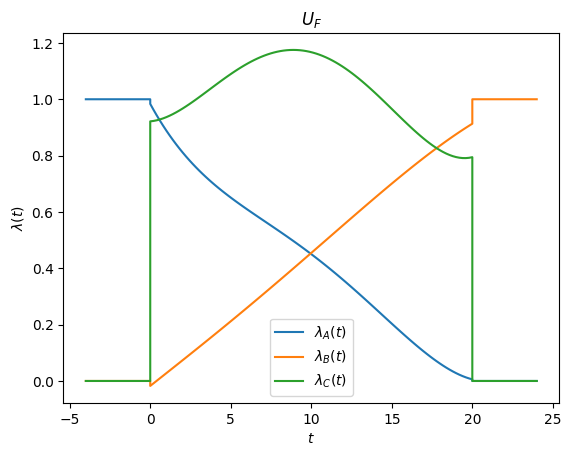

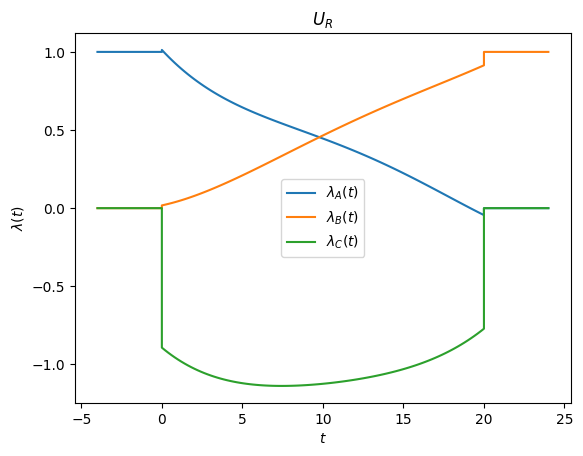

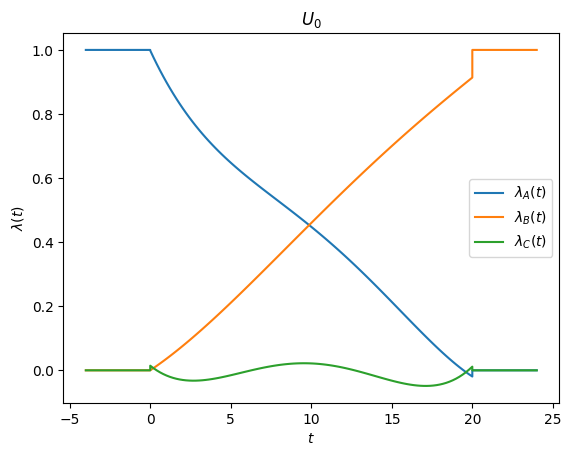

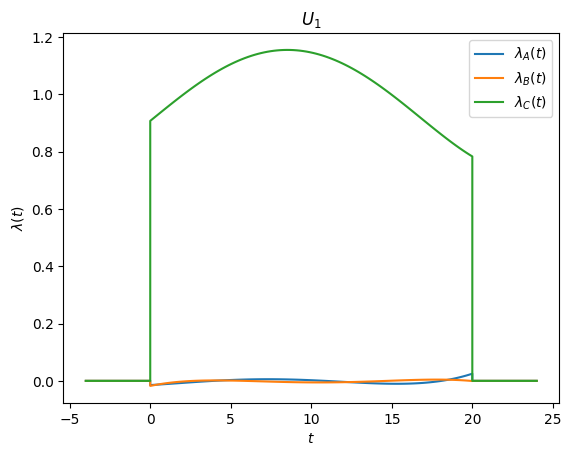

drawing new samples now -- parallelized with Pool
dF estimate 9.994820494895672 +/- 0.055452549329118576
var*n_s for all trajs: 2.33698877259473, and most recent 100: 0.4006872791506244


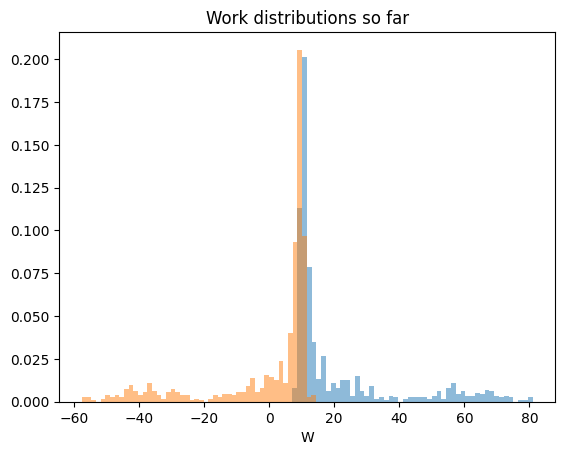

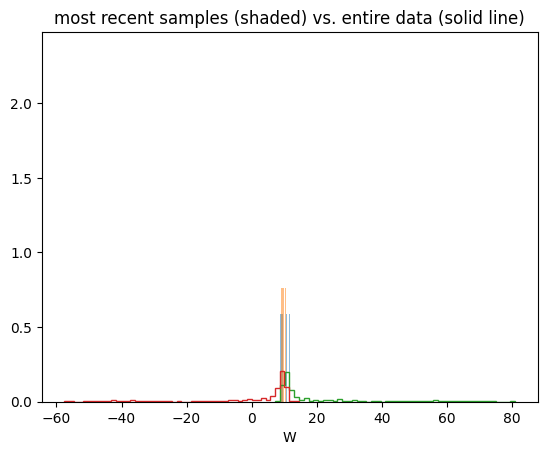

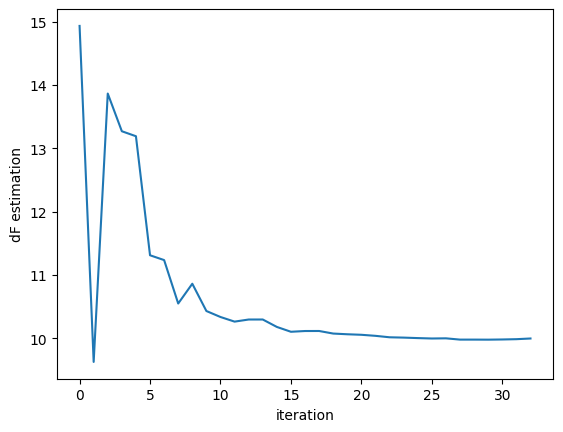

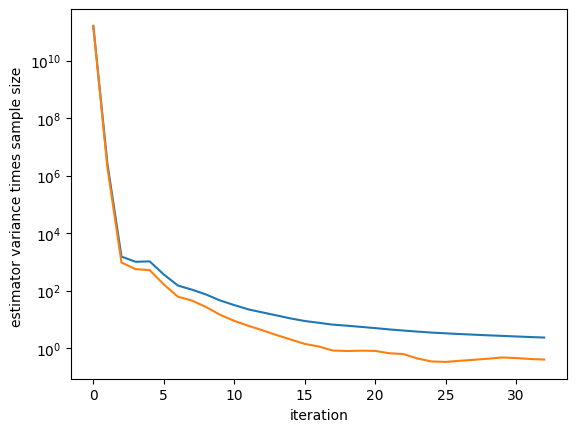

done with iteration no. 31

we have 760 F samples 760 R samples
starting protocol optimization
5 of 20 terminated with a single fn evaluation


Visualizing new protocol:


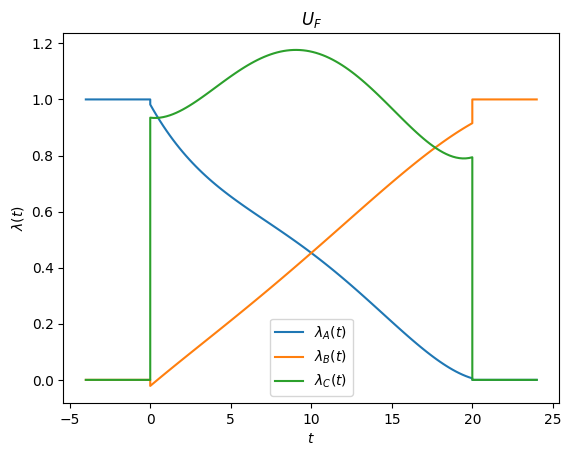

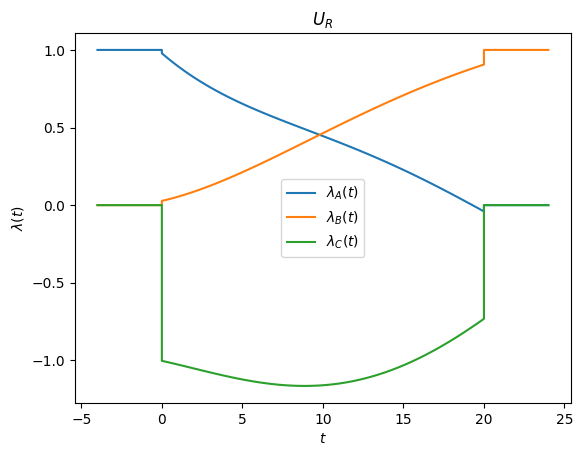

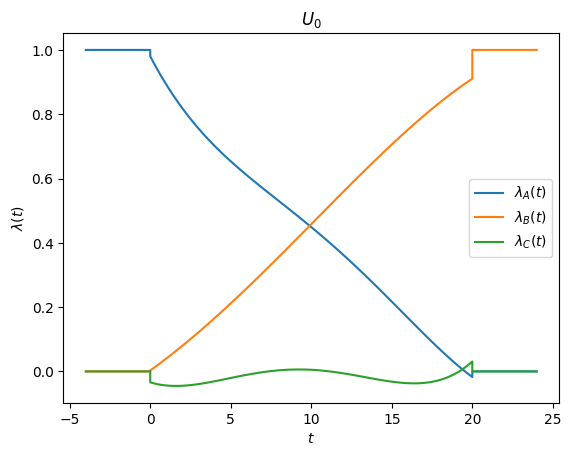

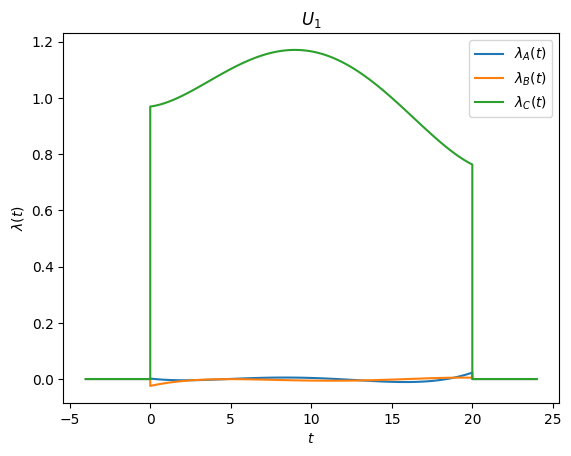

drawing new samples now -- parallelized with Pool
dF estimate 9.98223830461996 +/- 0.05380291470362254
var*n_s for all trajs: 2.2579078318721204, and most recent 100: 0.42173945930984513


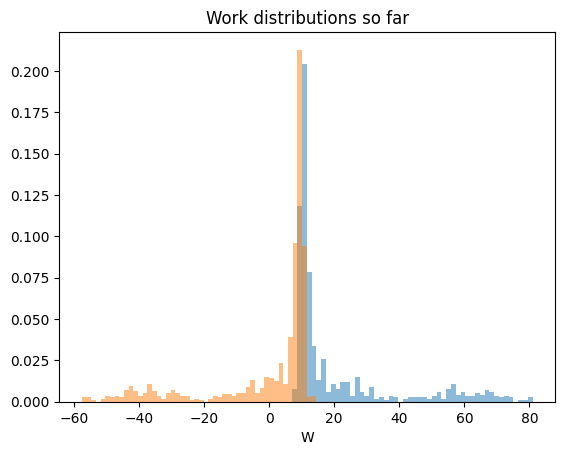

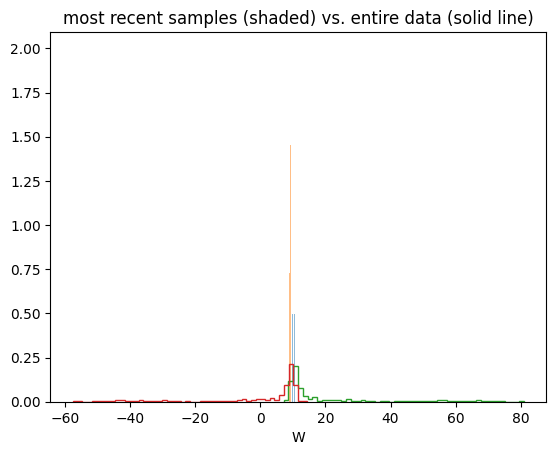

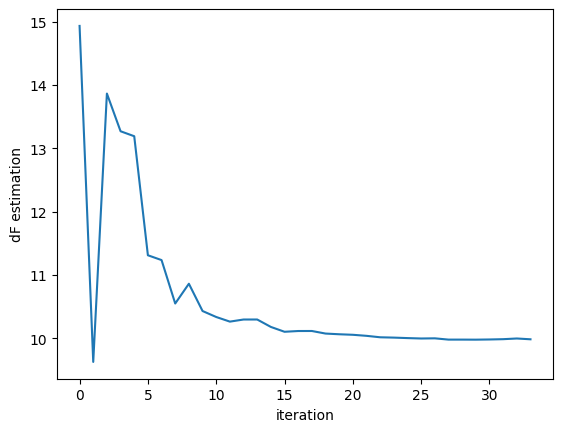

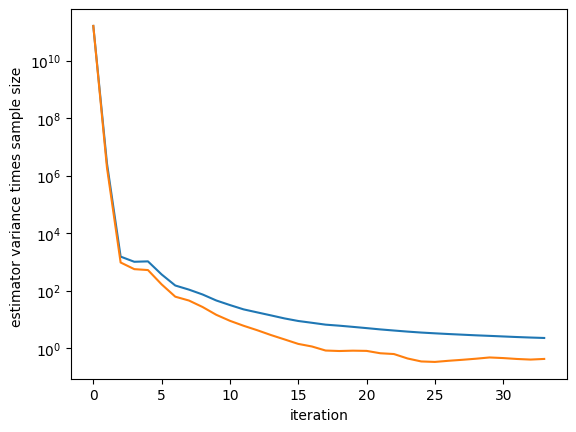

done with iteration no. 32

we have 780 F samples 780 R samples
starting protocol optimization
5 of 20 terminated with a single fn evaluation


Visualizing new protocol:


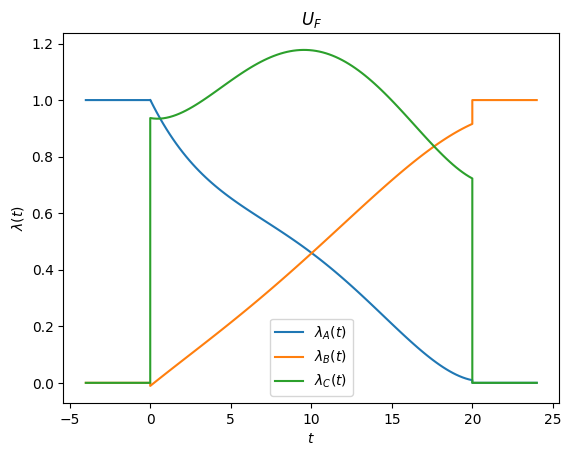

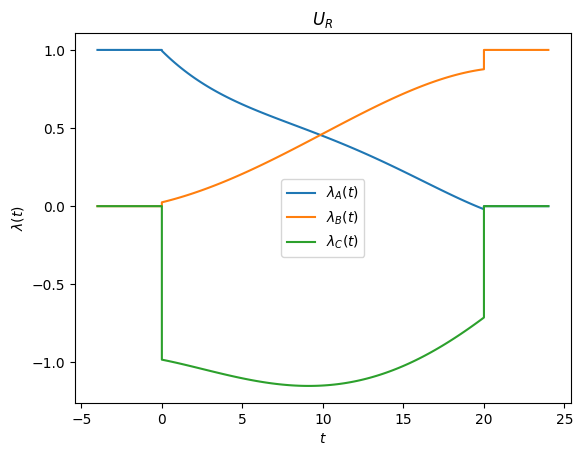

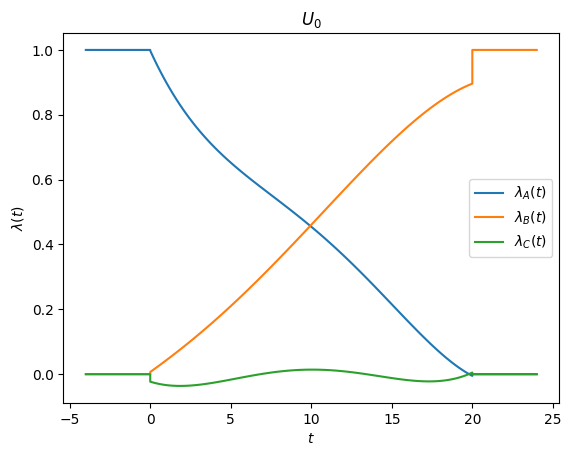

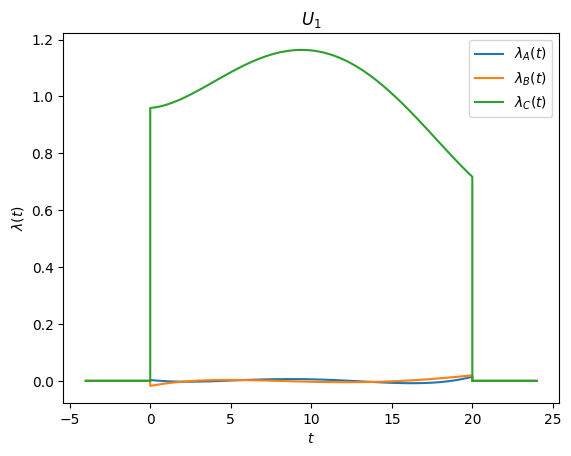

drawing new samples now -- parallelized with Pool
dF estimate 9.97582780826784 +/- 0.052000508400151885
var*n_s for all trajs: 2.1632422990994136, and most recent 100: 0.3626280797409932


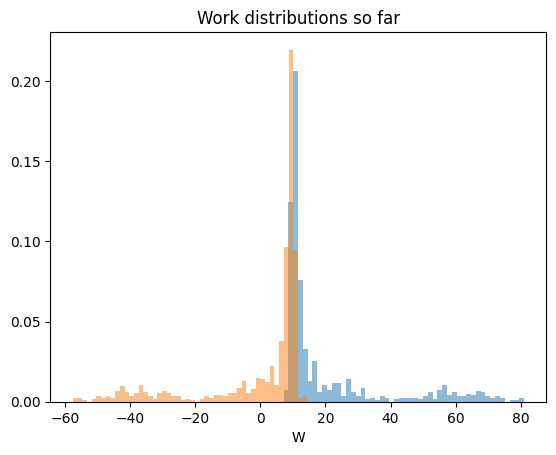

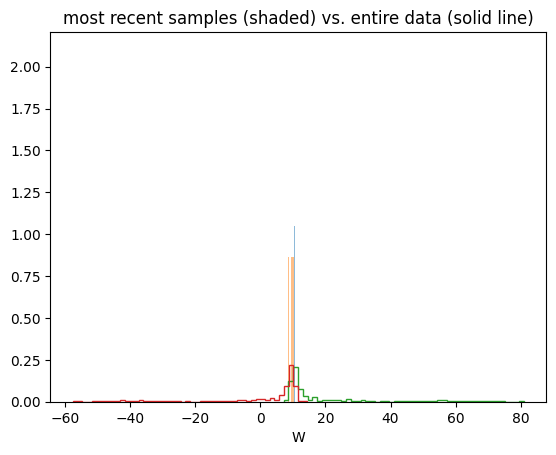

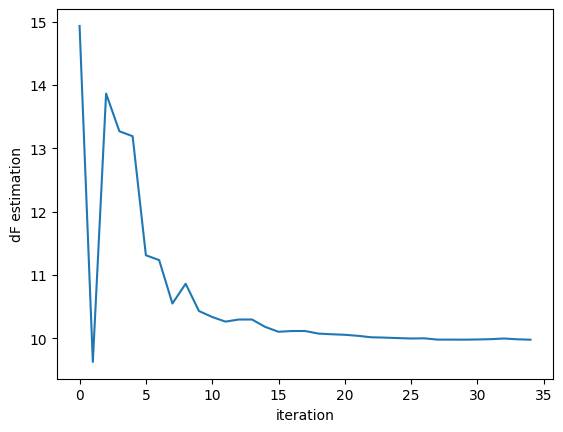

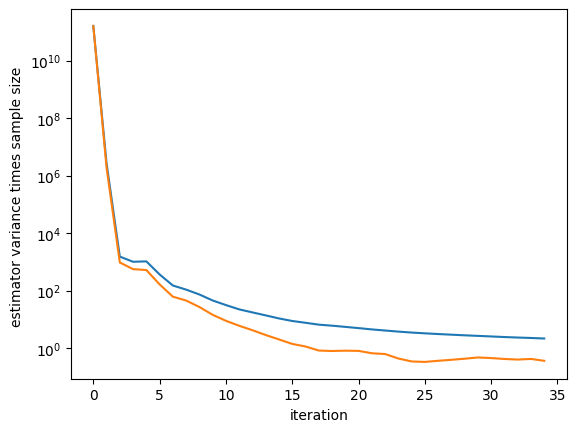

done with iteration no. 33

we have 800 F samples 800 R samples
starting protocol optimization
6 of 20 terminated with a single fn evaluation


Visualizing new protocol:


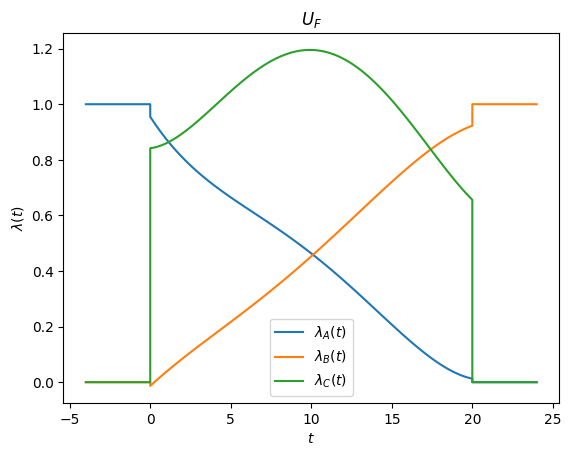

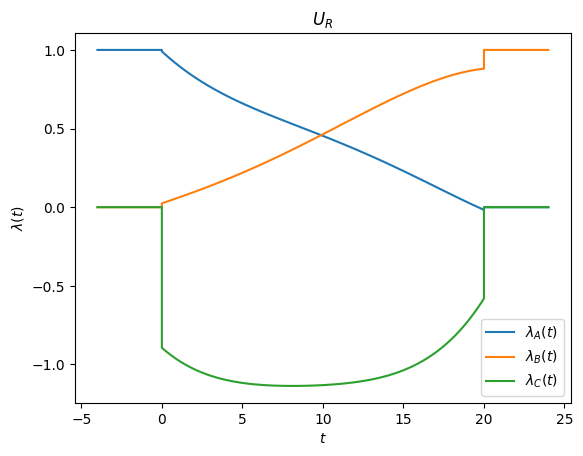

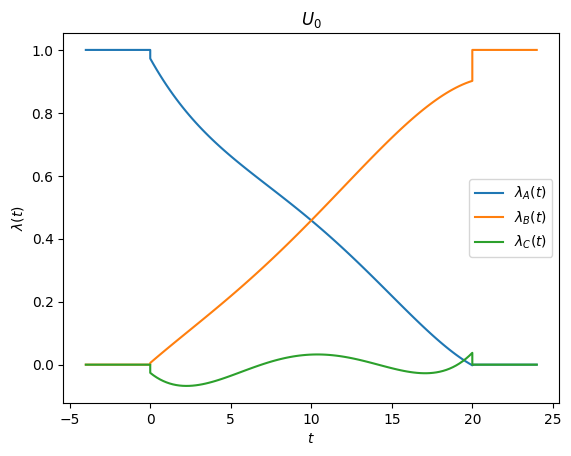

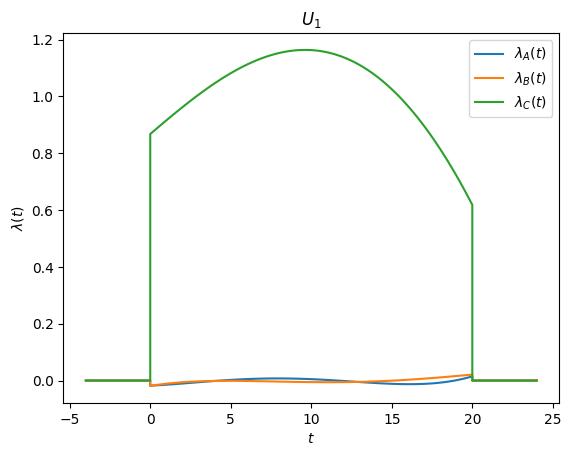

drawing new samples now -- parallelized with Pool
dF estimate 9.9685363044303 +/- 0.05053977687893795
var*n_s for all trajs: 2.0945006185177215, and most recent 100: 0.38228114433026367


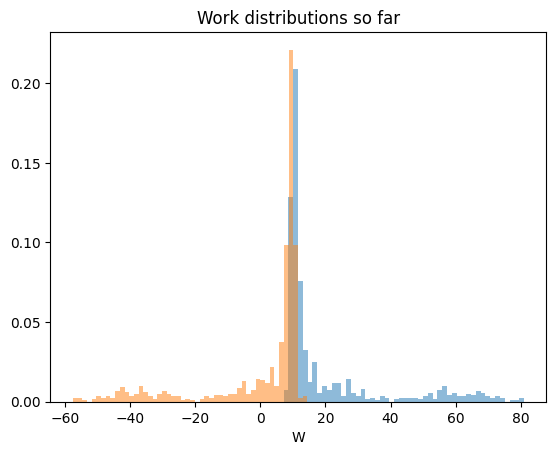

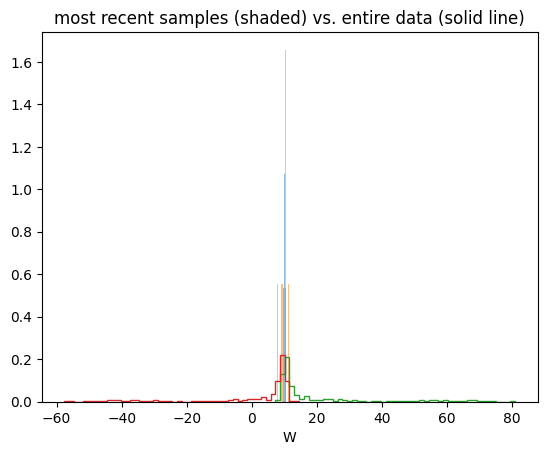

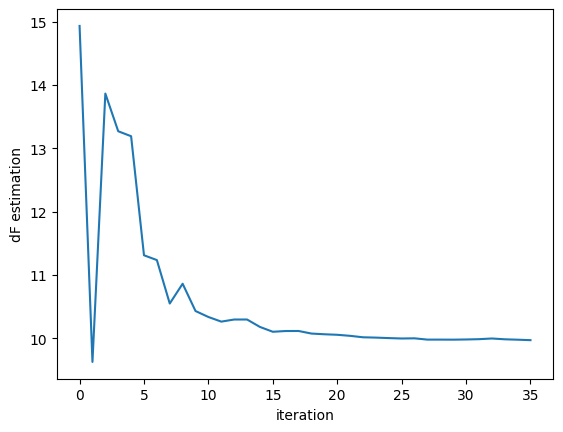

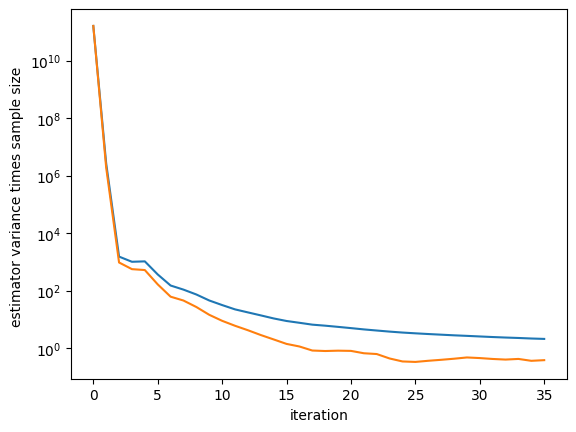

done with iteration no. 34

we have 820 F samples 820 R samples
starting protocol optimization
2 of 20 terminated with a single fn evaluation


Visualizing new protocol:


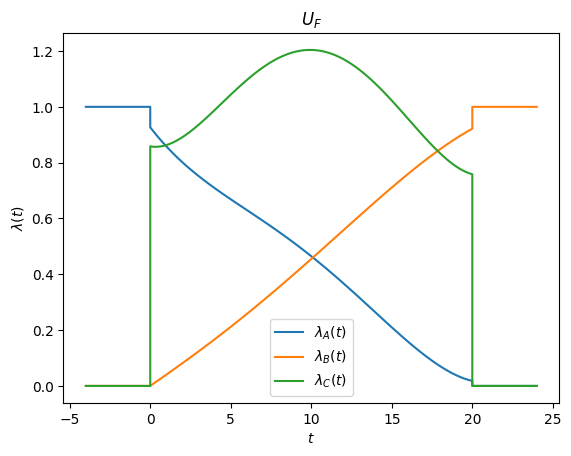

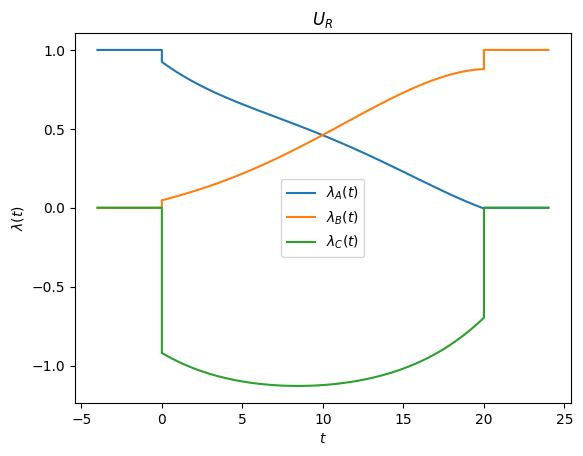

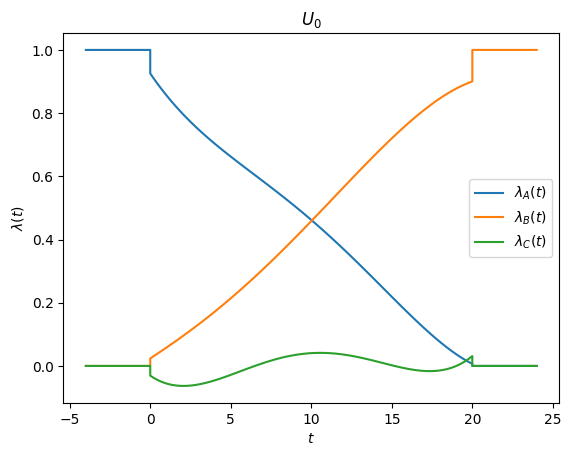

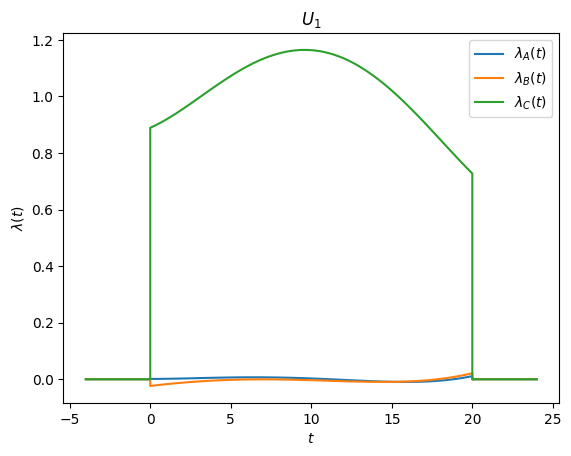

drawing new samples now -- parallelized with Pool
dF estimate 9.96818048267979 +/- 0.04918069476735202
var*n_s for all trajs: 2.031742219751535, and most recent 100: 0.4144424733260491


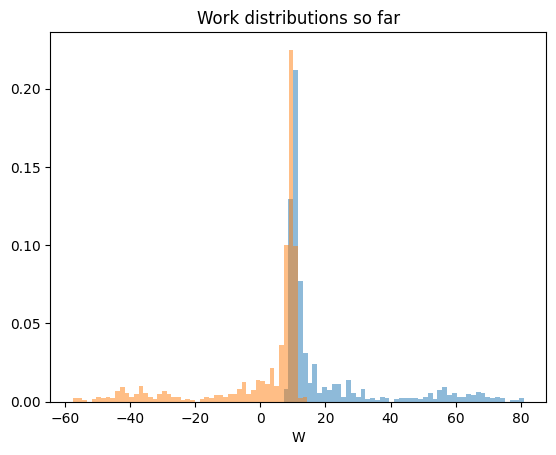

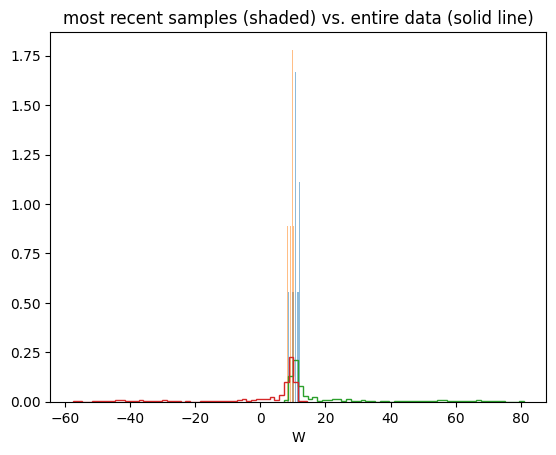

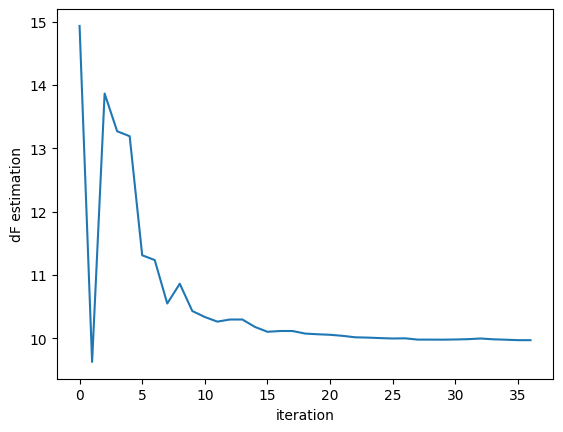

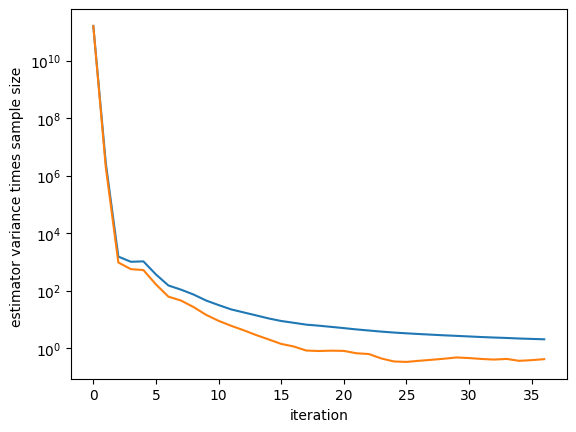

done with iteration no. 35

we have 840 F samples 840 R samples
starting protocol optimization
4 of 20 terminated with a single fn evaluation


Visualizing new protocol:


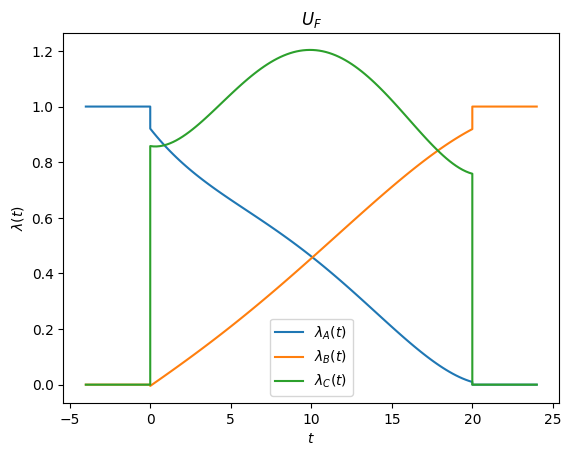

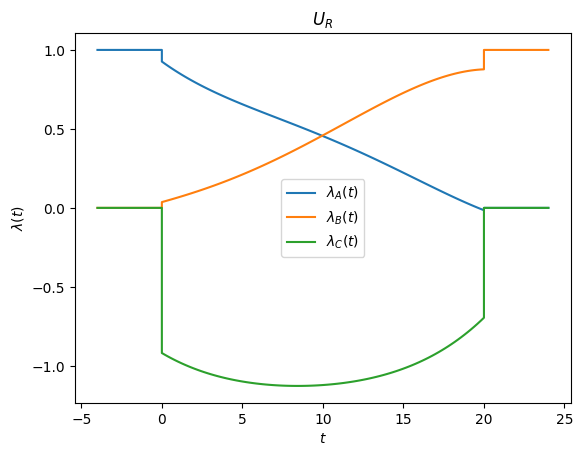

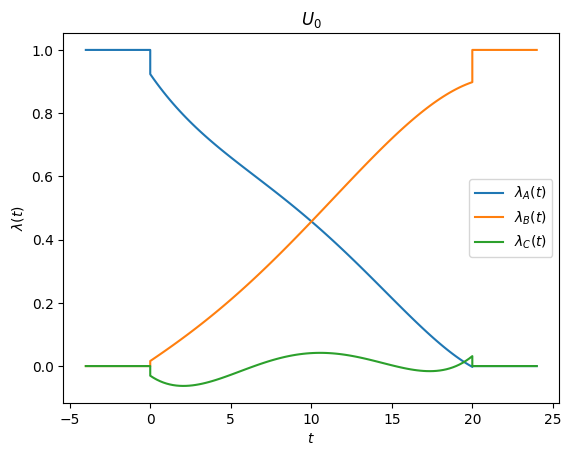

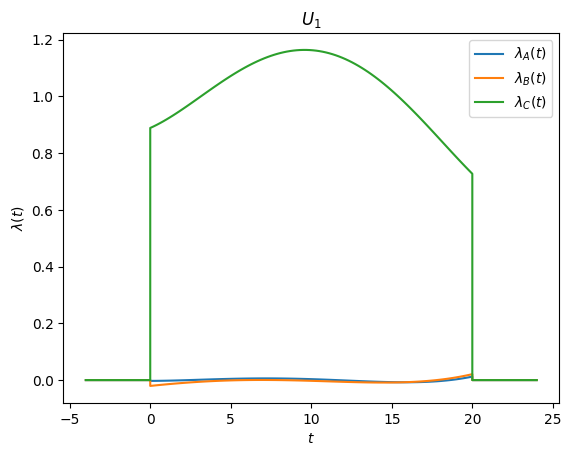

drawing new samples now -- parallelized with Pool
dF estimate 9.966567868754181 +/- 0.0478342465767749
var*n_s for all trajs: 1.9677790251882232, and most recent 100: 0.40933379356475724


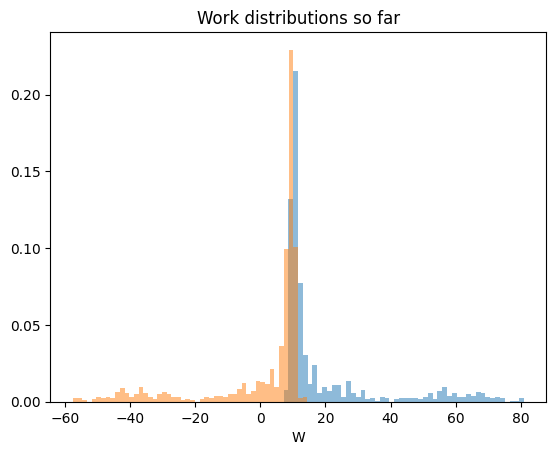

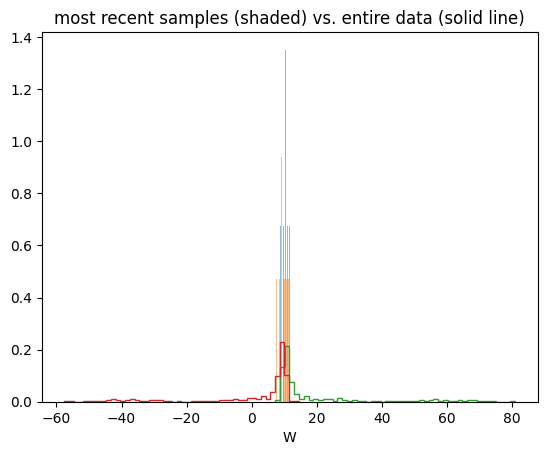

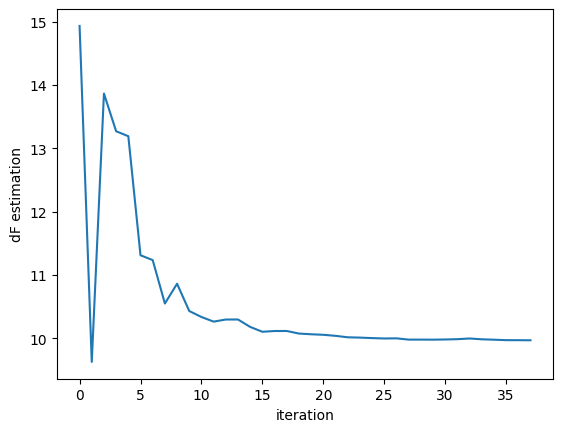

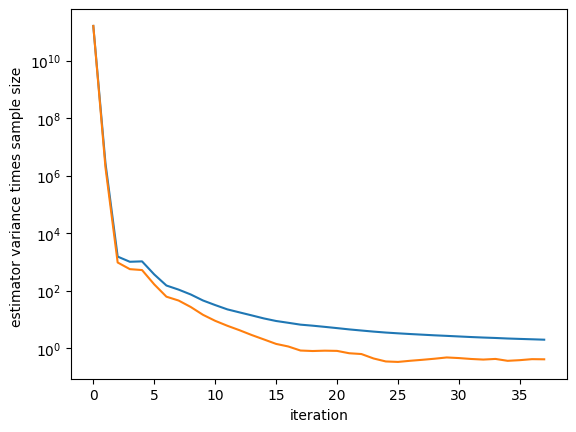

done with iteration no. 36

we have 860 F samples 860 R samples
starting protocol optimization
7 of 20 terminated with a single fn evaluation


Visualizing new protocol:


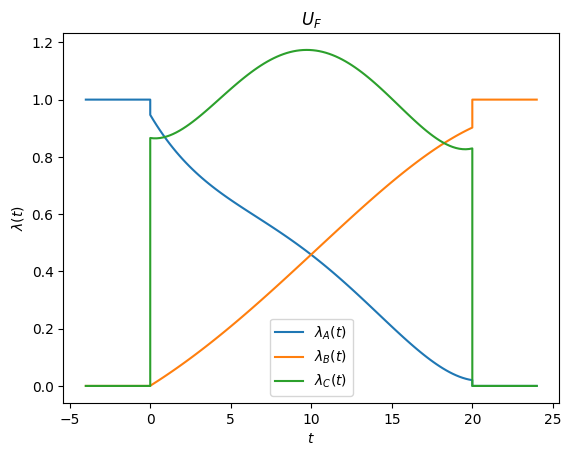

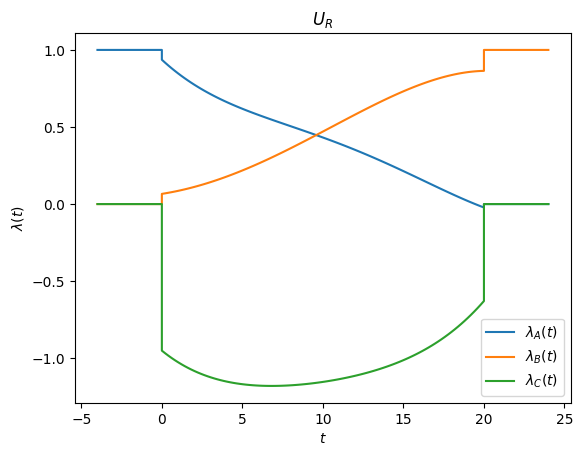

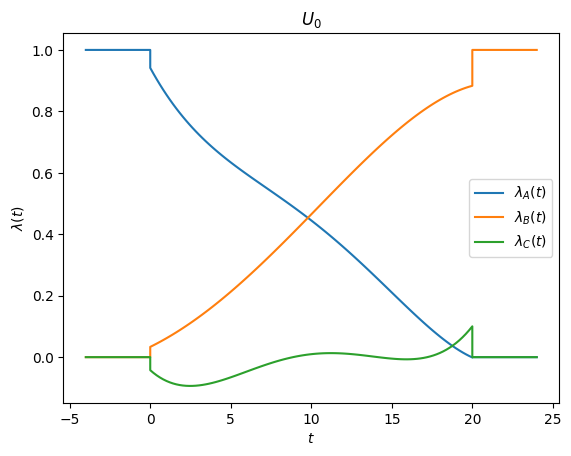

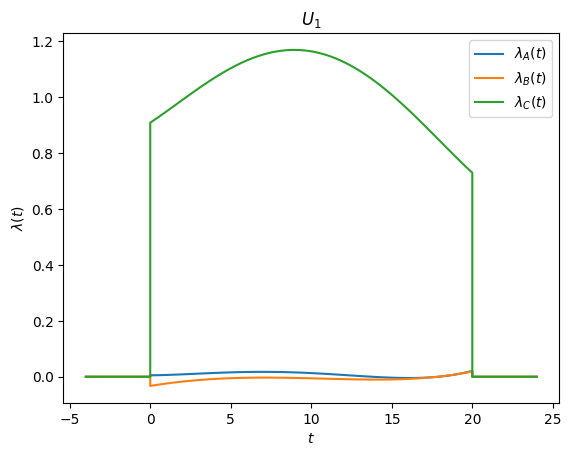

drawing new samples now -- parallelized with Pool
dF estimate 9.962031838957305 +/- 0.046848287846337947
var*n_s for all trajs: 1.9313906252373356, and most recent 100: 0.4606224446214724


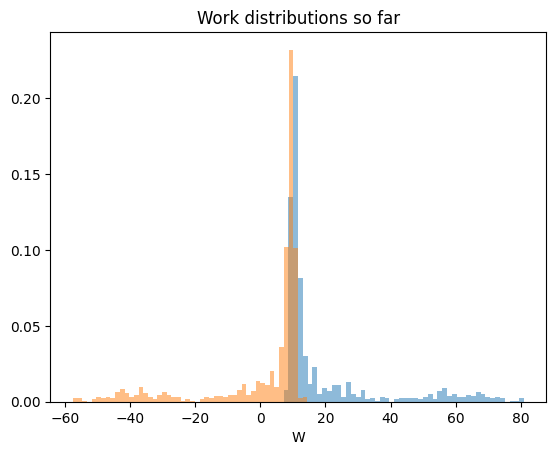

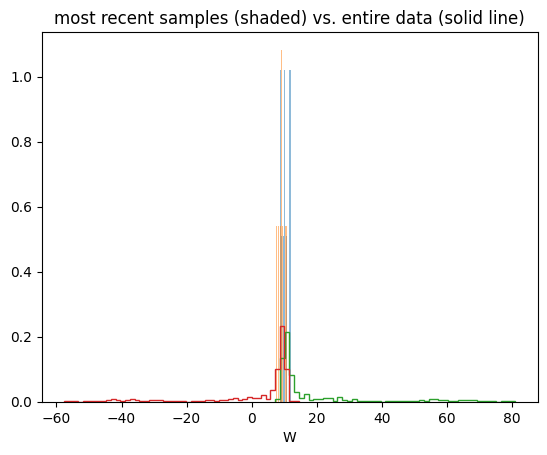

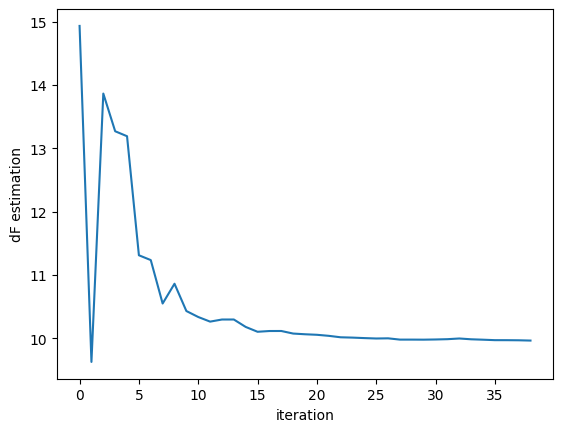

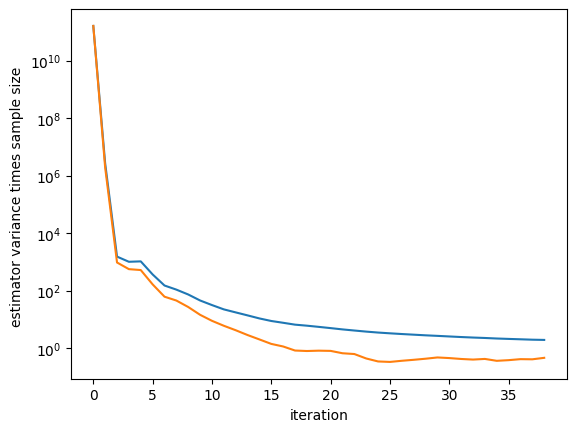

done with iteration no. 37

we have 880 F samples 880 R samples
starting protocol optimization
2 of 20 terminated with a single fn evaluation


Visualizing new protocol:


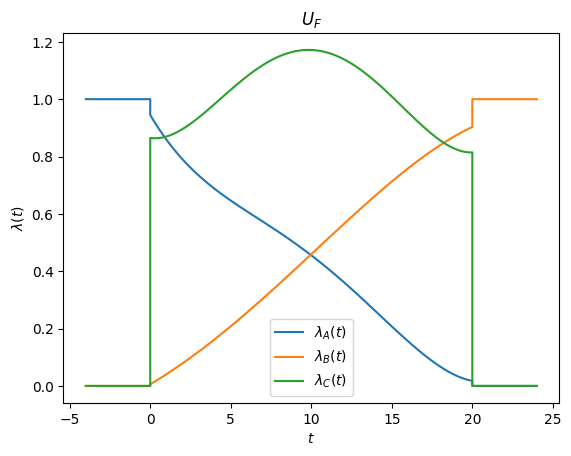

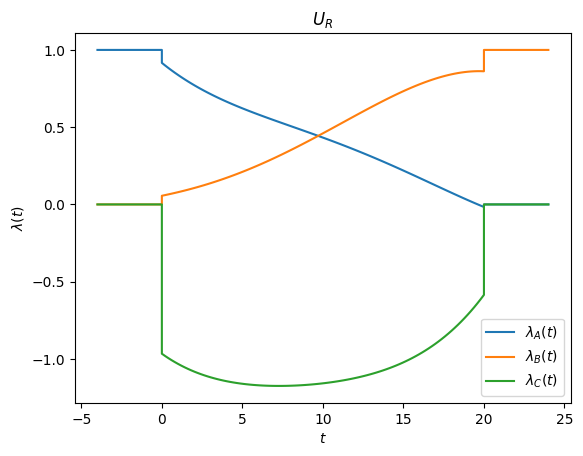

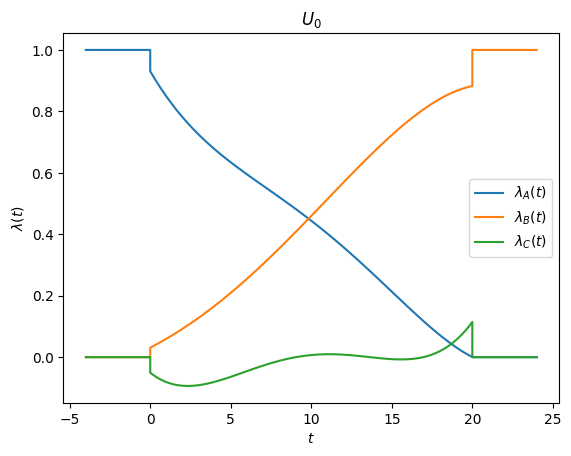

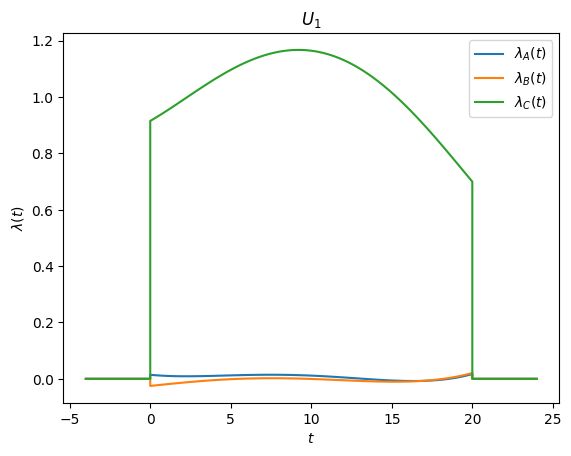

drawing new samples now -- parallelized with Pool
dF estimate 9.95184254135018 +/- 0.045787100061594144
var*n_s for all trajs: 1.886812678845391, and most recent 100: 0.539423189502914


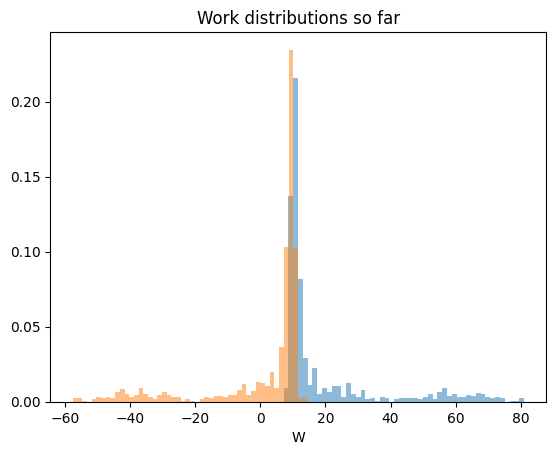

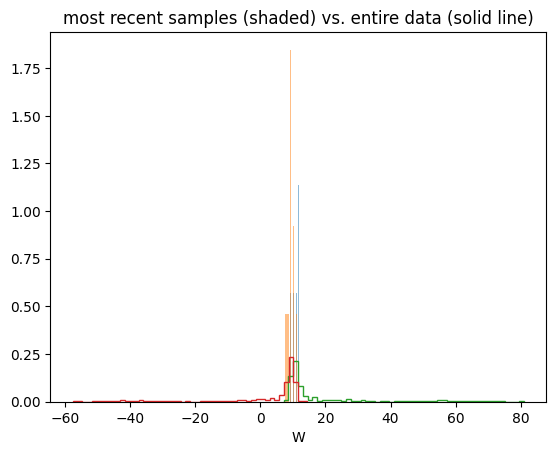

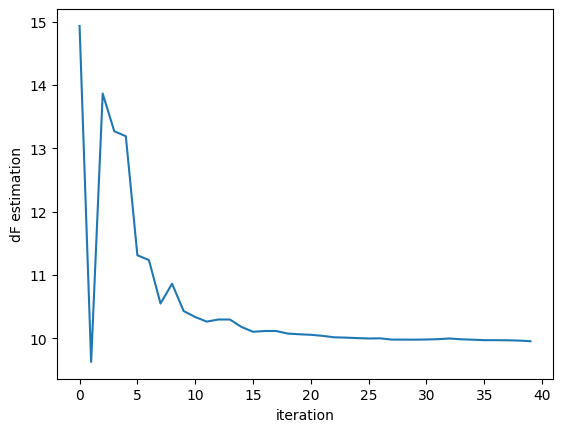

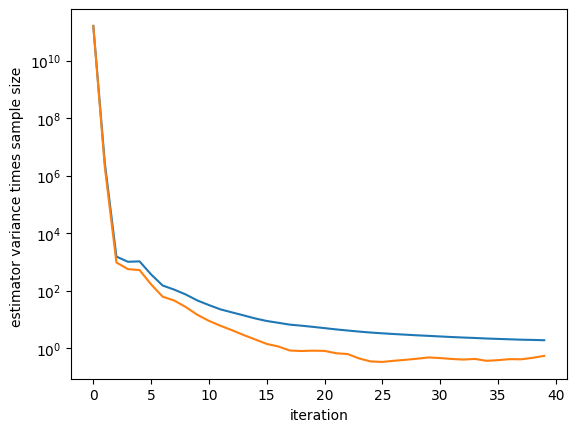

done with iteration no. 38

we have 900 F samples 900 R samples
starting protocol optimization
2 of 20 terminated with a single fn evaluation


Visualizing new protocol:


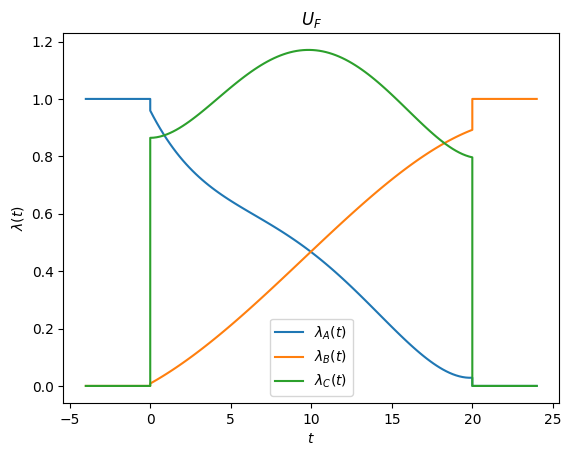

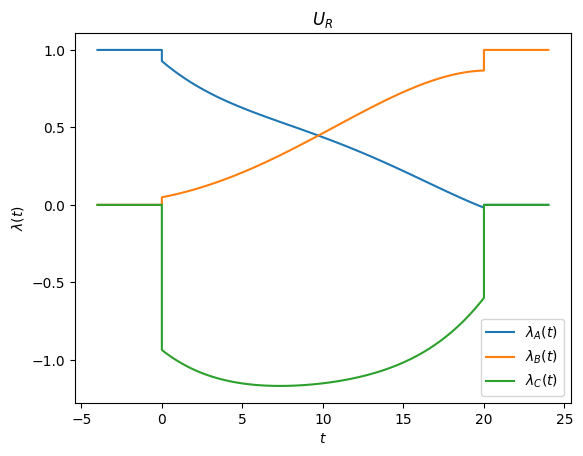

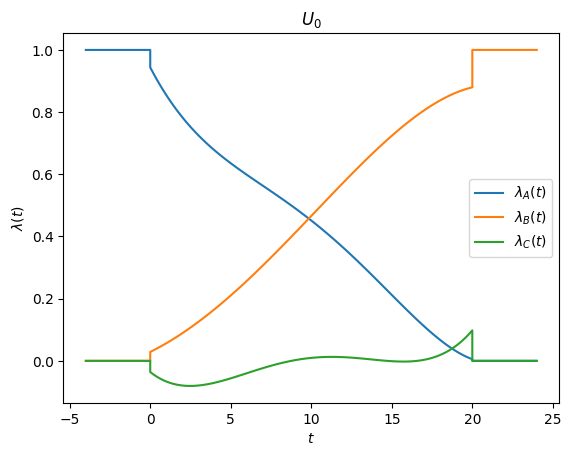

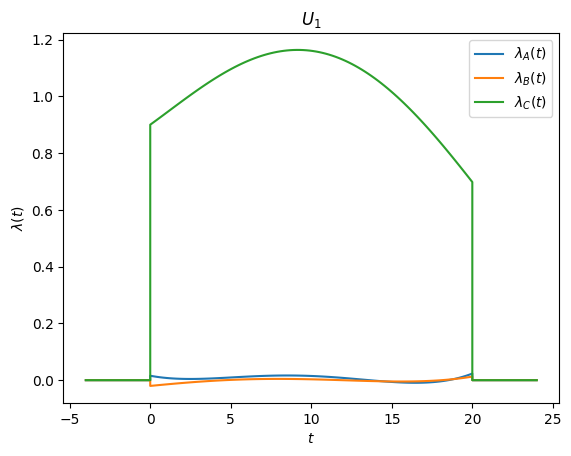

drawing new samples now -- parallelized with Pool
dF estimate 9.948179788771519 +/- 0.04475863784303505
var*n_s for all trajs: 1.8430688086388516, and most recent 100: 0.5570702850325789


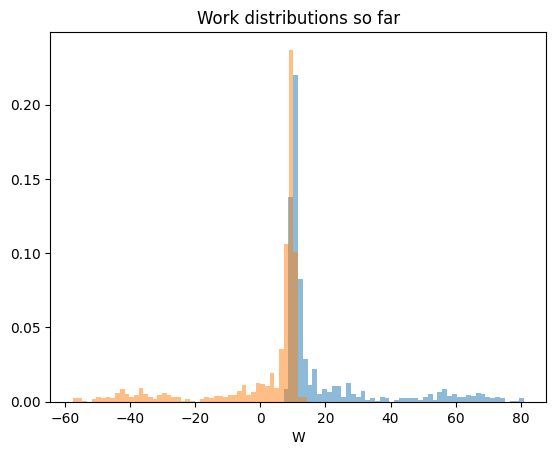

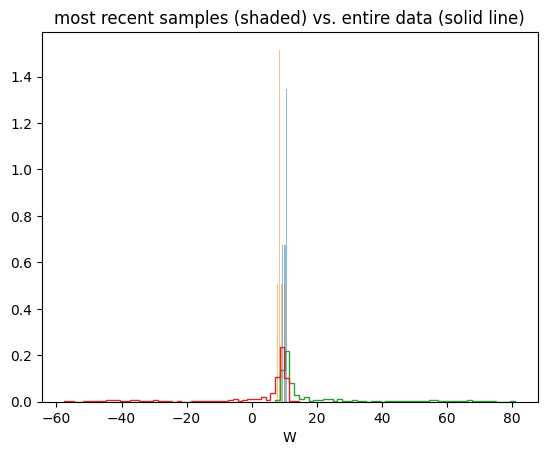

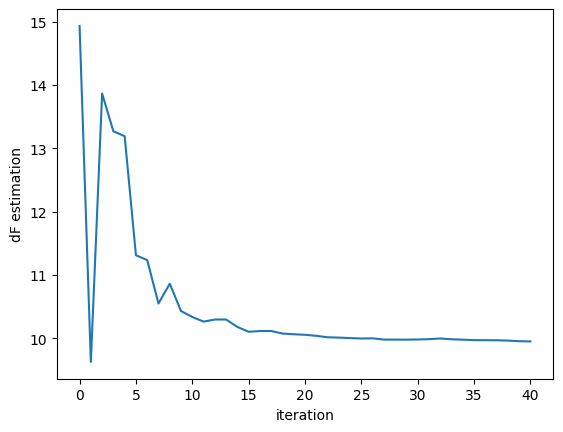

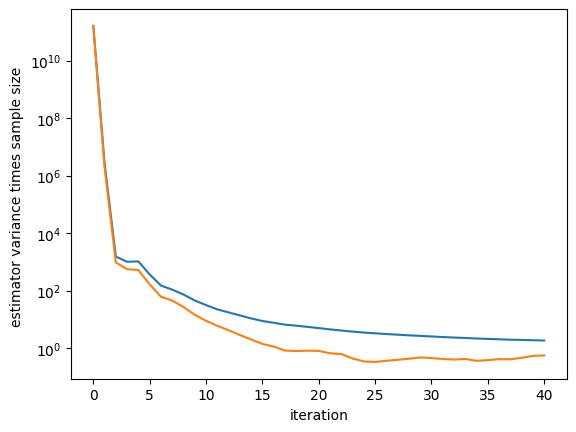

done with iteration no. 39

we have 920 F samples 920 R samples
starting protocol optimization
3 of 20 terminated with a single fn evaluation


Visualizing new protocol:


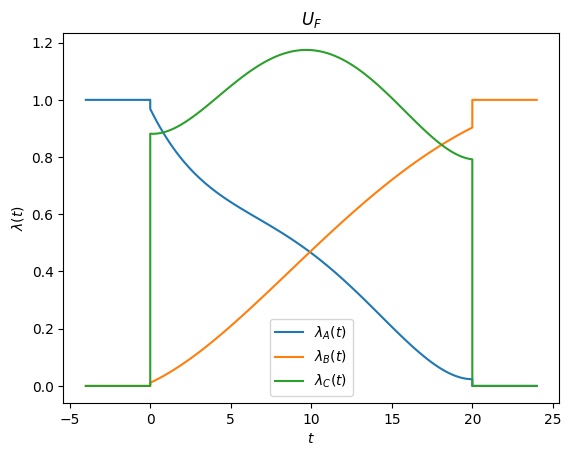

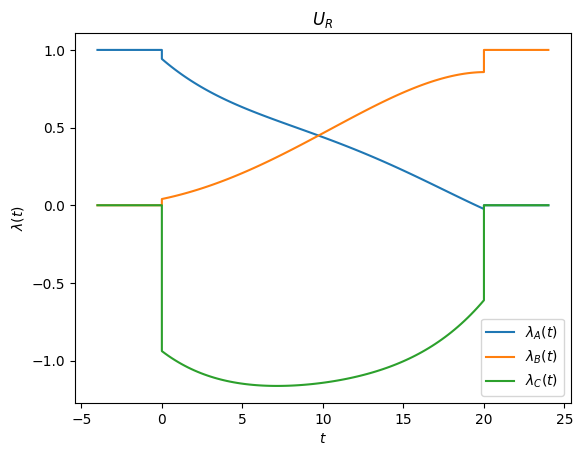

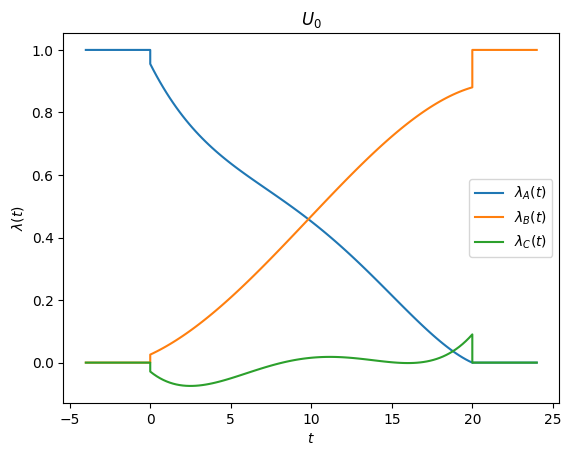

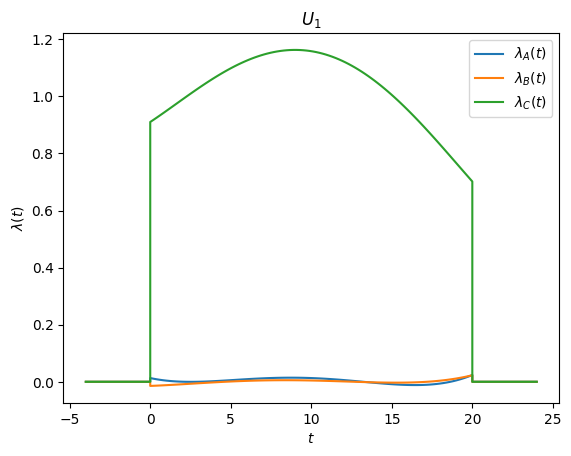

drawing new samples now -- parallelized with Pool
dF estimate 9.949226849298844 +/- 0.043697563816619
var*n_s for all trajs: 1.7949084584970407, and most recent 100: 0.542170104670692


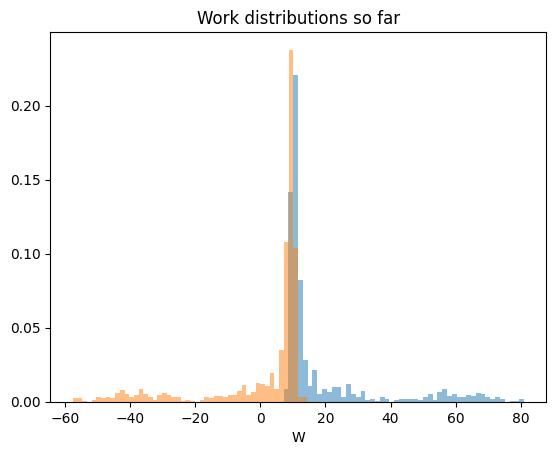

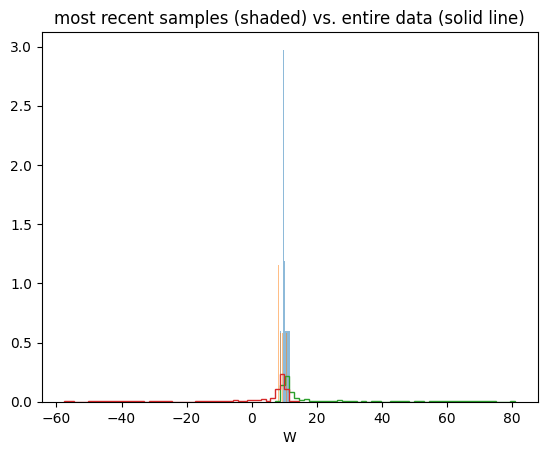

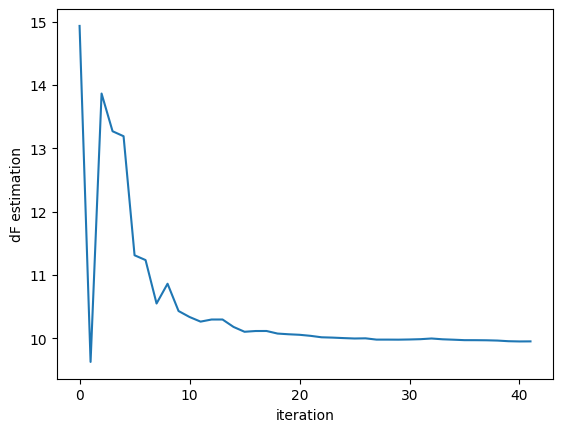

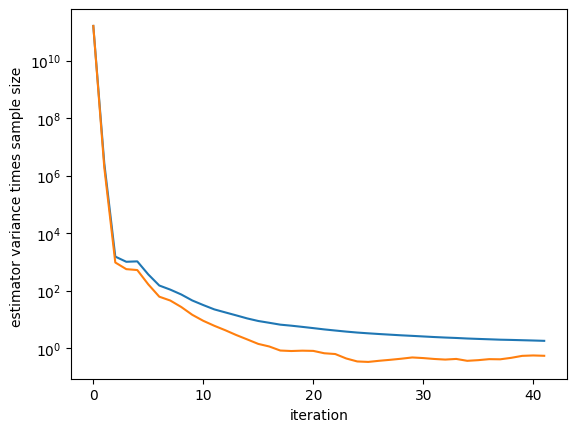

done with iteration no. 40

we have 940 F samples 940 R samples
starting protocol optimization
6 of 20 terminated with a single fn evaluation


Visualizing new protocol:


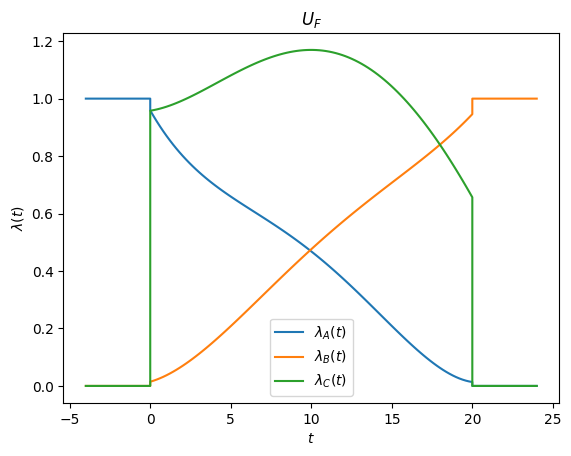

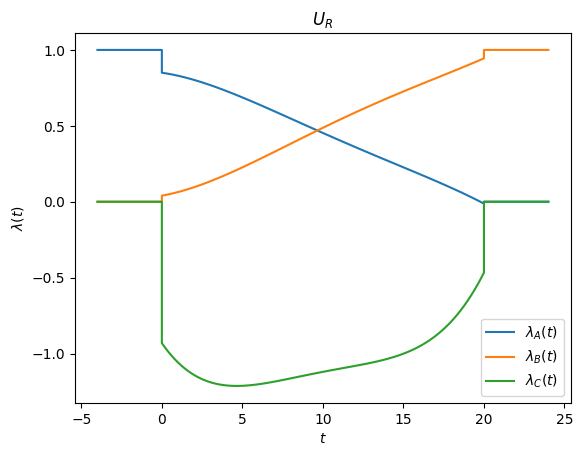

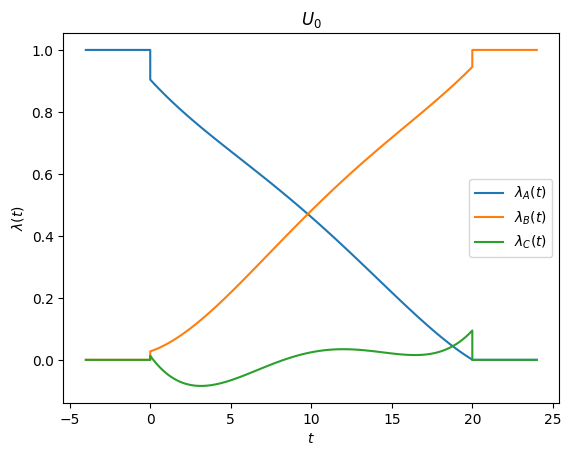

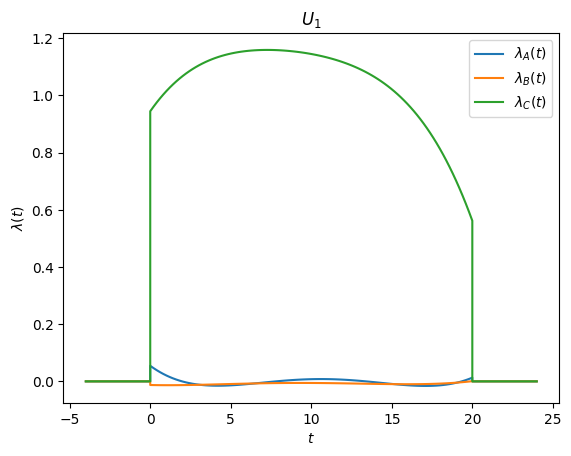

drawing new samples now -- parallelized with Pool
dF estimate 9.944237506371866 +/- 0.042909819660902335
var*n_s for all trajs: 1.767602518397914, and most recent 100: 0.6286169572197235


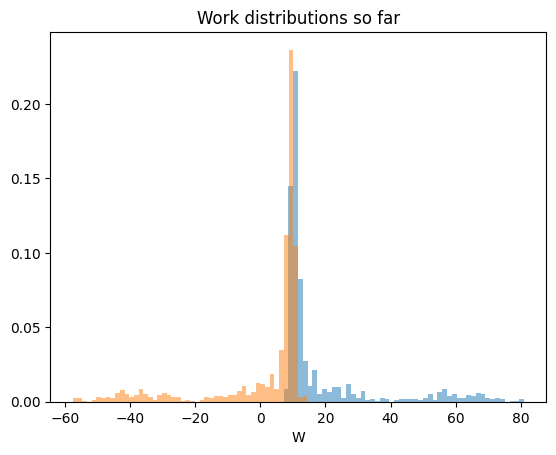

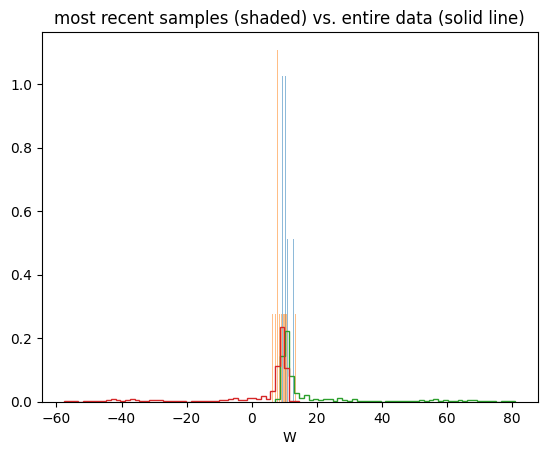

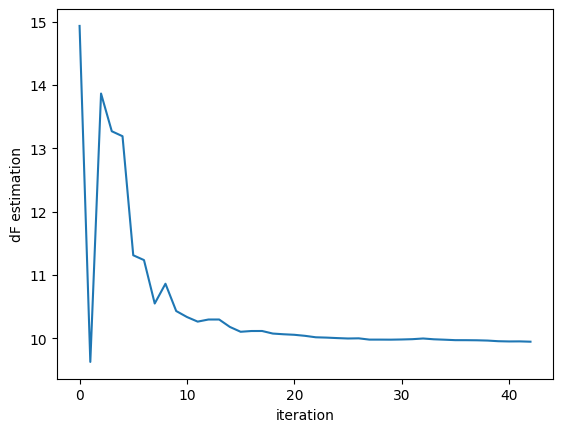

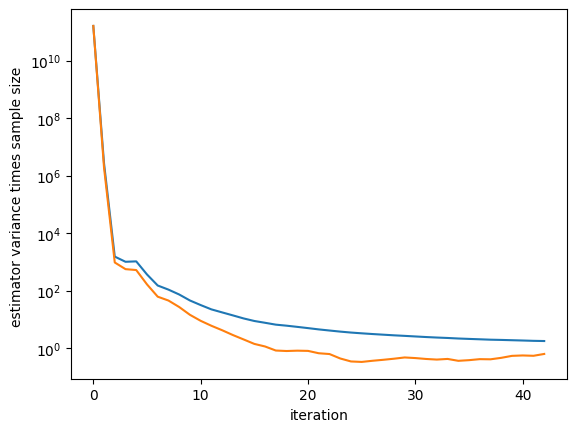

done with iteration no. 41

we have 960 F samples 960 R samples
starting protocol optimization
1 of 20 terminated with a single fn evaluation


Visualizing new protocol:


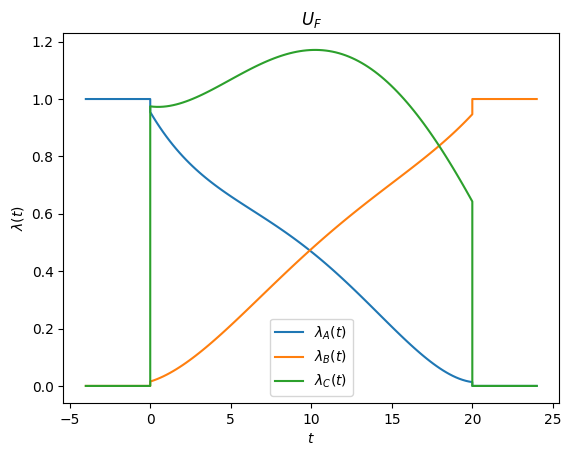

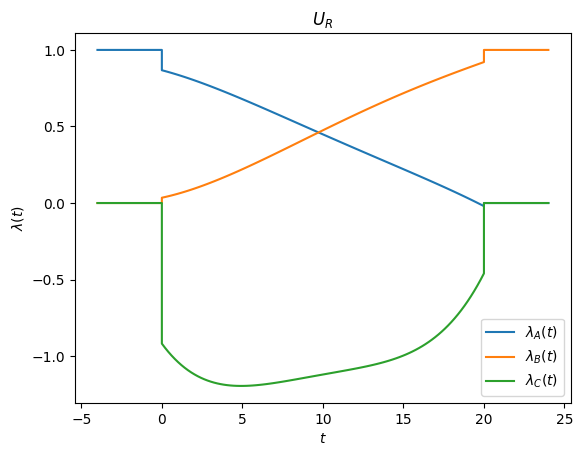

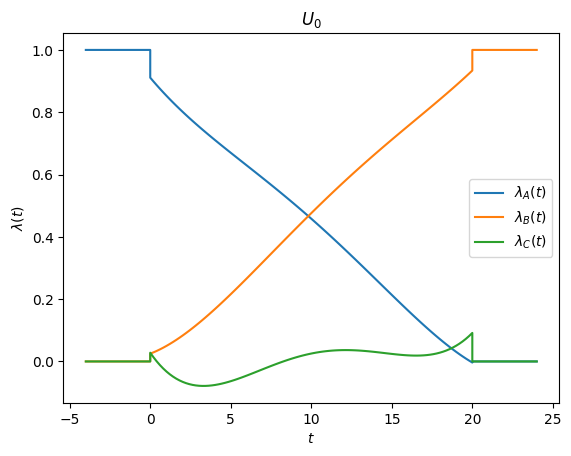

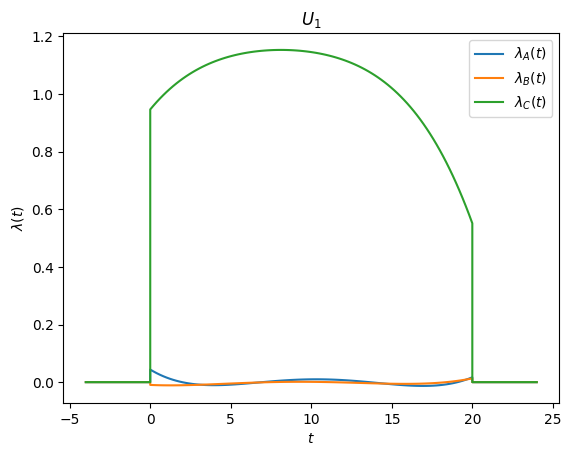

drawing new samples now -- parallelized with Pool
dF estimate 9.940506661985614 +/- 0.04188831898436247
var*n_s for all trajs: 1.7195386419889873, and most recent 100: 0.5243571678053855


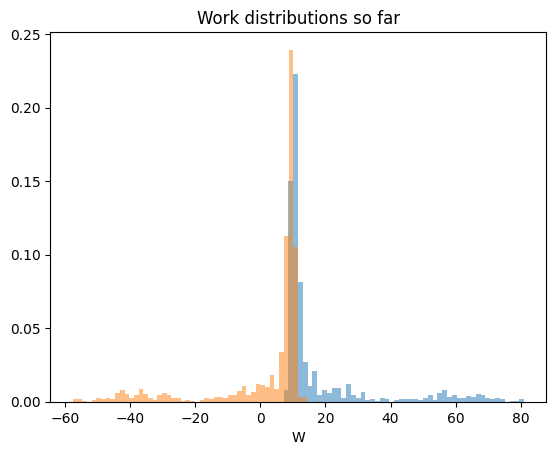

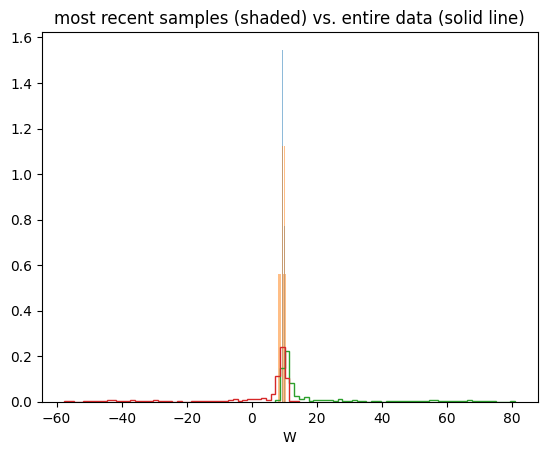

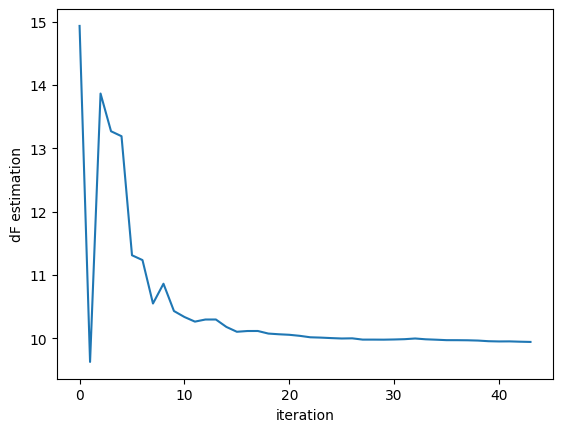

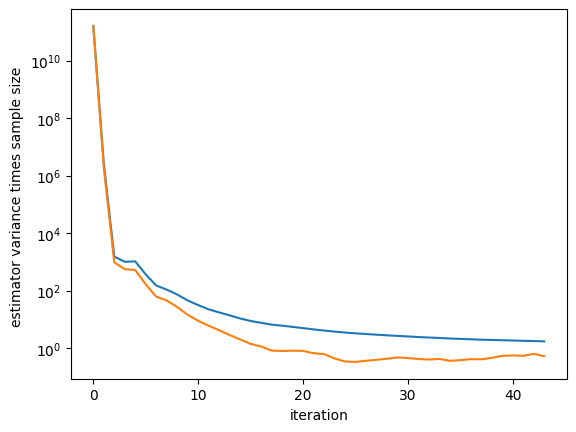

done with iteration no. 42

we have 980 F samples 980 R samples
starting protocol optimization
2 of 20 terminated with a single fn evaluation


Visualizing new protocol:


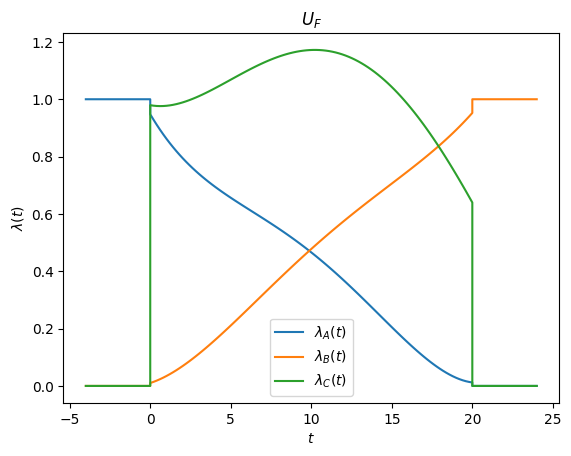

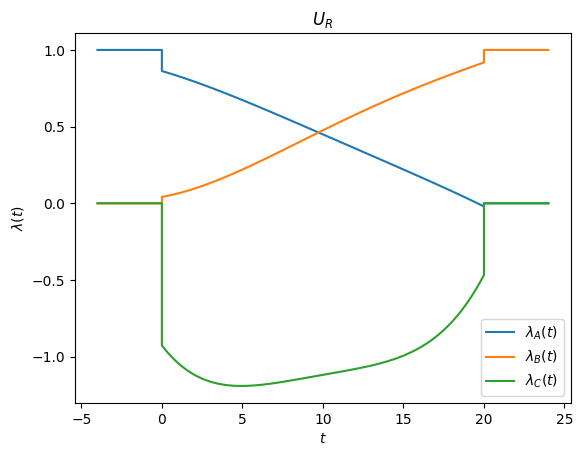

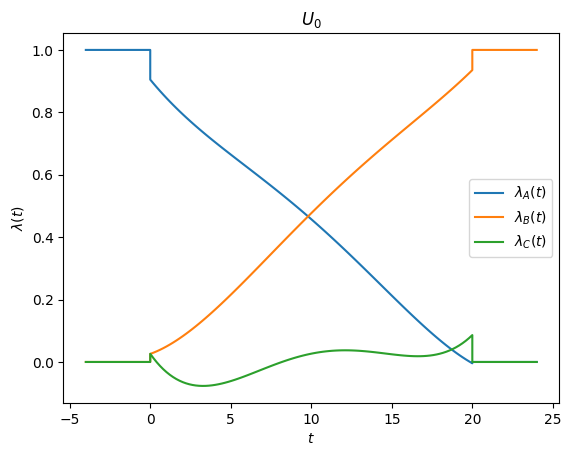

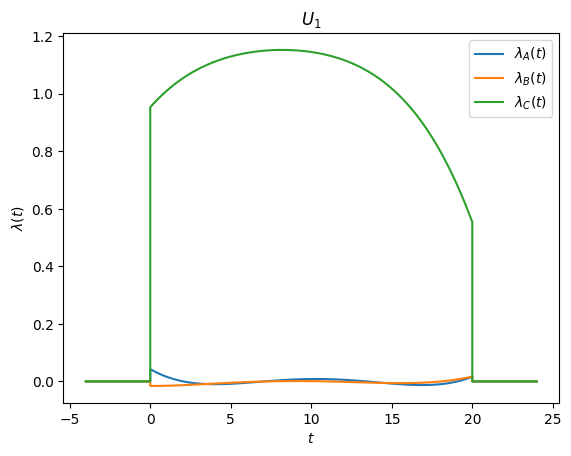

drawing new samples now -- parallelized with Pool
dF estimate 9.938095431853789 +/- 0.04098781219243728
var*n_s for all trajs: 1.6800007483225103, and most recent 100: 0.48938584964322157


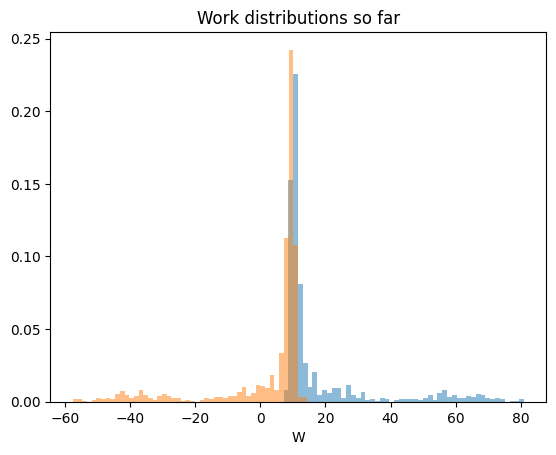

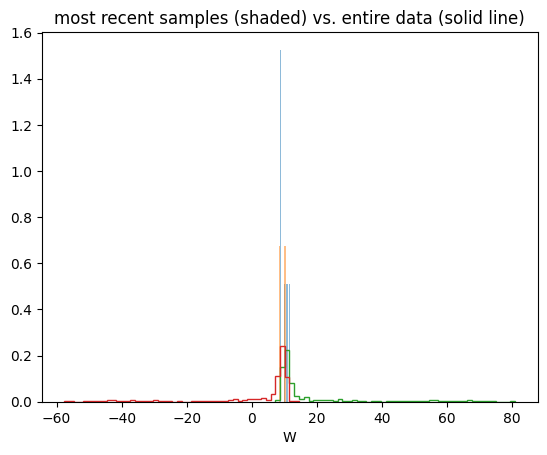

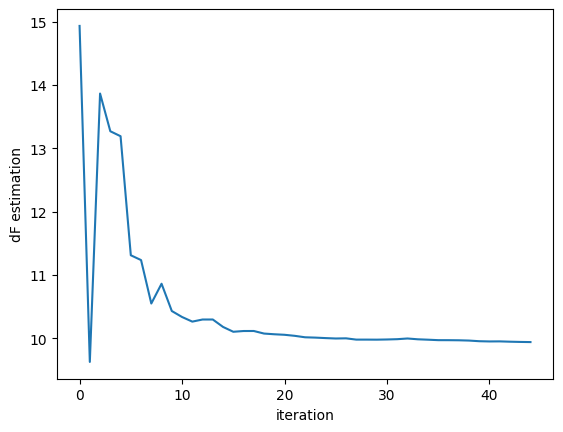

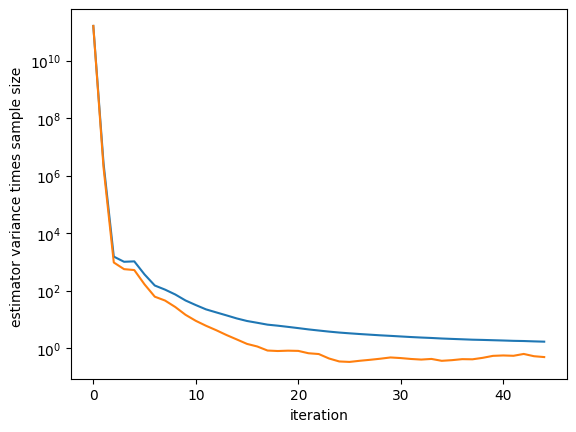

done with iteration no. 43

we have 1000 F samples 1000 R samples
starting protocol optimization
5 of 20 terminated with a single fn evaluation


Visualizing new protocol:


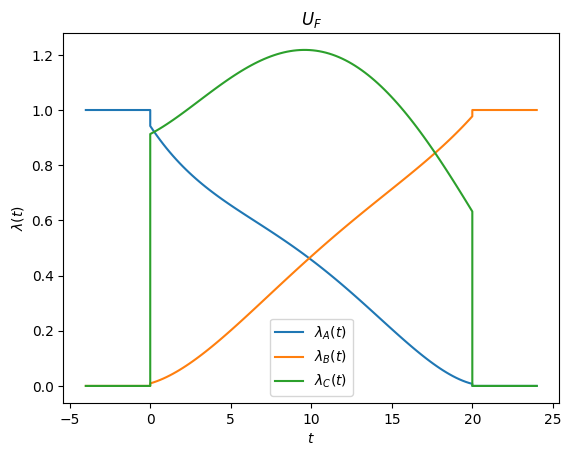

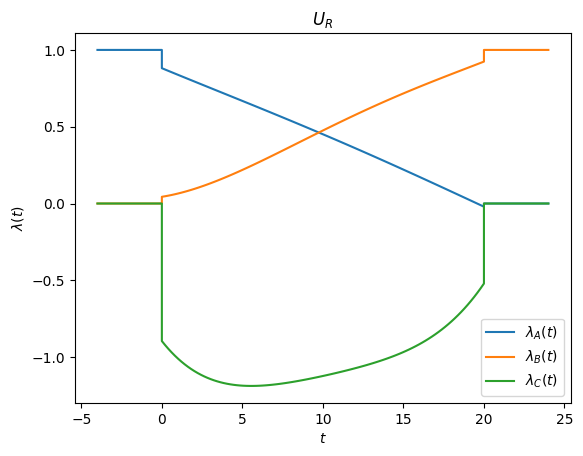

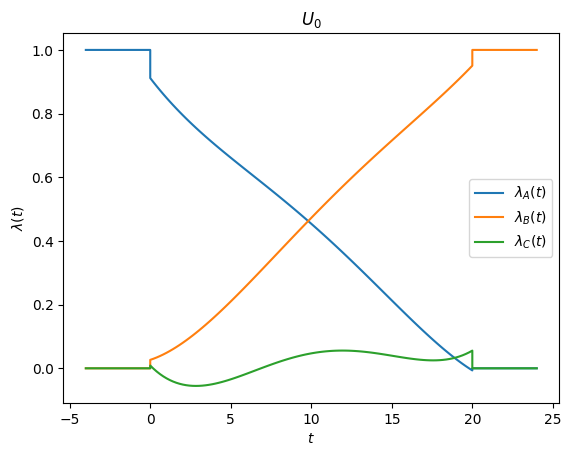

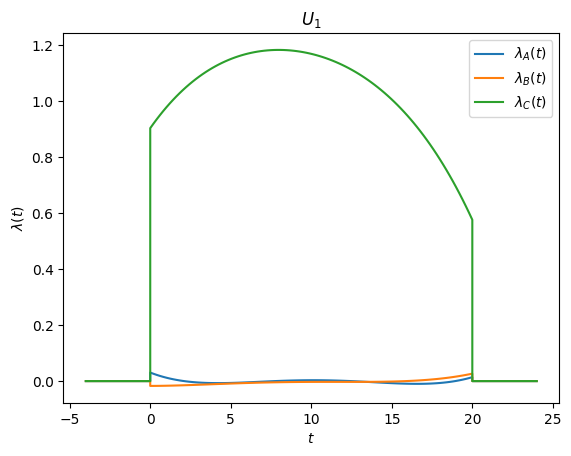

drawing new samples now -- parallelized with Pool
dF estimate 9.93287788679114 +/- 0.04013264607891349
var*n_s for all trajs: 1.6428418669212366, and most recent 100: 0.4636327867620343


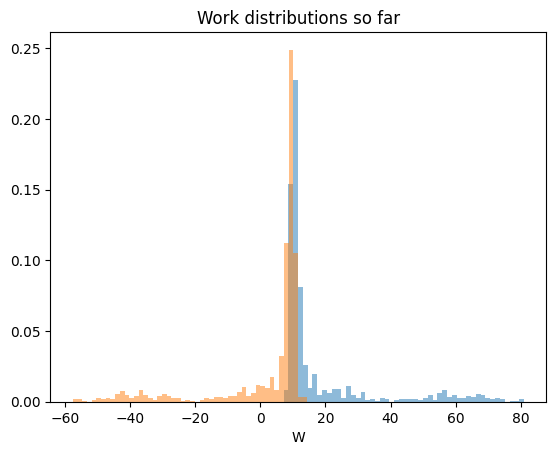

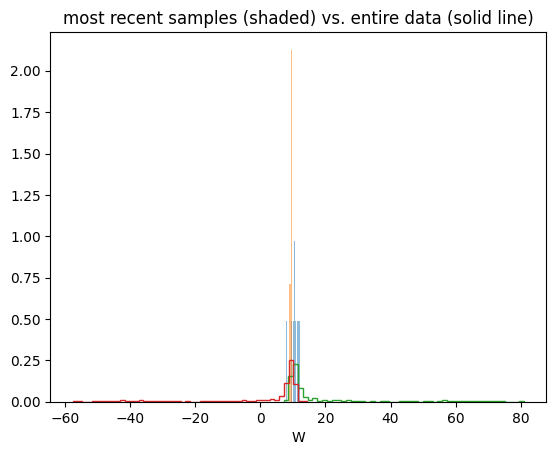

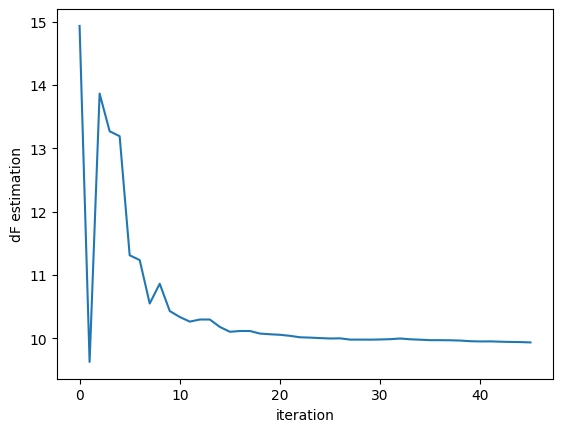

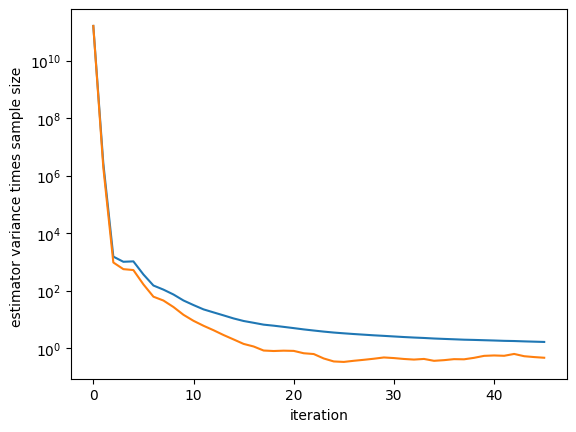

done with iteration no. 44



In [11]:
n_samples_per_iter    = 20   # number of new samples drawn per iteration 

n_minibatch           = 80   # minibatch size used for updating (100 seems to be good value)
n_minibatch_iters     = 20   # number of minibatch iterations before averaging (around 50 is good value)
                             # in practice, this can be arbitrarily big; can be all run in parallel

n_total_samples       = 1000 # number of total samples to draw before stopping
    
constraint_fraction   = 0.3  # how strong of a constraint to impose, from 0 to 1 (0.3 is good value)



n_curr = 100                 # (for diagnostics) how many samples back to track performance history

wrapper_factor = 1e-8        # a hack (to be debugged) to multiplicatively scale the objective function 
                             # so that gradient isn't too small / big. otherwise, only a single fn 
                             # eval is done using the black-box optimization 


while len(samples_F_total) <= n_total_samples:
    # save at the start of each iteration
    print("we have", len(samples_F_total), "F samples", len(samples_R_total), "R samples")    
    print("starting protocol optimization")
    
    # so what we do here: 
    # with our existing samples, we construct multiple minibatches of size n_minibatch 
    #   (a total of n_minibatch_iters of them)
    # we run our optimization for each of these multiple minibatches
    # this step may be parallelized (with n_minibatch_iters different cores)
    

    theta_candidates = [] 
    
    optimize_args = []
    for l in range(n_minibatch_iters):
        optimize_args.append((theta, samples_F_total, samples_R_total, 
                              n_minibatch, constraint_fraction, n_minibatch_iters*iter_ + l),)
    
    with mp.Pool() as pool:
        results = pool.starmap(optimize_theta_minibatch, optimize_args)

    
    wrapper_factor_too_high = False
    wrapper_factor_too_low  = 0
    
    for l in range(n_minibatch_iters):  
        result = results[l]
        if not result.success:
            print(result, "continuing!")
        
        elif result.success and result.njev > 1:
            
            theta_candidates.append(result.x)

            # we can plot how after this minibatch the candidate theta has evolved
            
            if False: # if n_minibatch_iters < 5 or (l+1)% int(n_minibatch_iters/5) == 0:
                print(result)
                plot_protocol(theta)
                plot_protocol(np.mean(theta_candidates, axis = 0))
                plt.show()
                print("continuing!")
            
        elif result.njev == 1:
            # print(f"0 optimization iters for minibatch no. {l} of {n_minibatch_iters}; increasing wrapper_factor")
            wrapper_factor_too_low += 1

        else:
            print(f"failure in convergence :( in minibatch iteration {l} of {n_minibatch_iters}")
            wrapper_factor_too_high = True
            print(result)
            
    if wrapper_factor_too_low:
        print(f"{wrapper_factor_too_low} of {n_minibatch_iters} terminated with a single fn evaluation")
        if wrapper_factor_too_low > n_minibatch_iters / 2:
            wrapper_factor *= 2
            print(f"need to increase wrapper_factor, now {wrapper_factor}\n")
            continue 
            
            
            
    if len(theta_candidates) <= n_minibatch_iters / 2: # not results.success:
        print("more than half minibatches failed! we will not update theta.")
        wrapper_factor /= 2
        print(f"we'll try decreasing wrapper_factor, now {wrapper_factor}")
        # continue 
        
    else:
        # updates theta 
        theta = np.mean(theta_candidates, axis = 0)


        print("\n\nVisualizing new protocol:")
        plot_protocol(theta)
        plt.show()
        
            
            
    print("drawing new samples now -- parallelized with Pool")    
    traj_inputs = []
    
    for i in range(n_samples_per_iter):
        x0, seed = x0s_A[i], n_samples_per_iter*iter_ + i
        traj_inputs.append((x0, dt, N, theta, legendre_vandermonde, True, seed),) 
        
    for i in range(n_samples_per_iter):
        x0, seed = x0s_B[i], -1 - (n_samples_per_iter*iter_ + i) # random seed in negative direction
        traj_inputs.append((x0, dt, N, theta, legendre_vandermonde, False, seed),)
        
    # drawing new samples
    with mp.Pool() as pool:
        samples_pool = pool.starmap(traj, traj_inputs)

    # appending (adding lists together) to new samples
    samples_F_total += samples_pool[:n_samples_per_iter]
    samples_R_total += samples_pool[n_samples_per_iter:]
    
    
    
    # calculating dF 
    W_Fs, W_Rs = get_Ws(samples_F_total, samples_R_total)
    dF = root_scalar(BAR_constraint, x0 = dF_guess, x1 = dF_guess + 0.1, args = (W_Fs, W_Rs)).root
    dF_guess = dF # update guess for future iterations

    print(f"dF estimate {dF} +/- {np.sqrt(BAR_variance(dF, W_Fs, W_Rs))}")
    print(f"var*n_s for all trajs: {len(samples_F_total)*BAR_variance(dF, W_Fs, W_Rs)}, and most recent {n_curr}: {n_curr*BAR_variance(dF, W_Fs[-n_curr:], W_Rs[-n_curr:])}")

    dF_estimator_hist.append(dF)
    dF_variance_hist.append(len(samples_F_total)*BAR_variance(dF, W_Fs, W_Rs))
    dF_variance_curr_hist.append(n_curr*BAR_variance(dF, W_Fs[-n_curr:], W_Rs[-n_curr:]))
    

    plot_work_distribution(samples_F_total, samples_R_total, shaded = True)
    plt.title("Work distributions so far")
    plt.show() 
    
    
    plot_work_distribution(samples_F_total[-n_samples_per_iter:], samples_R_total[-n_samples_per_iter:], 
                           bins = 2*n_samples_per_iter)
    plot_work_distribution(samples_F_total, samples_R_total, shaded = False)
    plt.title("most recent samples (shaded) vs. entire data (solid line)")
    plt.show() 
    
    
    
    # this next three code blocks show importance-sample-weighted histograms, using different theta
    """
    print("We can estimate the work histograms under different protocols, using importance sampling")
    plot_work_distribution(samples_F_total, samples_R_total, theta, shaded = True)
    plot_work_distribution(samples_F_total, samples_R_total, shaded = False)
    plt.title("IS histogram estimate with current theta (shaded) vs. entire data (solid line)")
    plt.show() 


    print("now, comparing to naive protocol ")
    plot_work_distribution(samples_F_total, samples_R_total, theta_init, shaded = True)
    plot_work_distribution(samples_F_total, samples_R_total, shaded = False)
    plt.title("IS histogram estimate with theta_init (shaded) vs. entire data (solid line)")
    plt.show()

    plot_work_distribution(samples_F_total, samples_R_total, theta,      shaded = True)
    plot_work_distribution(samples_F_total, samples_R_total, theta_init, shaded = False)
    plt.title("IS histogram estimate with theta_init (shaded) vs. theta (solid line)")
    plt.show()
    """
    

    plt.plot(dF_estimator_hist)
    plt.xlabel('iteration')
    plt.ylabel('dF estimation')
    plt.show()

    plt.plot(dF_variance_hist)
    plt.plot(dF_variance_curr_hist)
    plt.xlabel('iteration')
    plt.ylabel('estimator variance times sample size ')
    plt.yscale('log')
    plt.show()
        
        
    print(f"done with iteration no. {iter_}\n")
    iter_ += 1
    
